# 🧼  <span style="color:#f6f794"> Cleaning data</span>
___

#### 📚 <span style="color:#f6f794"> Importing libraries and setting displays </span>

In [1]:
import pandas as pd
import numpy as np
import os
import re
import numpy as np
from sklearn.impute import KNNImputer
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from scipy.stats import ks_2samp


import matplotlib.pyplot as plt 
import seaborn as sns

In [2]:
pd.set_option('display.max_rows', 100) 
pd.set_option('display.max_columns', None) 

# pd.set_option('display.max_columns', None)  # Show all columns
# pd.set_option('display.max_rows', None)     # Show all rows
# pd.set_option('display.max_colwidth', None) # Show entire content of each column
pd.set_option('display.width', None)        # No limit on display width
pd.set_option('display.expand_frame_repr', False)  # Prevent wrapping

#### 📂 <span style="color:#f6f794"> Opening files and create dataframes of them </span>

In [3]:
# Setting paths
current_dir = os.getcwd()  # Use os.getcwd() to get the current working directory
parent_dir = os.path.dirname(current_dir)
data_dir = os.path.join(parent_dir, "data")
file_path = os.path.join(data_dir, "")

states_current_csv_path = os.path.join(data_dir, "states_current.csv")
states_daily_csv_path = os.path.join(data_dir, "states_daily.csv")
states_info_csv_path = os.path.join(data_dir, "states_info.csv")
us_current_csv_path = os.path.join(data_dir, "us_current.csv")
us_daily_csv_path = os.path.join(data_dir, "us_daily.csv")
#----------------------------------------------------------------------------------------------------
# Creading dataframes
df_states_current = pd.read_csv(states_current_csv_path)
df_states_daily = pd.read_csv(states_daily_csv_path)
df_states_info = pd.read_csv(states_info_csv_path)
df_us_current = pd.read_csv(us_current_csv_path)
df_us_daily = pd.read_csv(us_daily_csv_path)

#----------------------------------------------------------------------------------------------------
# Showing first rows of the dataframes

# print(f"df_states_current: {df_states_current.shape}\n")
# print(f"{df_states_current.head()}\n")
# print("----"*10)

print(f"df_states_daily: {df_states_daily.shape}\n") # This is 
print(f"{df_states_daily.head()}\n")
print("----"*10)

# print(f"df_states_info: {df_states_info.shape}\n")
# print(f"{df_states_info.head()}\n")
# print("----"*10)

# print(f"df_us_current: {df_us_current.shape}\n")
# print(f"{df_us_current.head()}\n")
# print("----"*10)

# print(f"df_us_daily: {df_us_daily.shape}\n")
# print(f"{df_us_daily.head()}")

df_states_daily: (20780, 56)

       date state  positive  probableCases   negative  pending totalTestResultsSource  totalTestResults  hospitalizedCurrently  hospitalizedCumulative  inIcuCurrently  inIcuCumulative  onVentilatorCurrently  onVentilatorCumulative  recovered     lastUpdateEt          dateModified  checkTimeEt    death  hospitalized  hospitalizedDischarged           dateChecked  totalTestsViral  positiveTestsViral  negativeTestsViral  positiveCasesViral  deathConfirmed  deathProbable  totalTestEncountersViral  totalTestsPeopleViral  totalTestsAntibody  positiveTestsAntibody  negativeTestsAntibody  totalTestsPeopleAntibody  positiveTestsPeopleAntibody  negativeTestsPeopleAntibody  totalTestsPeopleAntigen  positiveTestsPeopleAntigen  totalTestsAntigen  positiveTestsAntigen  fips  positiveIncrease  negativeIncrease    total  totalTestResultsIncrease   posNeg  dataQualityGrade  deathIncrease  hospitalizedIncrease                                      hash  commercialScore  negat

####  <span style="color:#f6f794"> Columns names changes

In [4]:
print(f"DataFrame df_states_current has {df_states_current.shape[0]} rows and {df_states_current.shape[1]} columns, columns names are:\n{df_states_current.columns}")
# print("----"*30)
# print(f"DataFrame df_states_daily has {df_states_daily.shape[0]} rows and {df_states_daily.shape[1]} columns, columns names are:\n{df_states_daily.columns}")
# print("----"*30)
# print(f"DataFrame df_states_info has {df_states_info.shape[0]} rows and {df_states_info.shape[1]} columns, columns names are:\n{df_states_info.columns}")
# print("----"*30)
# print(f"DataFrame df_us_current has {df_us_current.shape[0]} rows and {df_us_current.shape[1]} columns, columns names are:\n{df_us_current.columns}")
# print("----"*30)
# print(f"DataFrame df_us_daily has {df_us_daily.shape[0]} rows and {df_us_daily.shape[1]} columns, columns names are:\n{df_us_daily.columns}")

DataFrame df_states_current has 56 rows and 56 columns, columns names are:
Index(['date', 'state', 'positive', 'probableCases', 'negative', 'pending',
       'totalTestResultsSource', 'totalTestResults', 'hospitalizedCurrently',
       'hospitalizedCumulative', 'inIcuCurrently', 'inIcuCumulative',
       'onVentilatorCurrently', 'onVentilatorCumulative', 'recovered',
       'lastUpdateEt', 'dateModified', 'checkTimeEt', 'death', 'hospitalized',
       'hospitalizedDischarged', 'dateChecked', 'totalTestsViral',
       'positiveTestsViral', 'negativeTestsViral', 'positiveCasesViral',
       'deathConfirmed', 'deathProbable', 'totalTestEncountersViral',
       'totalTestsPeopleViral', 'totalTestsAntibody', 'positiveTestsAntibody',
       'negativeTestsAntibody', 'totalTestsPeopleAntibody',
       'positiveTestsPeopleAntibody', 'negativeTestsPeopleAntibody',
       'totalTestsPeopleAntigen', 'positiveTestsPeopleAntigen',
       'totalTestsAntigen', 'positiveTestsAntigen', 'fips', 'positive

In [5]:
# Modify columns with 'CamelCase' to 'snake_case'
for df in [df_states_current, df_states_daily, df_states_info, df_us_current, df_us_daily]:
    df.columns = [re.sub(r'(?<!^)(?=[A-Z][a-z])', '_', col).lower() for col in df.columns]

####  <span style="color:#f6f794"> Seeking for nulls

In [6]:
for df, df_name in zip([df_states_current, df_states_daily, df_states_info, df_us_current, df_us_daily],
    ['df_states_current', 'df_states_daily', 'df_states_info', 'df_us_current', 'df_us_daily']):
    null_counts = df.isnull().sum()
    null_pct = (df.isnull().mean() * 100).round(2)
    
    print(f"\n{'='*50}")
    print(f"Null values and percentage of: {df_name.upper()}")
    print(f"{'='*50}")
    print(f"Shape: {len(df)} rows × {len(df.columns)} columns\n")
    
    # Combine counts and percentages into a single DataFrame for cleaner output
    null_summary = pd.DataFrame({
        'Null Count': null_counts,
        'Null %': null_pct
        })
    
    print(null_summary)


Null values and percentage of: DF_STATES_CURRENT
Shape: 56 rows × 56 columns

                                Null Count  Null %
date                                     0    0.00
state                                    0    0.00
positive                                 0    0.00
probable_cases                          20   35.71
negative                                21   37.50
pending                                 51   91.07
total_test_results_source                0    0.00
total_test_results                       0    0.00
hospitalized_currently                   3    5.36
hospitalized_cumulative                 20   35.71
in_icu_currently                        14   25.00
in_icu_cumulative                       44   78.57
on_ventilator_currently                 24   42.86
on_ventilator_cumulative                52   92.86
recovered                               22   39.29
last_update_et                           1    1.79
date_modified                            1    1.79
che

___
####  🎯 <span style="color:#f6f794"> After checking, the dataframe which will be used is: states_daily.csv </span>

#### **Complete Dictionary:**

| Field Name                     | Field Type | Description |
|--------------------------------|------------|-------------|
| `date`                         | Date of data collection (YYYYMMDD). |
| `state`                        | string     | State/territory abbreviation (2-letter code). |
| `positive`                     | Confirmed + probable COVID-19 cases. |
| `probable_cases`               | Probable cases only (not lab-confirmed). Returns `null` if no data. |
| `negative`                     | Negative PCR tests (people). Estimated in some states. |
| `pending`                      | Viral tests not yet completed. Returns `null` if no data. |
| `total_test_results_source`     | string     | Indicates which field is used for `total_test_results` (e.g., "posNeg"). |
| `total_test_results`            | Total test results (PCR, estimated). Mixes reporting units. |
| `hospitalized_currently`        | Current hospitalizations. Returns `null` if no data. |
| `hospitalized_cumulative`       | Total ever hospitalized. Returns `null` if no data. |
| `in_icu_currently`             | Current ICU patients. Returns `null` if no data. |
| `in_icu_cumulative`            | Total ever in ICU. Returns `null` if no data. |
| `on_ventilator_currently`      | Current ventilator use. Returns `null` if no data. |
| `on_ventilator_cumulative`     | Total ever on ventilator. Returns `null` if no data. |
| `recovered`                    | Total recovered cases. Definitions vary. Returns `null` if no data. |
| `last_update_et`               | string     | Last update time (ET). Format: "MM/DD/YYYY HH:MM". |
| `date_modified`                | string     | Deprecated. Use `last_update_et`. |
| `check_time_et`                | string     | Deprecated. |
| `death`                        | Total fatalities (confirmed + probable). |
| `hospitalized`                 | Deprecated. Use `hospitalized_cumulative`. |
| `hospitalized_discharged`      | Total hospital discharges. Returns `null` if no data. |
| `date_checked`                 | string     | Deprecated. |
| `total_tests_viral`            | Total PCR tests (specimens). Returns `null` if no data. |
| `positive_tests_viral`         | Positive PCR tests (specimens). Returns `null` if no data. |
| `negative_tests_viral`         | Negative PCR tests (specimens). Returns `null` if no data. |
| `positive_cases_viral`         | Confirmed cases (PCR/NAAT only). Returns `null` if no data. |
| `death_confirmed`              | Confirmed deaths (lab-tested). Returns `null` if no data. |
| `death_probable`               | Probable deaths (not lab-tested). Returns `null` if no data. |
| `total_test_encounters_viral`  | PCR tests (test encounters). Counts test days per person. Returns `null` if no data. |
| `total_tests_people_viral`     | PCR tests (unique people). Returns `null` if no data. |
| `total_tests_antibody`        | Total antibody tests (specimens). Returns `null` if no data. |
| `positive_tests_antibody`      | Positive antibody tests (specimens). Returns `null` if no data. |
| `negative_tests_antibody`      | Negative antibody tests (specimens). Returns `null` if no data. |
| `total_tests_people_antibody`  | Antibody tests (unique people). Returns `null` if no data. |
| `positive_tests_people_antibody` | integer | Positive antibody tests (people). Returns `null` if no data. |
| `negative_tests_people_antibody` | integer | Negative antibody tests (people). Returns `null` if no data. |
| `total_tests_people_antigen`   | Antigen tests (unique people). Returns `null` if no data. |
| `positive_tests_people_antigen` | integer  | Positive antigen tests (people). Returns `null` if no data. |
| `total_tests_antigen`          | Total antigen tests (specimens). Returns `null` if no data. |
| `positive_tests_antigen`       | Positive antigen tests (specimens). Returns `null` if no data. |
| `fips`                         | string     | State FIPS code (2-digit). |
| `positive_increase`            | Daily new cases. |
| `negative_increase`            | Deprecated. |
| `total`                        | Deprecated. Sum of `positive + negative + pending`. |
| `total_test_results_increase`  | Daily test increase. Not recommended for state-level analysis. |
| `pos_neg`                      | Deprecated. Sum of `positive + negative`. |
| `data_quality_grade`           | string     | COVID Tracking Project's data quality grade. |
| `death_increase`               | Daily increase in deaths. |
| `hospitalized_increase`        | Daily increase in hospitalizations. |
| `hash`                         | string     | Deprecated. Record hash. |
| `commercial_score`             | Deprecated. |
| `negative_regular_score`       | Deprecated. |
| `negative_score`               | Deprecated. |
| `positive_score`               | Deprecated. |
| `score`                        | Deprecated. |
| `grade`                        | string     | Deprecated. Old label for `data_quality_grade`. |


In [7]:
# Generate complete null report
null_report = pd.DataFrame({'Null Count': df_states_daily.isnull().sum(),'Null %': (df_states_daily.isnull().mean() * 100).round(2)})

print(f"Complete Null Analysis for df_states_daily ({len(df_states_daily)} rows)")
print(f"Qty of columns: {len(df_states_daily.columns)}\n")
print(null_report.to_string()) 

Complete Null Analysis for df_states_daily (20780 rows)
Qty of columns: 56

                                Null Count  Null %
date                                     0    0.00
state                                    0    0.00
positive                               188    0.90
probable_cases                       11509   55.38
negative                              7490   36.04
pending                              18642   89.71
total_test_results_source                0    0.00
total_test_results                     166    0.80
hospitalized_currently                3441   16.56
hospitalized_cumulative               8398   40.41
in_icu_currently                      9144   44.00
in_icu_cumulative                    16991   81.77
on_ventilator_currently              11654   56.08
on_ventilator_cumulative             19490   93.79
recovered                             8777   42.24
last_update_et                         616    2.96
date_modified                          616    2.96
check_

___
####  🚫 <span style="color:#f6f794"> Eliminating unuseful columns </span>

When the null percentage is too high

- **fips**: Data lacks of accuracy.
- **total_tests_antibody**: The large number of null values renders it unusable. (76.95%)
- **positive_tests_antibody**: The large number of null values renders it unusable. (83.90%)
- **negative_tests_antibody**: The large number of null values renders it unusable. (92.98%)
- **total_tests_people_antibody**: The large number of null values renders it unusable.  (89.41%)
- **positive_tests_people_antibody**: The large number of null values renders it unusable. (94.74%)
- **negative_tests_people_antibody**: The large number of null values renders it unusable. (95.32%)
- **positive_tests_people_antigen**: The large number of null values renders it unusable. (96.95%)
- **total_tests_antigen**: The large number of null values renders it unusable. (83.54%)
- **positive_tests_antigen**: The large number of null values renders it unusable. (89.25%)
- **data_quality_grade**: The large number of null values renders it unusable. (100%)
- **hash**: The information given is not useful for an data analysis.
- **commercial_score**: Deprecated and with only one unique value (zero)o.                      
- **negative_regular_score**: Deprecated and with only one unique value (zero).                
- **negative_score**: Deprecated and with only one unique value (zero).                           
- **positive_score**: Deprecated and with only one unique value (zero).                           
- **score**: Deprecated and with only one unique value (zero).  
- **grade**: Deprecated, new column to use  is data_quality_grade.
- **total_tests_people_antigen**: The large number of null values renders it unusable. (100%)
- **date_modified**: Deprecated, new column to use  last_update_et
- **check_time_et**: Deprecated.
- **hospitalized**: Deprecated, new column to use  hospitalized_cumulative.
- **date_checked**: Deprecated.
- **negative_increase**: Deprecated.
- **total**: Deprecated.
- **pos_neg**: Deprecated.
- **pending**: The information given is not useful for an data analysis.
- **total_test_results_source**: The information given is not useful for an data analysis.
- **on_ventilator_currently**: The information given is not useful for an data analysis.
- **on_ventilator_cumulative: The large number of null values renders it unusable. (93.79%)                          
- **hospitalized_discharged: The large number of null values renders it unusable. (85.23%)
- **total_test_encounters_viral**: Alternative metrics available

In [8]:
# To better check all columns like scores, the following code can be used (name of columns is changing to check more columns)
df_states_daily['fips'].nunique()
# Here there are the unique values excluding zero.
unique_non_zero = df_states_daily[df_states_daily['fips'] != 0]['fips'].nunique()
unique_non_zero
# This is to check randomnly the column's values
df_states_daily['fips'].sample(7)

4227     69
1377     33
7836     53
990      39
15329    42
18709     6
13619    13
Name: fips, dtype: int64

In [9]:
df_states_daily = df_states_daily.drop(columns=['total_tests_people_antigen', 'fips','total_tests_antibody', 'positive_tests_antibody', 'negative_tests_antibody', 'total_tests_people_antibody',  
                                                'positive_tests_people_antibody', 'negative_tests_people_antibody', 'positive_tests_people_antigen', 'total_tests_antigen', 'positive_tests_antigen', 
                                                'data_quality_grade', 'hash',  'grade', 'commercial_score', 'negative_regular_score', 'negative_score', 'positive_score', 'score', 'date_modified', 'check_time_et', 
                                                'hospitalized', 'date_checked', 'negative_increase', 'total', 'pos_neg', 'pending', 'total_test_results_source', 'on_ventilator_currently', 'on_ventilator_cumulative',
                                                'hospitalized_discharged', 'total_test_encounters_viral'])

In [10]:
df_states_daily.sample(5)


,date,state,positive,probable_cases,negative,total_test_results,hospitalized_currently,hospitalized_cumulative,in_icu_currently,in_icu_cumulative,recovered,last_update_et,death,total_tests_viral,positive_tests_viral,negative_tests_viral,positive_cases_viral,death_confirmed,death_probable,total_tests_people_viral,positive_increase,total_test_results_increase,death_increase,hospitalized_increase
15505,20200604,VA,47856.0,2236.0,NaN,392951.0,1266.0,4957.0,321.0,NaN,NaN,6/3/2020 17:00,1445.0,NaN,57368.0,NaN,45620.0,1338.0,107.0,NaN,951,11402,17,73
5883,20201122,AS,0.0,NaN,1988.0,1988.0,NaN,NaN,NaN,NaN,NaN,11/17/2020 00:00,0.0,1988.0,NaN,NaN,0.0,NaN,NaN,NaN,0,0,0,0
5676,20201126,LA,225638.0,11401.0,3085067.0,3310705.0,1077.0,NaN,NaN,NaN,192488.0,11/25/2020 13:00,6350.0,3299304.0,NaN,NaN,214237.0,6097.0,253.0,NaN,0,0,0,0
4152,20201223,DC,27226.0,NaN,NaN,849992.0,253.0,NaN,76.0,NaN,19514.0,12/22/2020 00:00,751.0,NaN,NaN,NaN,NaN,NaN,NaN,346694.0,326,9790,7,0
4797,20201212,NY,764966.0,NaN,NaN,21757045.0,5359.0,NaN,1029.0,NaN,NaN,12/11/2020 14:00,27675.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11129,242927,88,0


####  🆗 <span style="color:#f6f794">  Updated dictionary (only columns in dataframe) </span>


| Field Name                     | Field Type | Description |
|--------------------------------|------------|-------------|
| `date`                         | Date of data collection (YYYYMMDD format) |
| `state`                        | string     | 2-letter state/territory abbreviation |
| `positive`                     | Confirmed + probable COVID-19 cases |
| `probable_cases`               | Probable cases (not lab-confirmed) |
| `negative`                     | Negative PCR test results (people) |
| `total_test_results`           | Total test results (PCR, estimated) |
| `hospitalized_currently`       | Current COVID-19 hospitalizations |
| `hospitalized_cumulative`      | Total ever hospitalized with COVID-19 |
| `in_icu_currently`             | Current ICU patients with COVID-19 |
| `in_icu_cumulative`            | Total ever in ICU with COVID-19 |
| `recovered`                    | Total recovered COVID-19 cases |
| `last_update_et`               | string     | Last update time (Eastern Time) |
| `death`                        | Total COVID-19 deaths (confirmed + probable) |
| `total_tests_viral`            | Total PCR tests (specimens) |
| `positive_tests_viral`         | Positive PCR tests (specimens) |
| `negative_tests_viral`         | Negative PCR tests (specimens) |
| `positive_cases_viral`        | Confirmed cases (PCR/NAAT only) |
| `death_confirmed`              | Confirmed COVID-19 deaths (lab-tested) |
| `death_probable`               | Probable COVID-19 deaths (not lab-tested) |
| `total_tests_people_viral`     | PCR tests (unique people) |
| `positive_increase`            | Daily increase in positive cases |
| `total_test_results_increase`  | Daily increase in total test results |
| `death_increase`               | Daily increase in deaths |
| `hospitalized_increase`        | Daily increase in hospitalizations |

____
####   <span style="color:#f6f794">  Changing the data format to date: </span>

In [11]:
df_states_daily[['date','last_update_et']].dtypes

date               int64
last_update_et    object
dtype: object

In [12]:
def convert_date_columns(df):

    df_copy = df.copy()  # Create a copy to avoid modifying the original DataFrame

    # Convert 'date' column (YYYYMMDD format)
    if 'date' in df_copy.columns:
        if df_copy['date'].dtype == 'int64':
            df_copy['date'] = pd.to_datetime(df_copy['date'], format='%Y%m%d')
        else:
            print("Warning: 'date' column is not int64. Skipping conversion.")

    # Convert 'last_update_et' column (format 'MM/DD/YYYY HH:MM')
    if 'last_update_et' in df_copy.columns:
        if df_copy['last_update_et'].dtype == 'object':
            try:
                df_copy['last_update_et'] = pd.to_datetime(df_copy['last_update_et'], format='%m/%d/%Y %H:%M')
            except ValueError as e:
                print(f"Error converting 'last_update_et': {e}. Please check the date format.")
        else:
            print("Warning: 'last_update_et' column is not object. Skipping conversion.")

    return df_copy

# Example usage:
df_states_daily = convert_date_columns(df_states_daily)
print(df_states_daily[['date', 'last_update_et']].dtypes)  # Check the data types after conversion

date              datetime64[ns]
last_update_et    datetime64[ns]
dtype: object


In [13]:
df_states_daily[['date','last_update_et']].sample(5)

,date,last_update_et
17115,2020-05-06,2020-05-06 06:01:00
17388,2020-05-01,2020-04-30 00:00:00
16798,2020-05-12,2020-05-12 10:00:00
5029,2020-12-08,2020-12-07 14:00:00
5882,2020-11-22,2020-11-22 00:00:00


____
####  ✍ <span style="color:#f6f794">  Studying the vailability to impute data: </span>

In [14]:
# Checking nulls again
nulls = df_states_daily.isnull().sum()
nulls = nulls[nulls > 0]

if not nulls.empty:
    print(f"Nulls in 'df_states_daily'      ({len(df_states_daily)} rows)")
    print(pd.DataFrame({'Null Count': nulls, 'Null %': (nulls / len(df_states_daily) * 100).round(2)}))


Nulls in 'df_states_daily'      (20780 rows)
                          Null Count  Null %
positive                         188    0.90
probable_cases                 11509   55.38
negative                        7490   36.04
total_test_results               166    0.80
hospitalized_currently          3441   16.56
hospitalized_cumulative         8398   40.41
in_icu_currently                9144   44.00
in_icu_cumulative              16991   81.77
recovered                       8777   42.24
last_update_et                   616    2.96
death                            850    4.09
total_tests_viral               6264   30.14
positive_tests_viral           11822   56.89
negative_tests_viral           15756   75.82
positive_cases_viral            6534   31.44
death_confirmed                11358   54.66
death_probable                 13187   63.46
total_tests_people_viral       11583   55.74


#### Checking nulls by state when null percentage is not zero

In [15]:
def analyze_column_by_state_sorted(df, column_name, state_column):
   
    results = []  # List to store analysis results for each state

    for state in df[state_column].unique():
        state_df = df[df[state_column] == state].copy()
        column_values = state_df[column_name]

        # Null Percentage
        null_percentage = (column_values.isnull().sum() / len(column_values)) * 100

        # Skip if null percentage is 0
        if null_percentage == 0:
            continue

        # Outlier Percentage (using IQR)
        q1 = column_values.quantile(0.25)
        q3 = column_values.quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - (1.5 * iqr)
        upper_bound = q3 + (1.5 * iqr)
        outlier_percentage = ((column_values < lower_bound) | (column_values > upper_bound)).sum() / len(column_values) * 100

        # Unique Value Count
        unique_count = column_values.nunique()

        results.append({
            'State': state,
            'Null Percentage': null_percentage,
            'Outlier Percentage': outlier_percentage,
            'Unique Value Count': unique_count
        })

    # Sort results by Null Percentage (descending)
    sorted_results = sorted(results, key=lambda x: x['Null Percentage'], reverse=True)

    # Print sorted results
    print(f"\n--- Analysis for {column_name} ---")
    for result in sorted_results:
        print(f"\n--- Analysis for {column_name} in {result['State']} ---")
        print(f"Null Percentage: {result['Null Percentage']:.2f}%")
        print(f"Outlier Percentage: {result['Outlier Percentage']:.2f}%")
        print(f"Unique Value Count: {result['Unique Value Count']}")

# Calling function
analyze_column_by_state_sorted(df_states_daily, 'probable_cases', 'state')


--- Analysis for probable_cases ---

--- Analysis for probable_cases in AK ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in AS ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in CA ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in DC ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in IA ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in IN ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in KS ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in MD ---
Null Percentage: 100.00%
Outlier Percentage: 0.00%
Unique Value Count: 0

--- Analysis for probable_cases in

In [16]:
# Checking the type of values in the columns
print(df_states_daily.dtypes)

date                           datetime64[ns]
state                                  object
positive                              float64
probable_cases                        float64
negative                              float64
total_test_results                    float64
hospitalized_currently                float64
hospitalized_cumulative               float64
in_icu_currently                      float64
in_icu_cumulative                     float64
recovered                             float64
last_update_et                 datetime64[ns]
death                                 float64
total_tests_viral                     float64
positive_tests_viral                  float64
negative_tests_viral                  float64
positive_cases_viral                  float64
death_confirmed                       float64
death_probable                        float64
total_tests_people_viral              float64
positive_increase                       int64
total_test_results_increase       

####  🔮 <span style="color:#f6f794">  Checking outliers: </span>

In [17]:
# Quick check for outliers (only numerical columns [excluding last_updated_et which is object])

# runing the fist df and then the second one, first is with low percentage of nulls and the second one is with high percentage of nulls

df_to_check_outliers_low_null = df_states_daily[['positive', 'death', 'hospitalized_currently', 'total_test_results']]
df_to_check_outliers_high_null = df_states_daily[['probable_cases', 'negative', 'hospitalized_cumulative', 'in_icu_currently', 'in_icu_cumulative', 'recovered', 'death_confirmed', 'death_probable']]

# df_to_check_outliers_low_null = df_states_daily[['positive', 'total_test_results', 'death', 'hospitalized_currently']]
# df_to_check_outliers_high_null = df_states_daily[['probable_cases', 'negative', 'hospitalized_cumulative', 'in_icu_currently', 'in_icu_cumulative', 'recovered', 'total_tests_viral', 'positive_tests_viral',
#                                                   'negative_tests_viral', 'positive_cases_viral', 'death_confirmed', 'death_probable', 'total_tests_people_viral']]

# Compute IQR
Q1 = df_to_check_outliers_low_null.quantile(0.25) # Changing the df from lower to higher to check them separately
Q3 = df_to_check_outliers_low_null.quantile(0.75) # Changing the df from lower to higher to check them separately
IQR = Q3 - Q1

# Identify outliers
outliers = ((df_to_check_outliers_low_null < (Q1 - 1.5 * IQR)) | (df_to_check_outliers_low_null > (Q3 + 1.5 * IQR))) # Changing the df from lower to higher to check them separately

# Checking by count and percentage to evaluate the outliers
outlier_counts = outliers.sum()
outlier_percentages = (outlier_counts / len(df_states_daily) * 100).round(2)

outlier_summary = pd.DataFrame({'Outlier Count': outlier_counts, 'Outlier %': outlier_percentages})

print("Outlier analysis per column:")
print(outlier_summary)


Outlier analysis per column:
                        Outlier Count  Outlier %
positive                         2169      10.44
death                            1870       9.00
hospitalized_currently           1775       8.54
total_test_results               2242      10.79


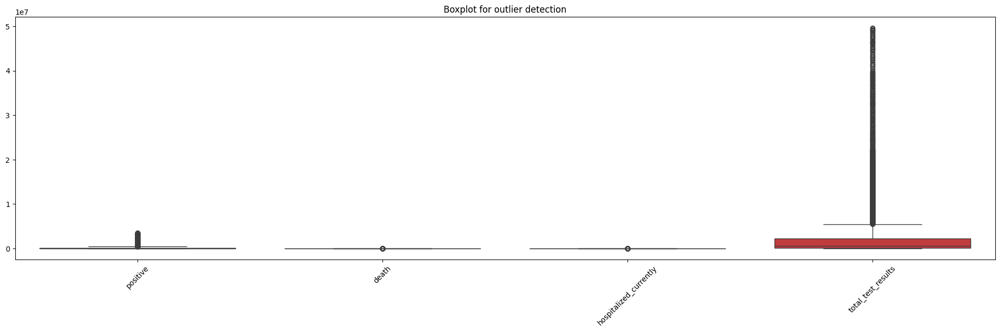

In [18]:
# Checking for the outliers
plt.figure(figsize=(24, 6))

# Boxplot for multiple columns
sns.boxplot(data=df_to_check_outliers_low_null) # First checking the df with low percentage of nulls and then the second one with high percentage of nulls
plt.xticks(rotation=45) # Changing the rotation depending on the quaatity of columns
plt.title("Boxplot for outlier detection")
plt.show()


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\1544112004.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_check_outliers_low_null[col] = df_to_check_outliers_low_null[col].clip(lower=lower_limit, upper=upper_limit)
C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\1544112004.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_check_outliers_low_null[col] = df_to_check_outliers_low_null[col].clip(lower=lower_limit, upper=upper_limit)
C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\154411

<Axes: title={'center': 'Boxplot for outlier detection with capped data (Winsorized)'}>

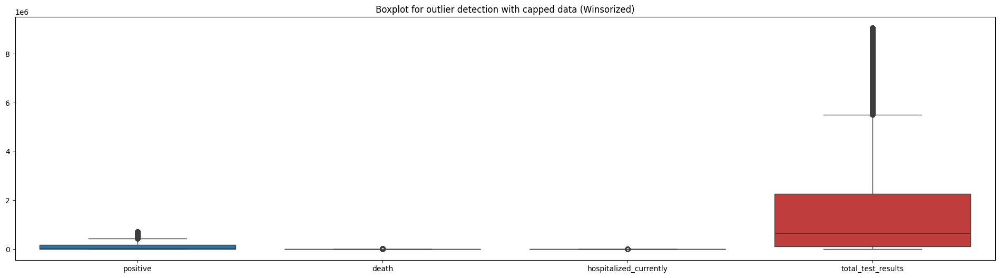

In [19]:
# Capping outliers (Winsorizing) using the 95th percentile 
for col in df_to_check_outliers_low_null.columns:
    upper_limit = df_to_check_outliers_low_null[col].quantile(0.95) # Setting upper limit to 95th percentile (what is higher than 95th percentile will be set to 95th percentile)
    lower_limit = df_to_check_outliers_low_null[col].quantile(0.05) # Setting lower limit to 5th percentile (what is lower than 5th percentile will be set to 5th percentile)
    df_to_check_outliers_low_null[col] = df_to_check_outliers_low_null[col].clip(lower=lower_limit, upper=upper_limit)

# Visualize the capped data
plt.figure(figsize=(24, 6))
plt.title("Boxplot for outlier detection with capped data (Winsorized)")
sns.boxplot(data=df_to_check_outliers_low_null)


In [20]:
df_states_daily.columns

Index(['date', 'state', 'positive', 'probable_cases', 'negative',
       'total_test_results', 'hospitalized_currently',
       'hospitalized_cumulative', 'in_icu_currently', 'in_icu_cumulative',
       'recovered', 'last_update_et', 'death', 'total_tests_viral',
       'positive_tests_viral', 'negative_tests_viral', 'positive_cases_viral',
       'death_confirmed', 'death_probable', 'total_tests_people_viral',
       'positive_increase', 'total_test_results_increase', 'death_increase',
       'hospitalized_increase'],
      dtype='object')

####   <span style="color:#f6f794">  Checking distribuition of data (not droping any null (nan))</span>

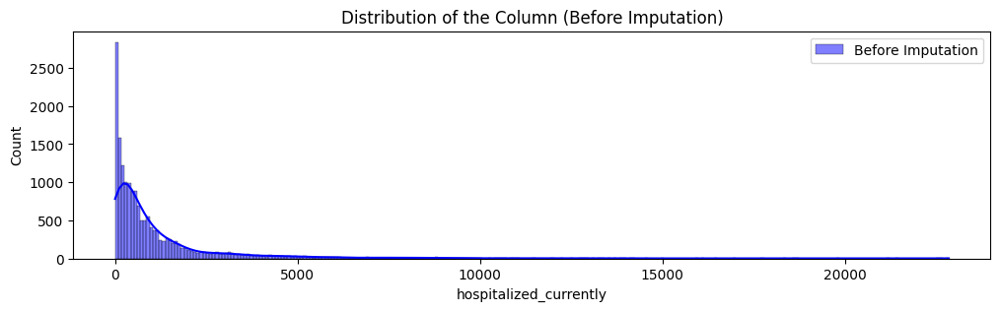

In [21]:
plt.figure(figsize=(12, 3))
sns.histplot(df_states_daily['hospitalized_currently'].dropna(), kde=True, color='blue', label='Before Imputation')
plt.title('Distribution of the Column (Before Imputation)')
plt.legend()
plt.show()

####   <span style="color:#f6f794">  Checking distribuition if impute with **mean** or **median** </span>

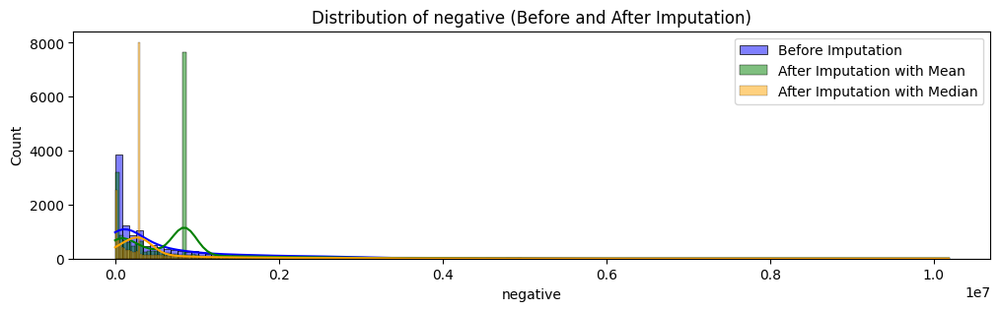

In [22]:
def plot_mean_median_imputation(df, column_name):

    df_imputed_mean = df.copy() # Copying the df to not change the original one
    df_imputed_mean[column_name] = df_imputed_mean[column_name].fillna(df_imputed_mean[column_name].mean())

    df_imputed_median = df.copy()
    df_imputed_median[column_name] = df_imputed_median[column_name].fillna(df_imputed_median[column_name].median())

    plt.figure(figsize=(12, 3))

    sns.histplot(df[column_name].dropna(), kde=True, color='blue', label='Before Imputation')
    sns.histplot(df_imputed_mean[column_name], kde=True, color='green', label='After Imputation with Mean')
    sns.histplot(df_imputed_median[column_name], kde=True, color='orange', label='After Imputation with Median')

    plt.title(f'Distribution of {column_name} (Before and After Imputation)')
    plt.legend()
    plt.show()

# Example usage:
plot_mean_median_imputation(df_states_daily, 'negative')

#### Now, same but, by states

No non-null values for negative in AK. Skipping.

--- Checking Imputation Viability for negative in AL ---


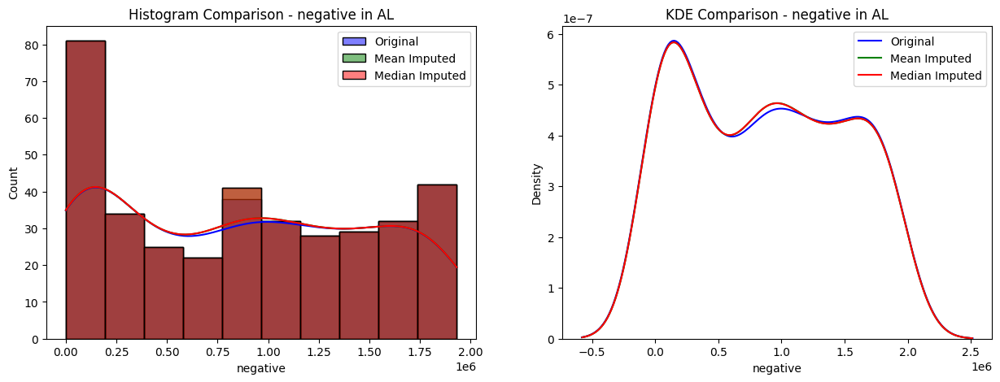


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.004154811904439326), pvalue=np.float64(1.0), statistic_location=np.float64(863982.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.004087070405997381), pvalue=np.float64(1.0), statistic_location=np.float64(858789.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in AR ---


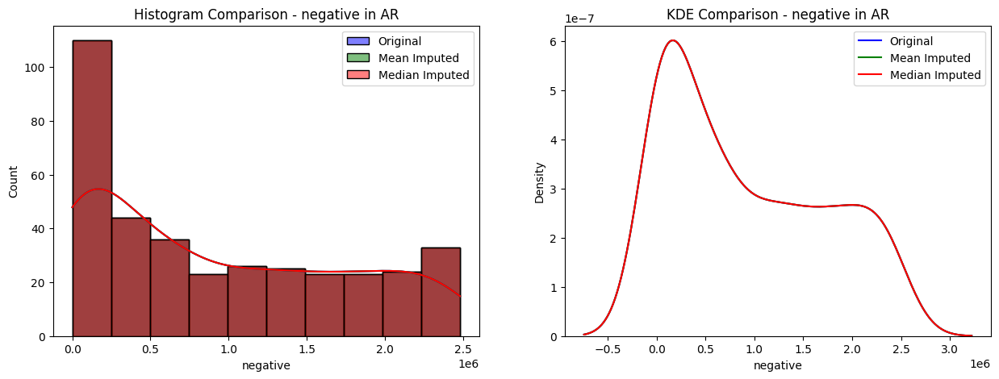


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in AS ---


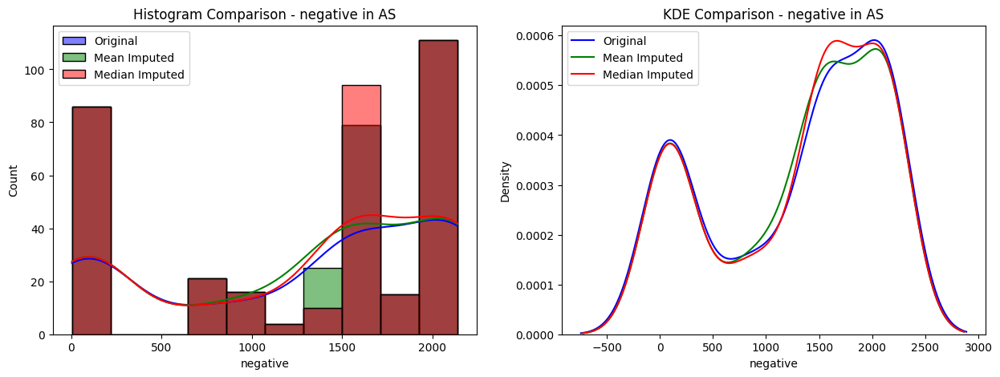


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0264140744016905), pvalue=np.float64(0.9993312477102947), statistic_location=np.float64(1299.798245614035), statistic_sign=np.int8(-1))
Median vs Original: KstestResult(statistic=np.float64(0.01977984176126591), pvalue=np.float64(0.9999989672972796), statistic_location=np.float64(1514.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in AZ ---


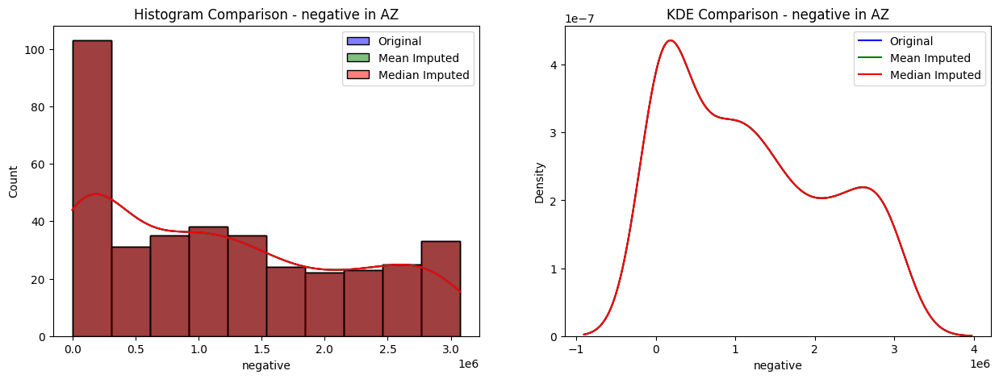


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in CA ---


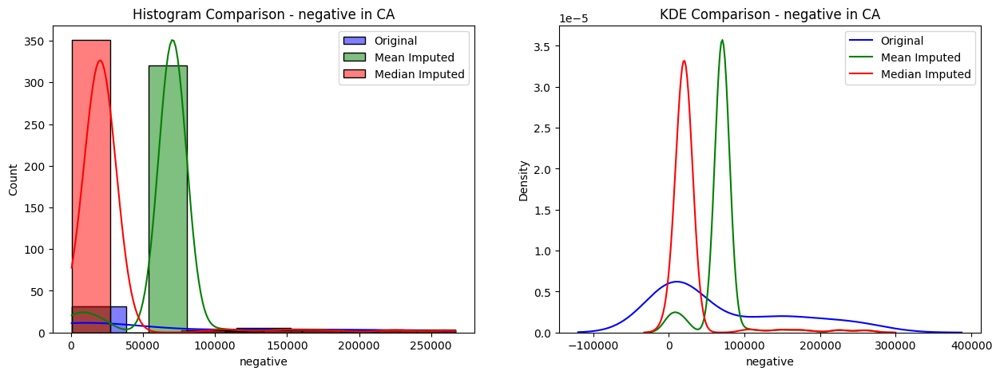


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.5486422211160887), pvalue=np.float64(1.1607521672749022e-12), statistic_location=np.float64(24599.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.4247552679608429), pvalue=np.float64(1.4072720510453534e-07), statistic_location=np.float64(17380.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in CO ---


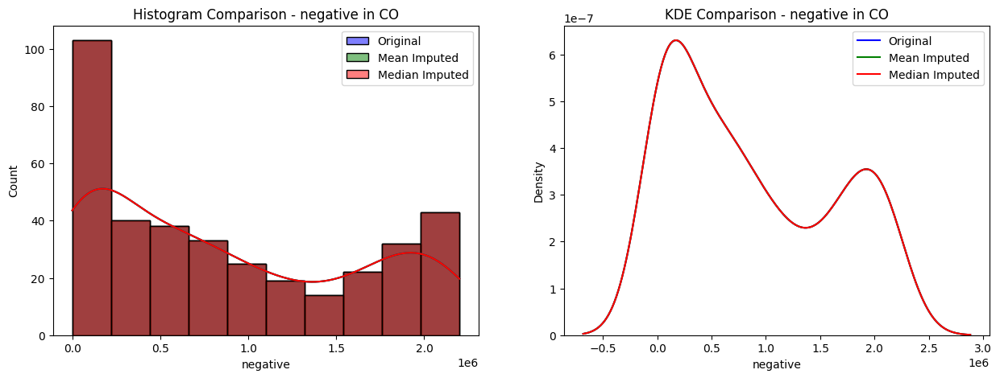


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
No non-null values for negative in CT. Skipping.
No non-null values for negative in DC. Skipping.

--- Checking Imputation Viability for negative in DE ---


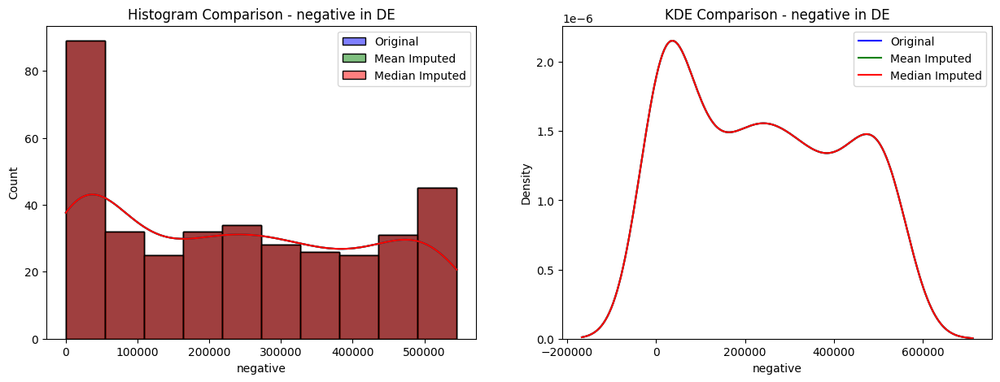


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in FL ---


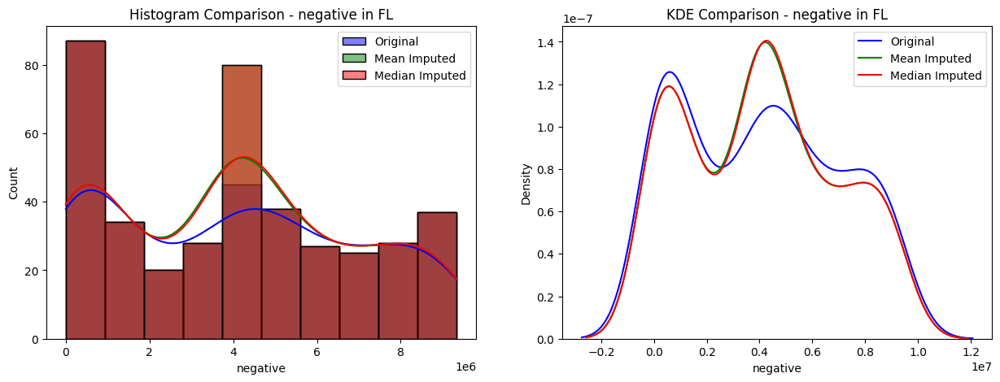


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.04413856019748316), pvalue=np.float64(0.8242458634437031), statistic_location=np.float64(4024002.701897019), statistic_sign=np.int8(-1))
Median vs Original: KstestResult(statistic=np.float64(0.04319944189540905), pvalue=np.float64(0.8429768917218494), statistic_location=np.float64(4099796.0), statistic_sign=np.int8(-1))
No non-null values for negative in GA. Skipping.

--- Checking Imputation Viability for negative in GU ---


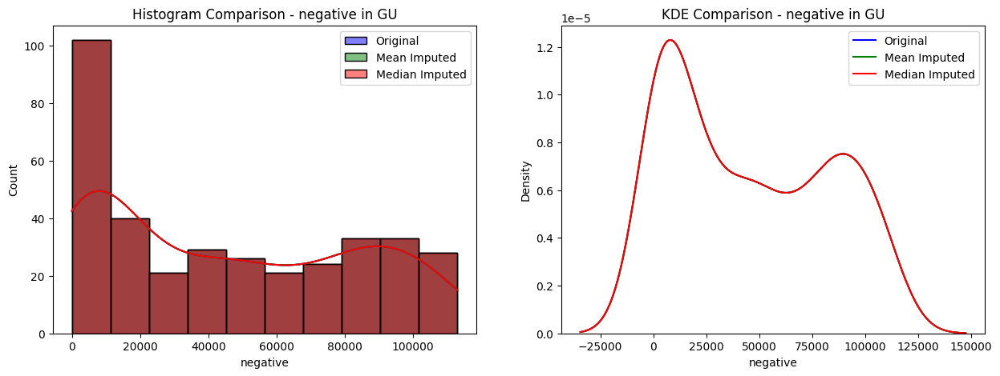


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in HI ---


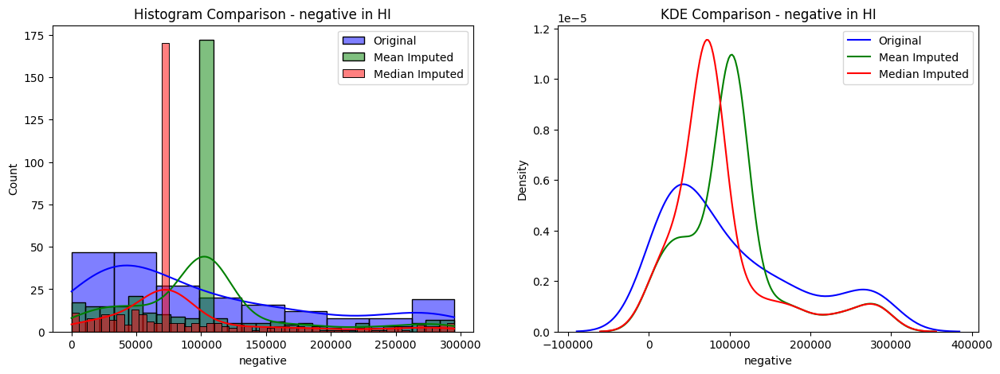


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.2696078431372549), pvalue=np.float64(6.553035503012915e-09), statistic_location=np.float64(101661.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.22357723577235772), pvalue=np.float64(2.986924554595131e-06), statistic_location=np.float64(74020.5), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in IA ---


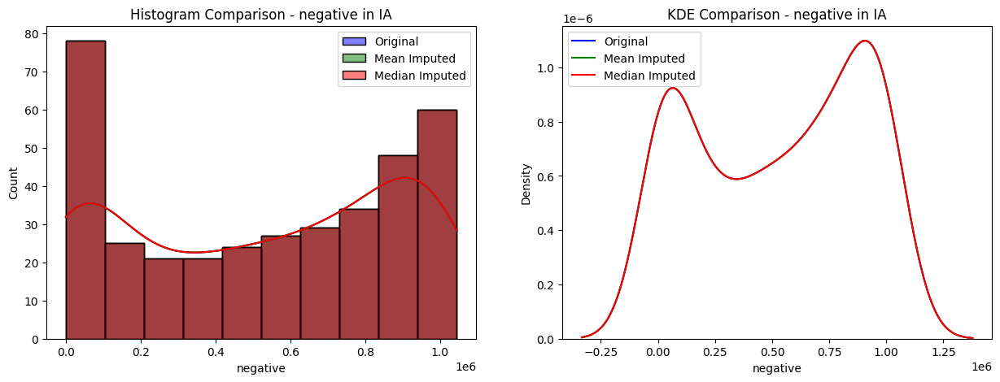


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in ID ---


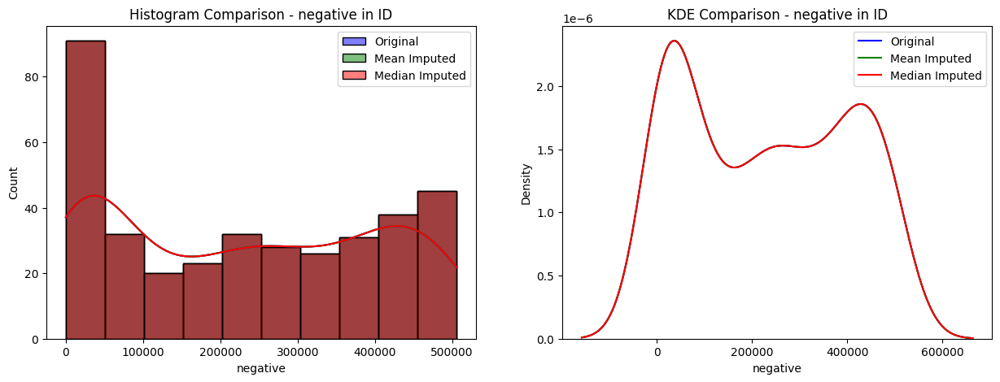


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
No non-null values for negative in IL. Skipping.

--- Checking Imputation Viability for negative in IN ---


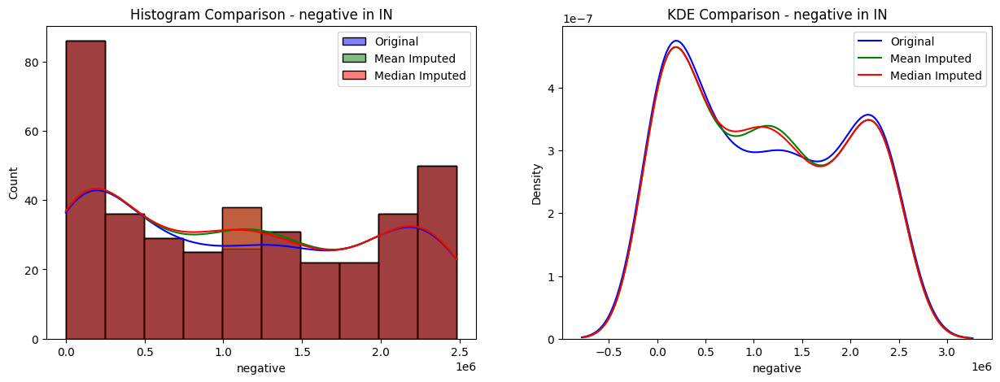


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.016484848484848484), pvalue=np.float64(0.9999999950912635), statistic_location=np.float64(1102419.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.015955922865013773), pvalue=np.float64(0.9999999985988817), statistic_location=np.float64(1046178.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in KS ---


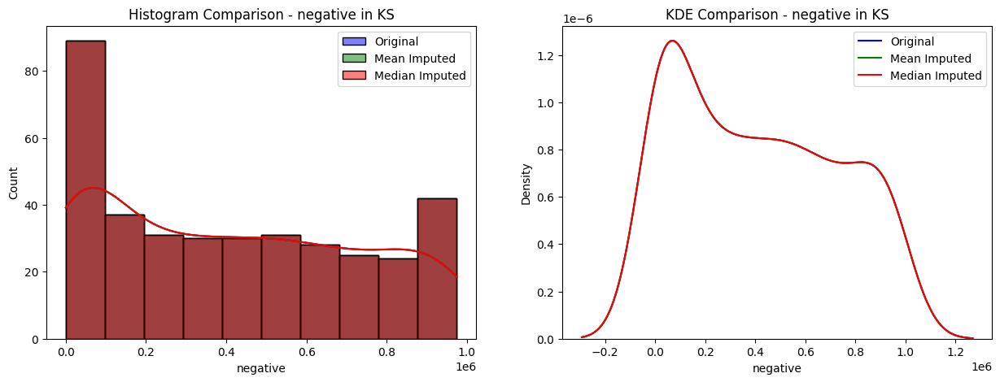


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
No non-null values for negative in KY. Skipping.

--- Checking Imputation Viability for negative in LA ---


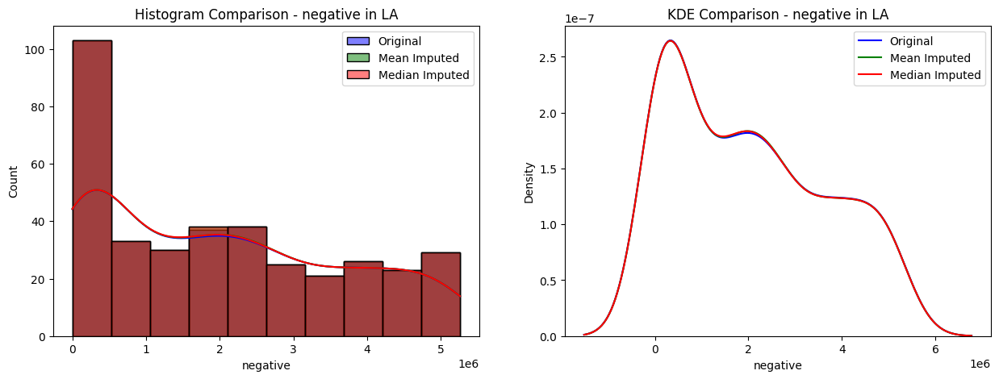


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0014671756868029045), pvalue=np.float64(1.0), statistic_location=np.float64(1985664.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0013623774234598398), pvalue=np.float64(1.0), statistic_location=np.float64(1780275.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MA ---


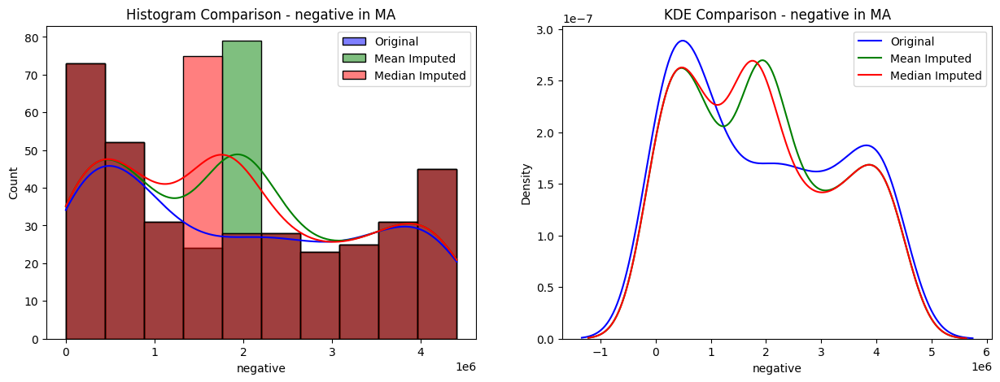


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.06549067315490673), pvalue=np.float64(0.36199876851940005), statistic_location=np.float64(1921953.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.06204379562043796), pvalue=np.float64(0.42803358110841633), statistic_location=np.float64(1755759.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MD ---


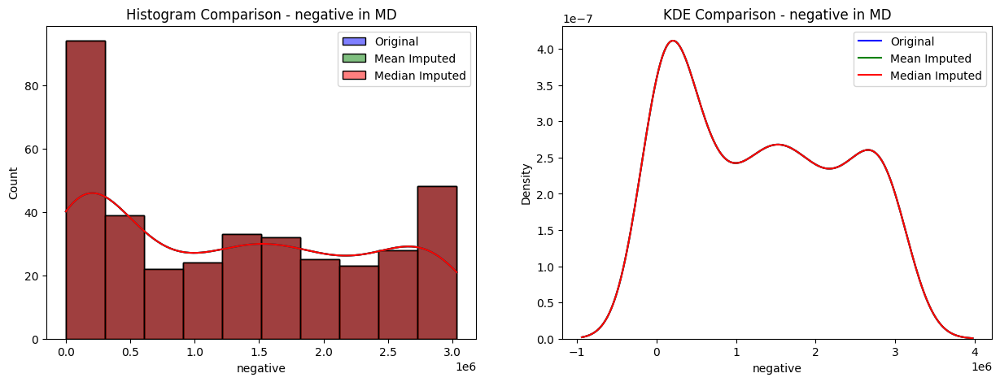


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
No non-null values for negative in ME. Skipping.
No non-null values for negative in MI. Skipping.

--- Checking Imputation Viability for negative in MN ---


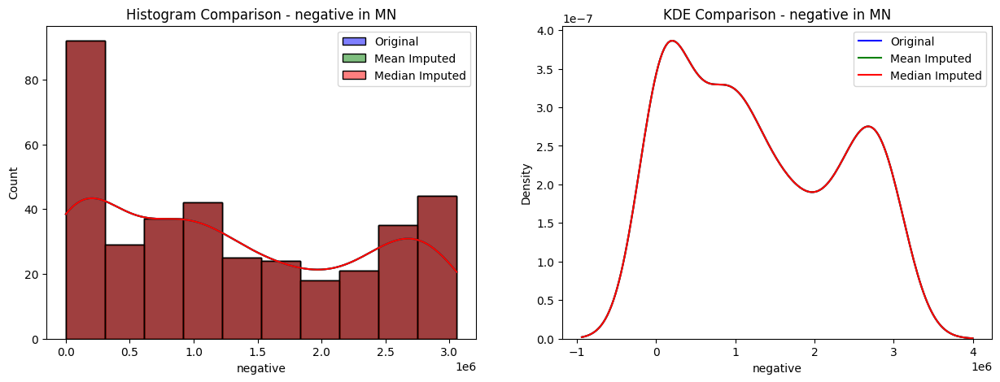


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MO ---


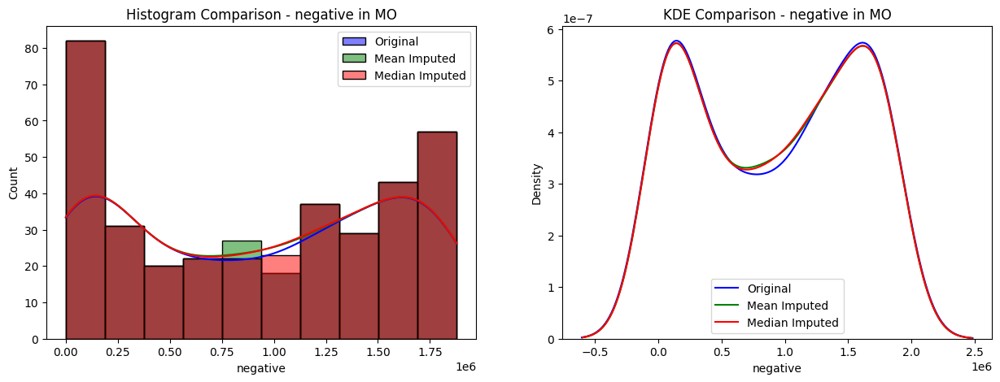


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0070008930869018965), pvalue=np.float64(1.0), statistic_location=np.float64(921025.0637119113), statistic_sign=np.int8(-1))
Median vs Original: KstestResult(statistic=np.float64(0.006811679760228872), pvalue=np.float64(1.0), statistic_location=np.float64(960045.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MP ---


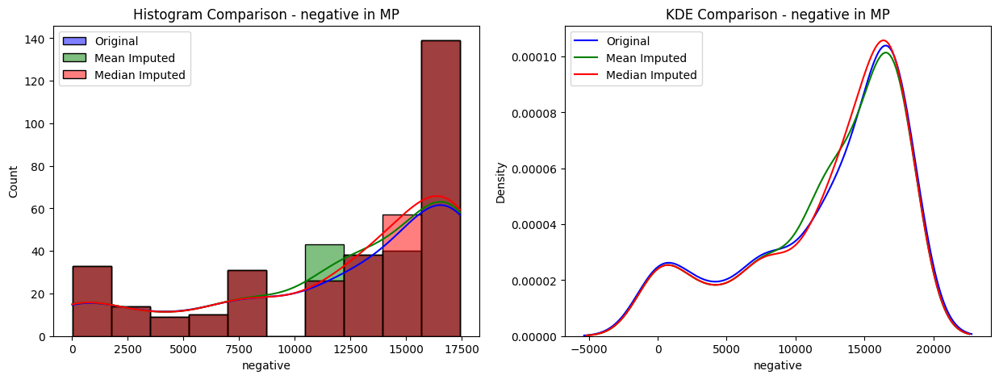


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.030392156862745098), pvalue=np.float64(0.995039108307464), statistic_location=np.float64(12159.344117647059), statistic_sign=np.int8(-1))
Median vs Original: KstestResult(statistic=np.float64(0.023249299719887956), pvalue=np.float64(0.9999457034660153), statistic_location=np.float64(14316.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MS ---


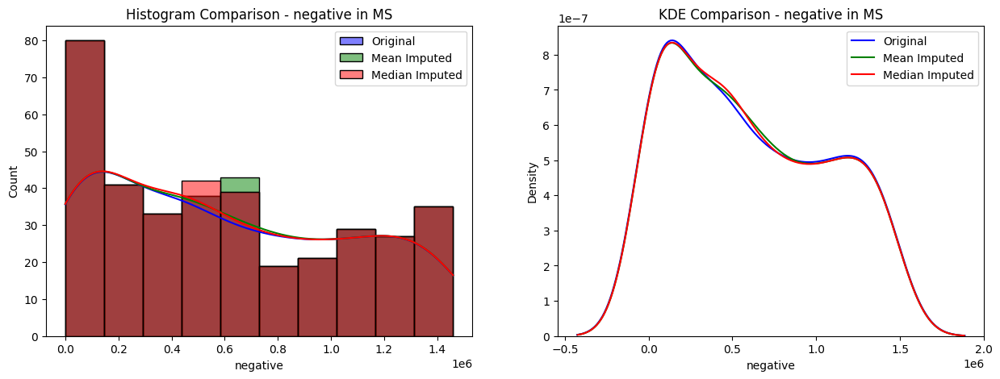


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.005796576397065483), pvalue=np.float64(1.0), statistic_location=np.float64(541497.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.00546448087431694), pvalue=np.float64(1.0), statistic_location=np.float64(510921.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MT ---


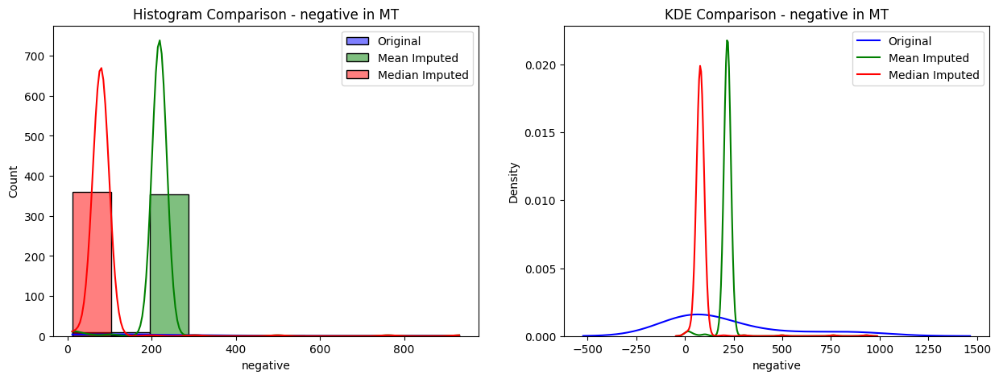


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.6869633099141296), pvalue=np.float64(8.009585060811414e-07), statistic_location=np.float64(198.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.4808743169398907), pvalue=np.float64(0.0021663941503795967), statistic_location=np.float64(55.0), statistic_sign=np.int8(1))
No non-null values for negative in NC. Skipping.

--- Checking Imputation Viability for negative in ND ---


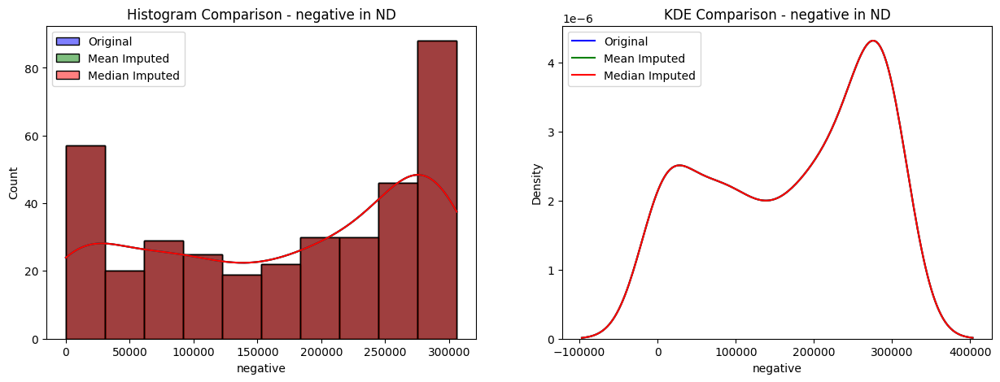


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NE ---


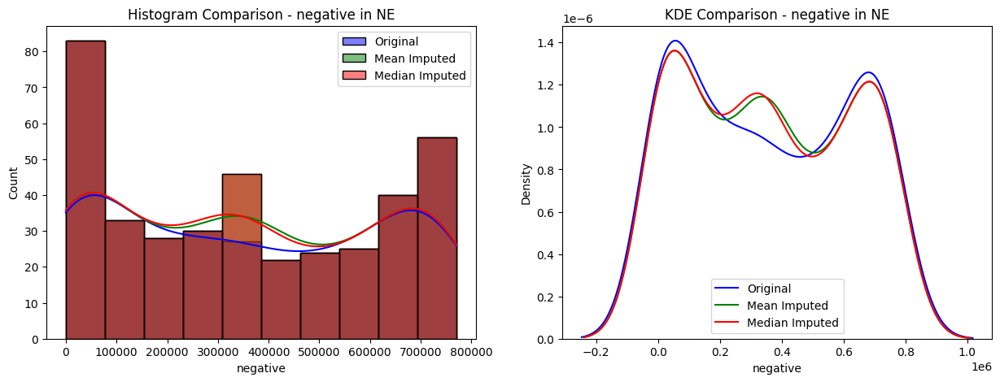


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.02548168745084822), pvalue=np.float64(0.9993175854860677), statistic_location=np.float64(356439.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.02454780361757106), pvalue=np.float64(0.9996441979983345), statistic_location=np.float64(338123.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NH ---


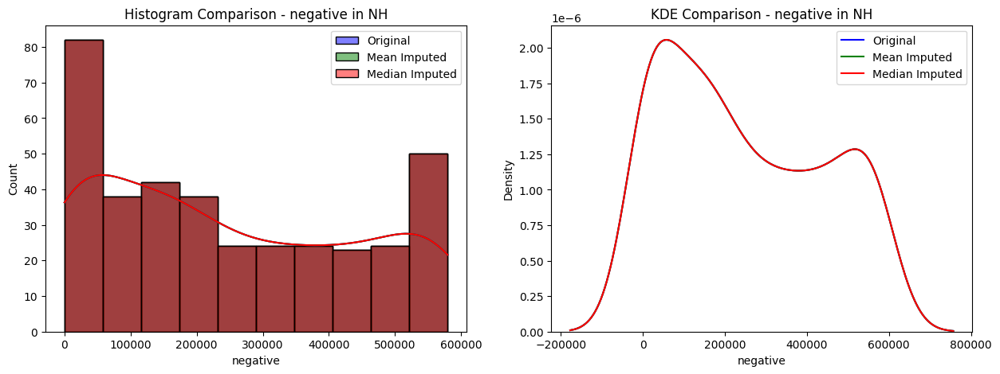


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NJ ---


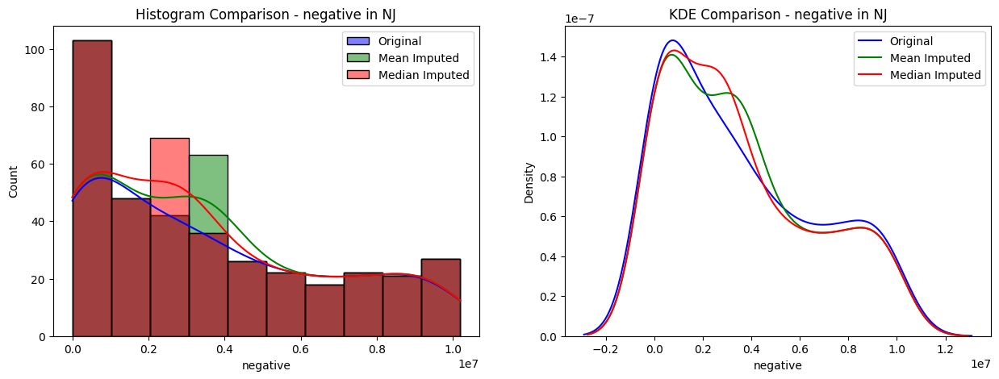


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.04038300251607492), pvalue=np.float64(0.900075006666252), statistic_location=np.float64(3571960.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.03434442270058708), pvalue=np.float64(0.9710926505372518), statistic_location=np.float64(2771300.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NM ---


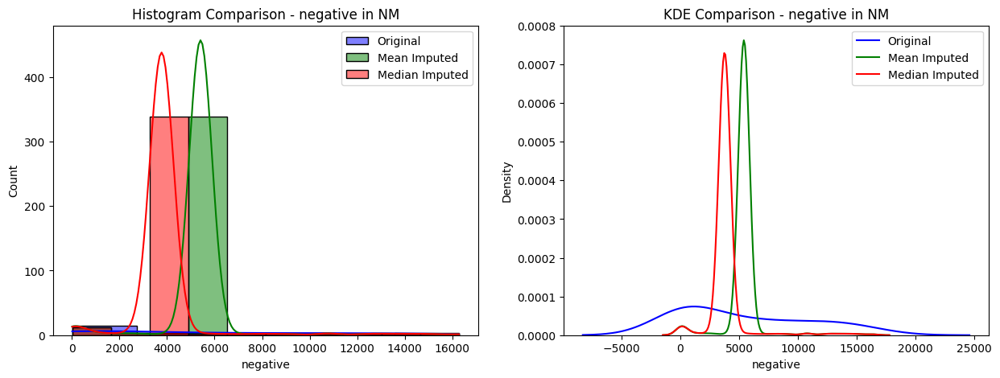


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.5317321178120618), pvalue=np.float64(4.799832559622769e-08), statistic_location=np.float64(5321.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.4431100981767181), pvalue=np.float64(1.2593070258428459e-05), statistic_location=np.float64(2762.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NV ---


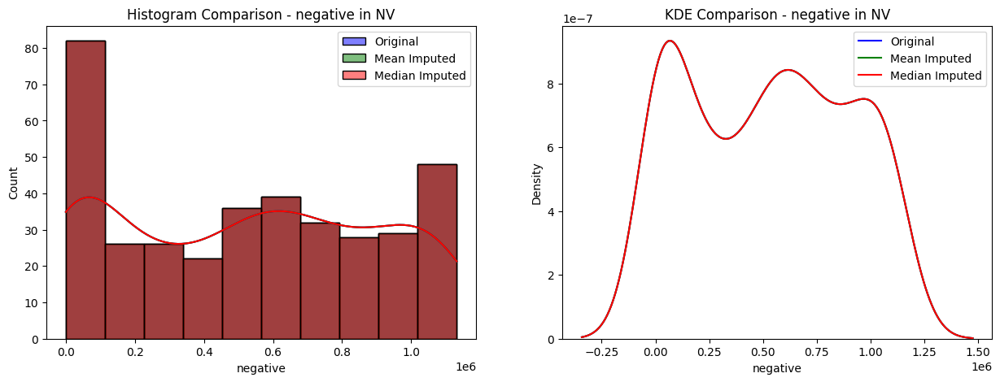


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
No non-null values for negative in NY. Skipping.
No non-null values for negative in OH. Skipping.

--- Checking Imputation Viability for negative in OK ---


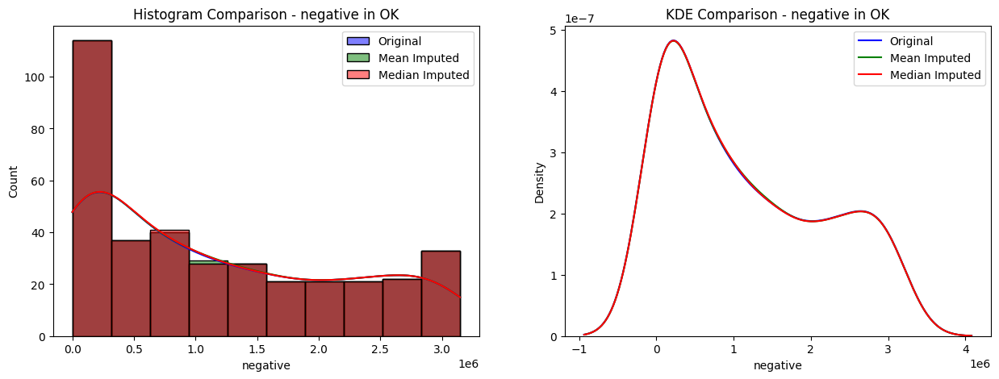


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0015644883599071787), pvalue=np.float64(1.0), statistic_location=np.float64(1140601.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0013548918332210494), pvalue=np.float64(1.0), statistic_location=np.float64(852355.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in OR ---


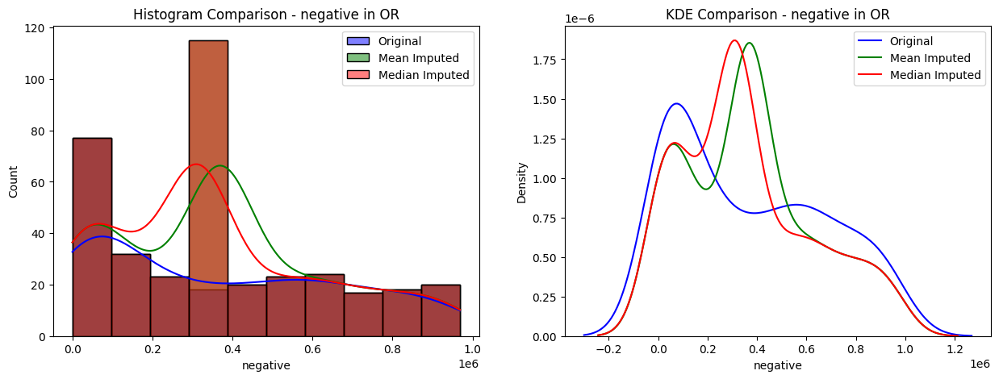


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.14110074924278654), pvalue=np.float64(0.003431490156714845), statistic_location=np.float64(365478.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.13143631436314362), pvalue=np.float64(0.00792337765487018), statistic_location=np.float64(310393.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in PA ---


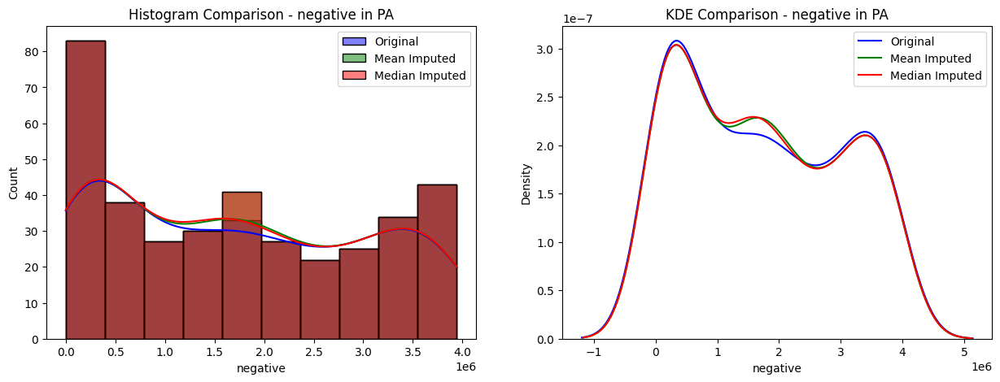


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.011408093176048977), pvalue=np.float64(0.9999999999999991), statistic_location=np.float64(1721275.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.010810810810810811), pvalue=np.float64(0.9999999999999993), statistic_location=np.float64(1608378.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in PR ---


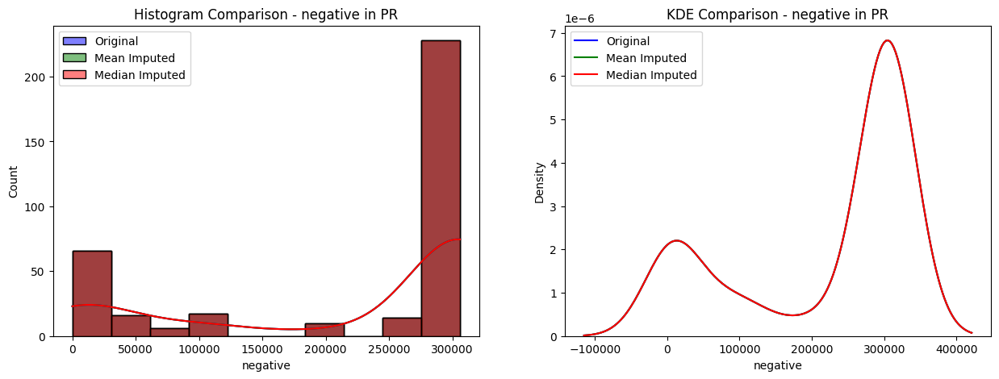


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in RI ---


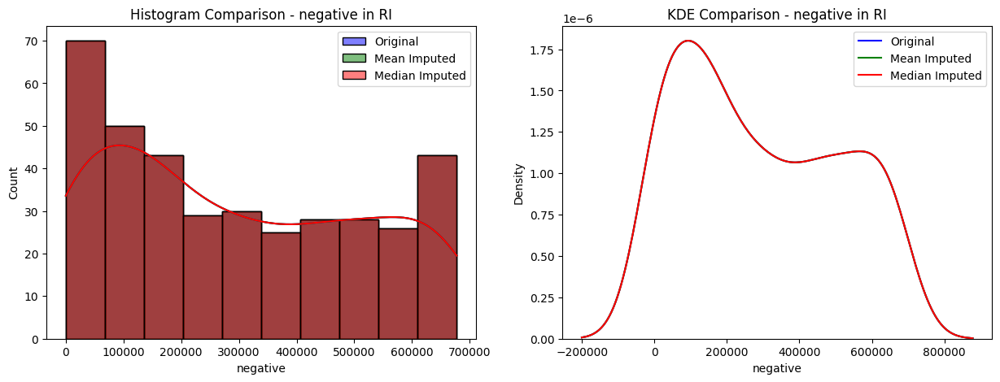


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in SC ---


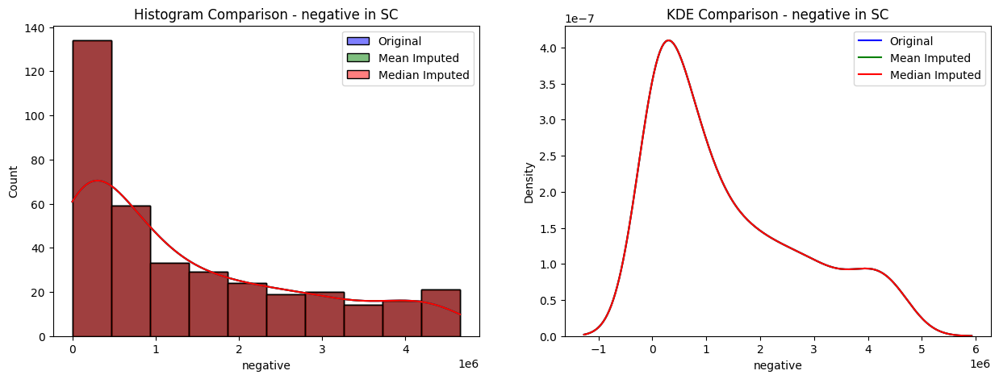


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in SD ---


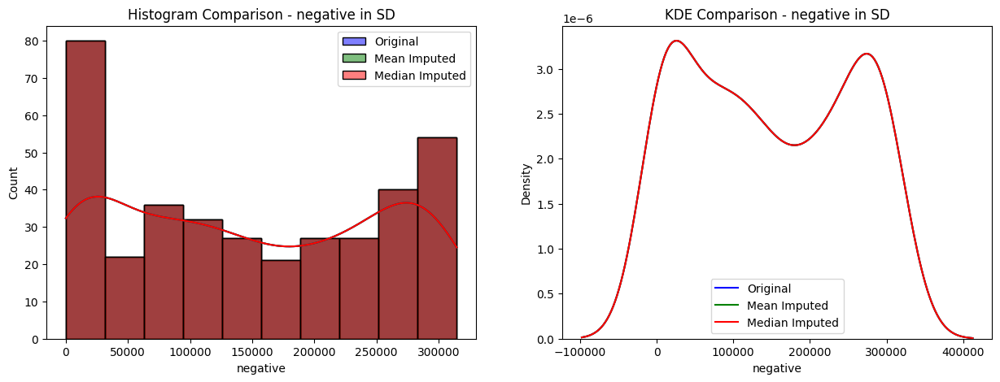


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
No non-null values for negative in TN. Skipping.
No non-null values for negative in TX. Skipping.

--- Checking Imputation Viability for negative in UT ---


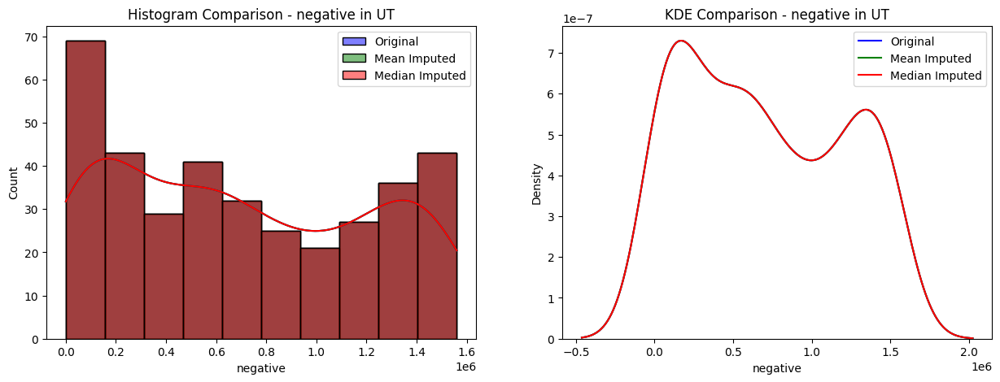


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
No non-null values for negative in VA. Skipping.

--- Checking Imputation Viability for negative in VI ---


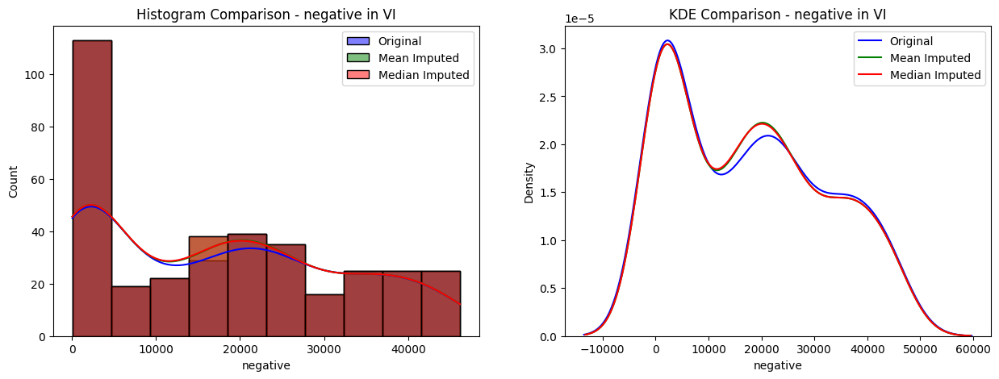


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.012822370327441322), pvalue=np.float64(0.9999999999999947), statistic_location=np.float64(17541.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.012605042016806723), pvalue=np.float64(0.9999999999999981), statistic_location=np.float64(17130.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in VT ---


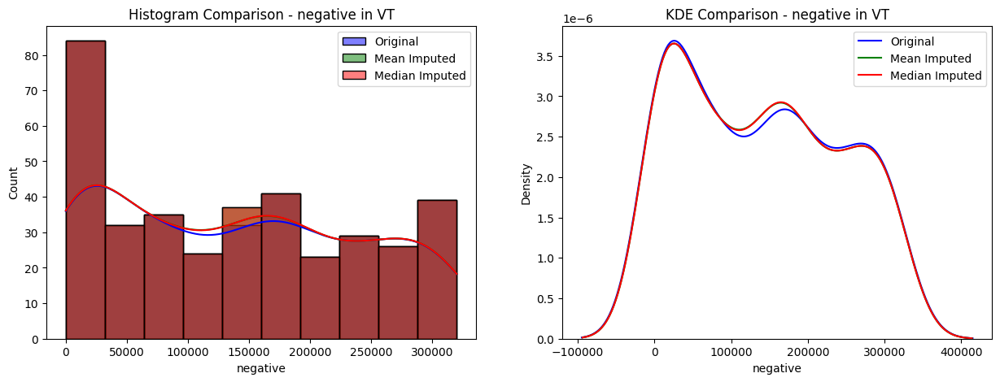


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.00684931506849315), pvalue=np.float64(1.0), statistic_location=np.float64(139009.5205479452), statistic_sign=np.int8(-1))
Median vs Original: KstestResult(statistic=np.float64(0.006738245094409478), pvalue=np.float64(1.0), statistic_location=np.float64(140007.0), statistic_sign=np.int8(1))
No non-null values for negative in WA. Skipping.

--- Checking Imputation Viability for negative in WI ---


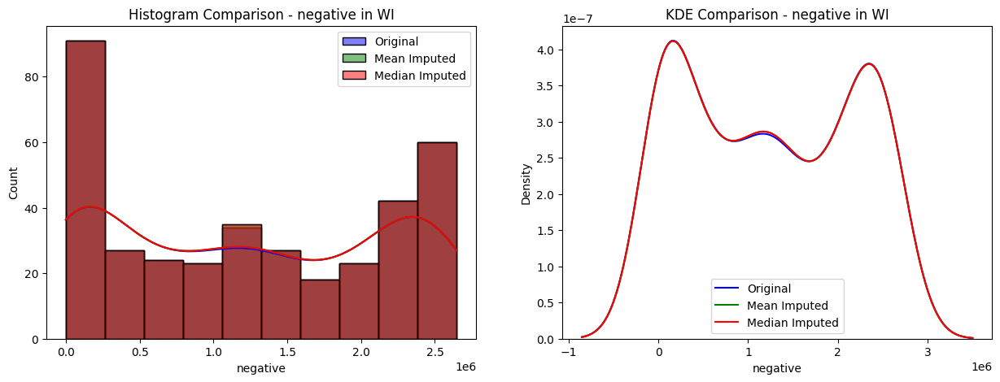


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.0013916355379770015), pvalue=np.float64(1.0), statistic_location=np.float64(1238173.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.0013476891525672013), pvalue=np.float64(1.0), statistic_location=np.float64(1210203.0), statistic_sign=np.int8(-1))
No non-null values for negative in WV. Skipping.

--- Checking Imputation Viability for negative in WY ---


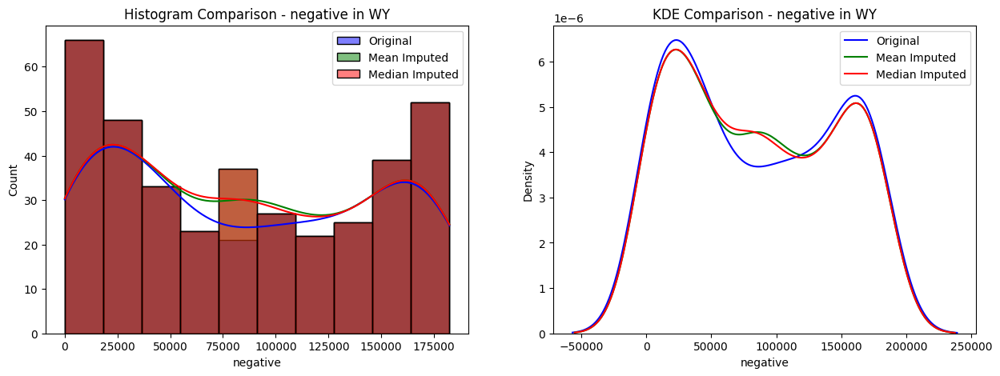


KS Test Results:
Mean vs Original: KstestResult(statistic=np.float64(0.022109459949256977), pvalue=np.float64(0.9999700946721489), statistic_location=np.float64(85307.0), statistic_sign=np.int8(1))
Median vs Original: KstestResult(statistic=np.float64(0.021505376344086023), pvalue=np.float64(0.9999841326288796), statistic_location=np.float64(81100.0), statistic_sign=np.int8(1))


In [23]:
def check_imputation_viability_mean_median(df, column_name, state_column):
 
    for state in df[state_column].unique():
        state_df = df[df[state_column] == state].copy() # Copying the df to not change the original one
        original_state_values = state_df[column_name].dropna()

        if original_state_values.empty:
            print(f"No non-null values for {column_name} in {state}. Skipping.")
            continue

        print(f"\n--- Checking Imputation Viability for {column_name} in {state} ---")

        # Mean Imputation
        mean_imputed_values = state_df[column_name].fillna(state_df[column_name].mean())

        # Median Imputation
        median_imputed_values = state_df[column_name].fillna(state_df[column_name].median())

        # Visual Comparison (Histograms)
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 2, 1)
        sns.histplot(original_state_values, kde=True, color='blue', label='Original')
        sns.histplot(mean_imputed_values, kde=True, color='green', label='Mean Imputed', alpha=0.5)
        sns.histplot(median_imputed_values, kde=True, color='red', label='Median Imputed', alpha=0.5)
        plt.title(f"Histogram Comparison - {column_name} in {state}")
        plt.legend()

        plt.subplot(1, 2, 2)
        sns.kdeplot(original_state_values, color='blue', label='Original')
        sns.kdeplot(mean_imputed_values, color='green', label='Mean Imputed')
        sns.kdeplot(median_imputed_values, color='red', label='Median Imputed')
        plt.title(f"KDE Comparison - {column_name} in {state}")
        plt.legend()

        plt.show()

        # Statistical Comparison (KS Test)
        print("\nKS Test Results:")
        print(f"Mean vs Original: {ks_2samp(original_state_values, mean_imputed_values.dropna())}")
        print(f"Median vs Original: {ks_2samp(original_state_values, median_imputed_values.dropna())}")

# Example usage:
check_imputation_viability_mean_median(df_states_daily, 'negative', 'state')

####   <span style="color:#f6f794">  Checking distribuition if impute with **KNN**, **Regression**, **Interpolation** and **Hot-Deck** </span>

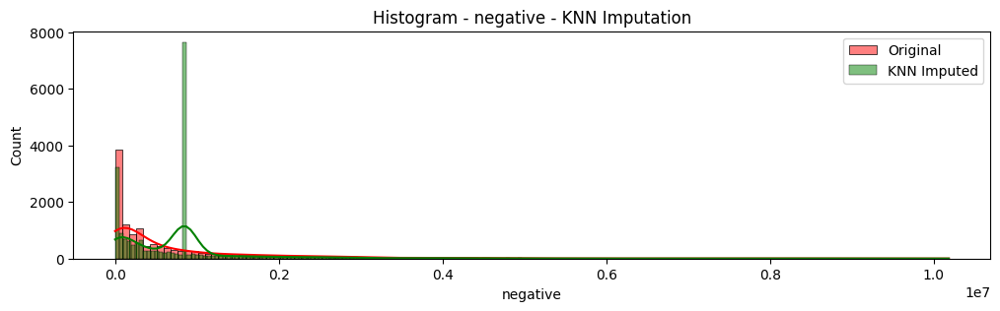

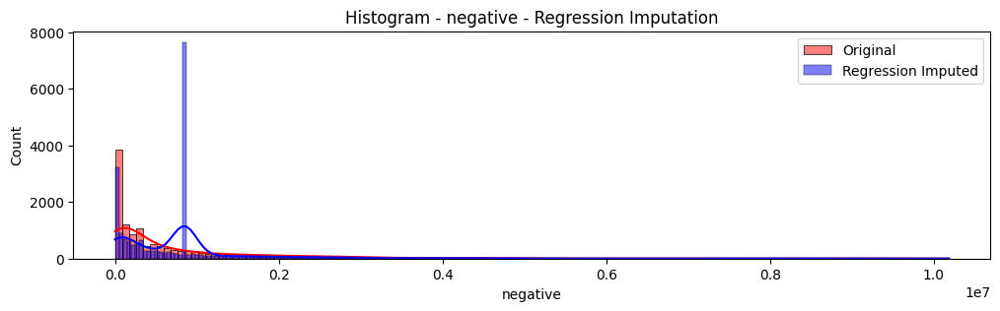

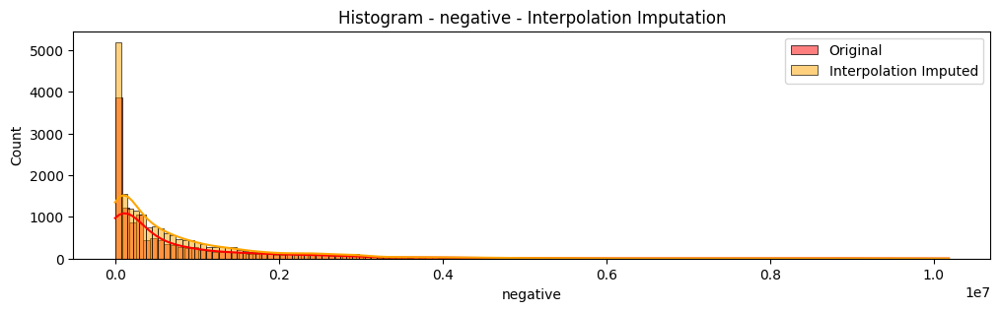

C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2880191717.py:47: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_hotdeck_impute[column_name + '_hotdeck_imputed'] = df_hotdeck_impute[column_name].fillna(method='ffill')  # Forward fill


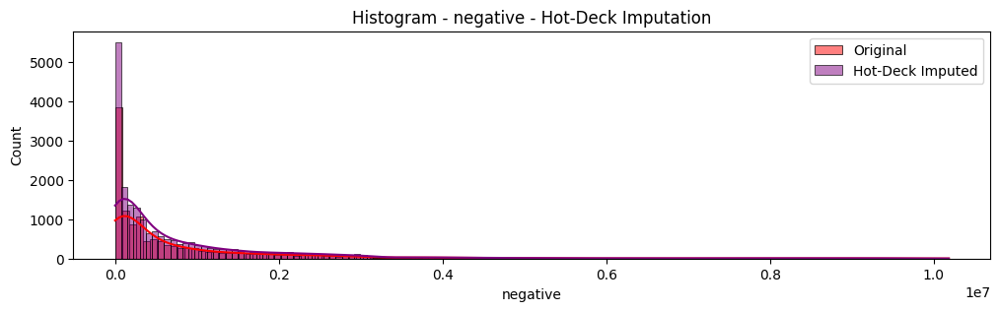

In [24]:
def evaluate_advanced_imputation(df, column_name):
    """Evaluates KNN, Regression, Interpolation, and Hot-Deck imputation."""

    df_copy = df.copy()
    original_values = df_copy[column_name].dropna().copy()

    # KNN Imputation
    df_knn_impute = df_copy.copy()
    imputer_knn = KNNImputer(n_neighbors=5)
    df_knn_impute[column_name + '_knn_imputed'] = imputer_knn.fit_transform(df_knn_impute[[column_name]])
    knn_imputed_values = df_knn_impute[column_name + '_knn_imputed']

    plt.figure(figsize=(12, 3))
    sns.histplot(original_values, kde=True, color='red', label='Original')
    sns.histplot(knn_imputed_values, kde=True, color='green', label='KNN Imputed')
    plt.title(f"Histogram - {column_name} - KNN Imputation")
    plt.legend()
    plt.show()

    # Regression Imputation (Iterative Imputer)
    df_regression_impute = df_copy.copy()
    imputer_regression = IterativeImputer(estimator=LinearRegression(), max_iter=10, random_state=0)
    df_regression_impute[column_name + '_regression_imputed'] = imputer_regression.fit_transform(df_regression_impute[[column_name]])
    regression_imputed_values = df_regression_impute[column_name + '_regression_imputed']

    plt.figure(figsize=(12, 3))
    sns.histplot(original_values, kde=True, color='red', label='Original')
    sns.histplot(regression_imputed_values, kde=True, color='blue', label='Regression Imputed')
    plt.title(f"Histogram - {column_name} - Regression Imputation")
    plt.legend()
    plt.show()

    # Interpolation Imputation
    df_interpolation_impute = df_copy.copy()
    df_interpolation_impute[column_name + '_interpolated'] = df_interpolation_impute[column_name].interpolate()
    interpolation_imputed_values = df_interpolation_impute[column_name + '_interpolated']

    plt.figure(figsize=(12, 3))
    sns.histplot(original_values, kde=True, color='red', label='Original')
    sns.histplot(interpolation_imputed_values, kde=True, color='orange', label='Interpolation Imputed')
    plt.title(f"Histogram - {column_name} - Interpolation Imputation")
    plt.legend()
    plt.show()

    # Hot-Deck Imputation (Simplified - Next Available Value)
    df_hotdeck_impute = df_copy.copy()
    df_hotdeck_impute[column_name + '_hotdeck_imputed'] = df_hotdeck_impute[column_name].fillna(method='ffill')  # Forward fill
    hotdeck_imputed_values = df_hotdeck_impute[column_name + '_hotdeck_imputed']

    plt.figure(figsize=(12, 3))
    sns.histplot(original_values, kde=True, color='red', label='Original')
    sns.histplot(hotdeck_imputed_values, kde=True, color='purple', label='Hot-Deck Imputed')
    plt.title(f"Histogram - {column_name} - Hot-Deck Imputation")
    plt.legend()
    plt.show()

# Calling function
evaluate_advanced_imputation(df_states_daily, 'negative')

#### Now, same but by states

No non-null values for negative in AK. Skipping.

--- Checking Imputation Viability for negative in AL ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


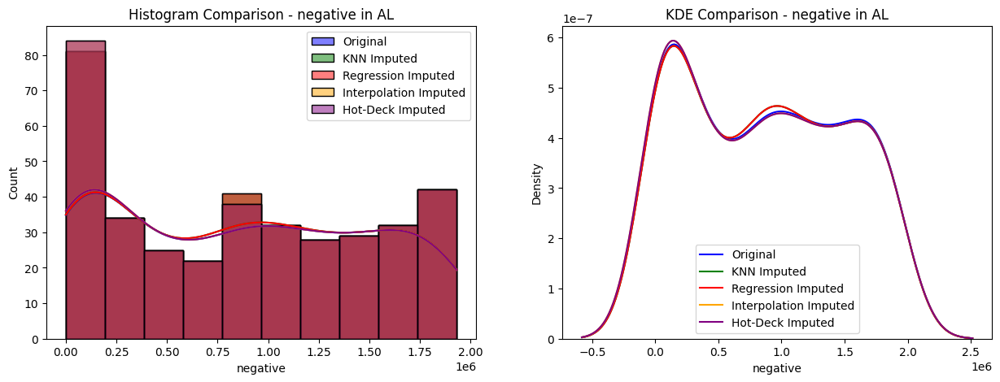


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.004154811904439326), pvalue=np.float64(1.0), statistic_location=np.float64(863982.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.004154811904439326), pvalue=np.float64(1.0), statistic_location=np.float64(863982.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.008174140811994761), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.008174140811994761), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in AR ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


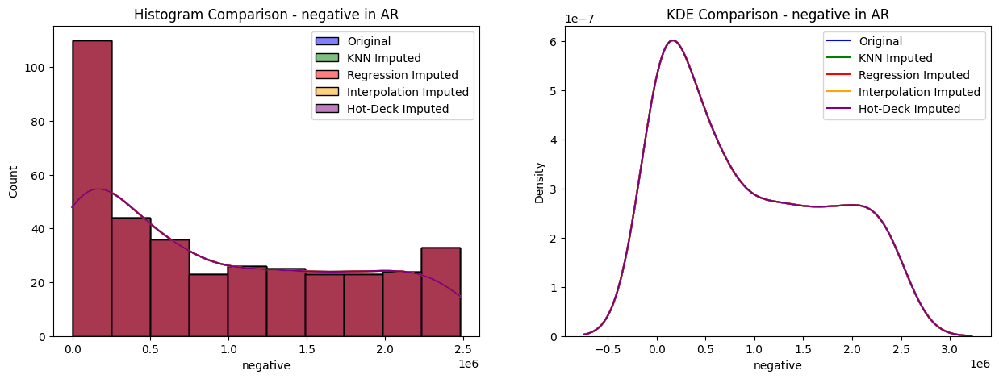


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in AS ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


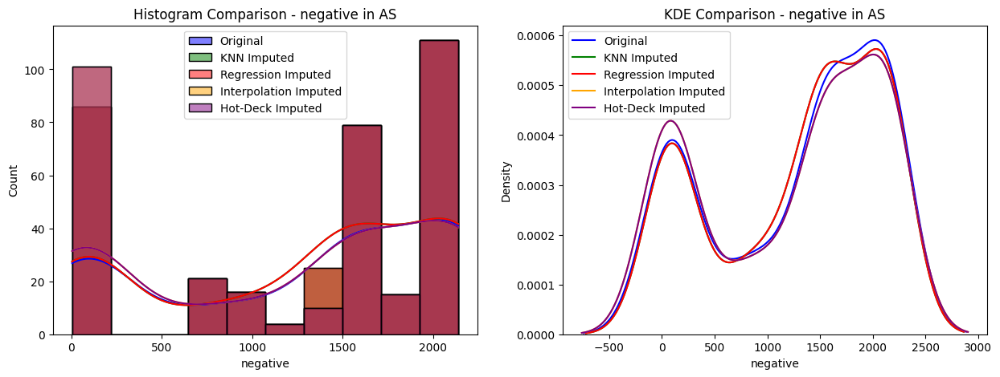


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0264140744016905), pvalue=np.float64(0.9993312477102947), statistic_location=np.float64(1299.798245614035), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.0264140744016905), pvalue=np.float64(0.9993312477102947), statistic_location=np.float64(1299.798245614035), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.03820826576244533), pvalue=np.float64(0.9483366741020861), statistic_location=np.float64(3.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.03820826576244533), pvalue=np.float64(0.9483366741020861), statistic_location=np.float64(3.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in AZ ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


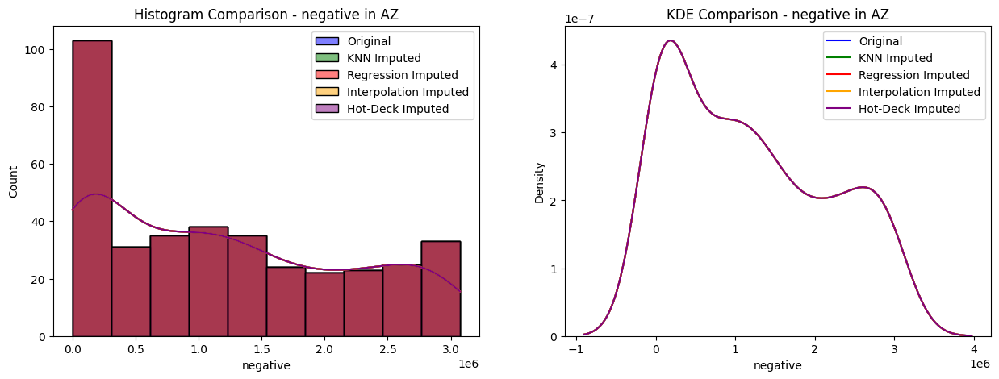


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in CA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


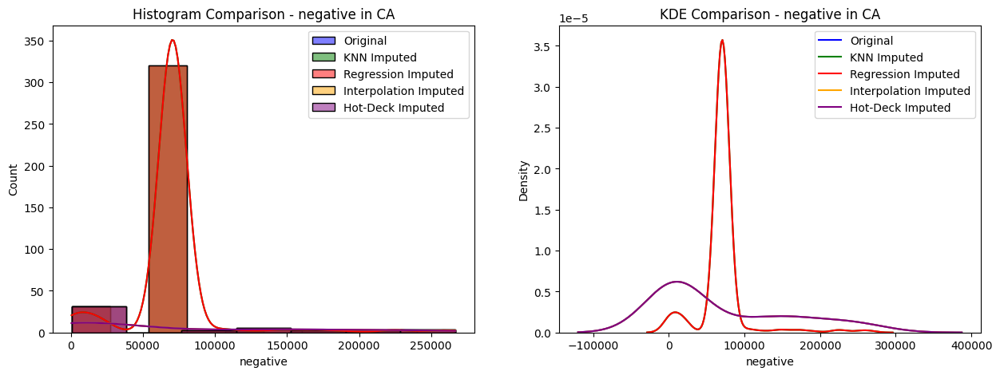


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.5486422211160887), pvalue=np.float64(1.1607521672749022e-12), statistic_location=np.float64(24599.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.5486422211160887), pvalue=np.float64(1.1607521672749022e-12), statistic_location=np.float64(24599.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
Hot-Deck vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))

--- Checking Imputation Viability for negative in CO ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


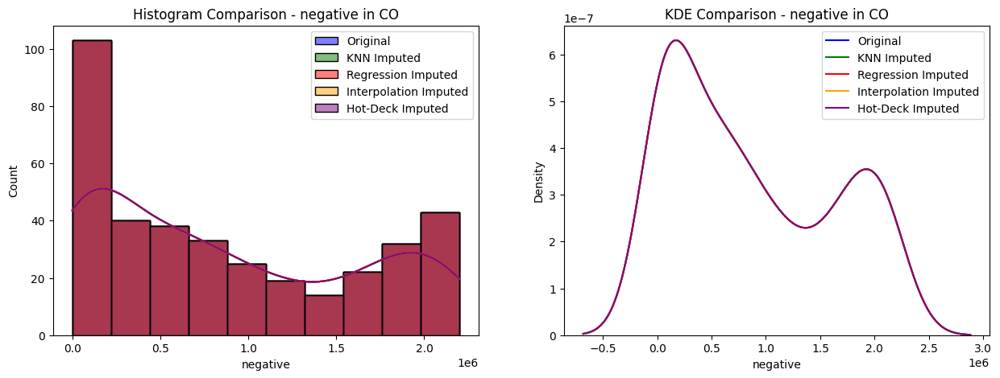


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
No non-null values for negative in CT. Skipping.
No non-null values for negative in DC. Skipping.

--- Checking Imputation Viability for negative in DE ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


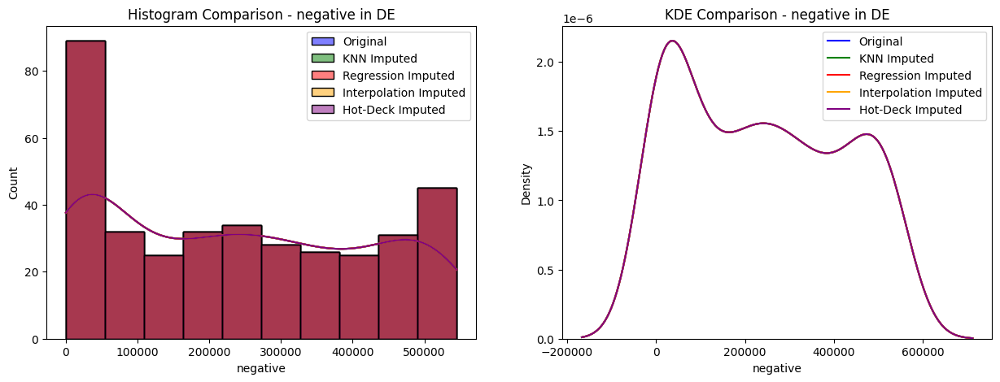


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in FL ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


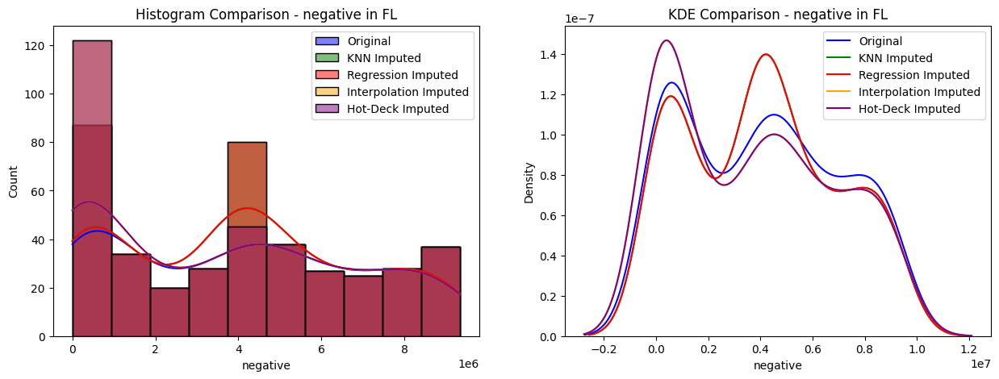


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.04413856019748316), pvalue=np.float64(0.8242458634437031), statistic_location=np.float64(4024002.701897019), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.04413856019748316), pvalue=np.float64(0.8242458634437031), statistic_location=np.float64(4024002.701897019), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0863988837908181), pvalue=np.float64(0.10388760433393412), statistic_location=np.float64(24.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0863988837908181), pvalue=np.float64(0.10388760433393412), statistic_location=np.float64(24.0), statistic_sign=np.int8(-1))
No non-null values for negative in GA. Skipping.

--- Checking Imputation Viability for negative in GU ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


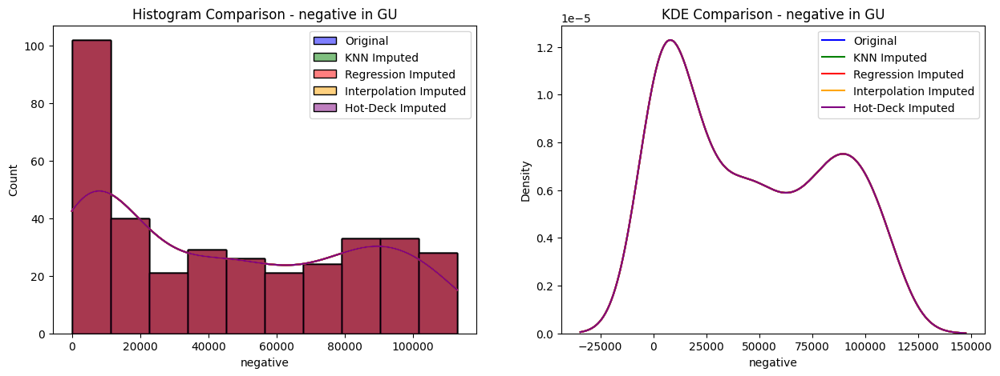


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in HI ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


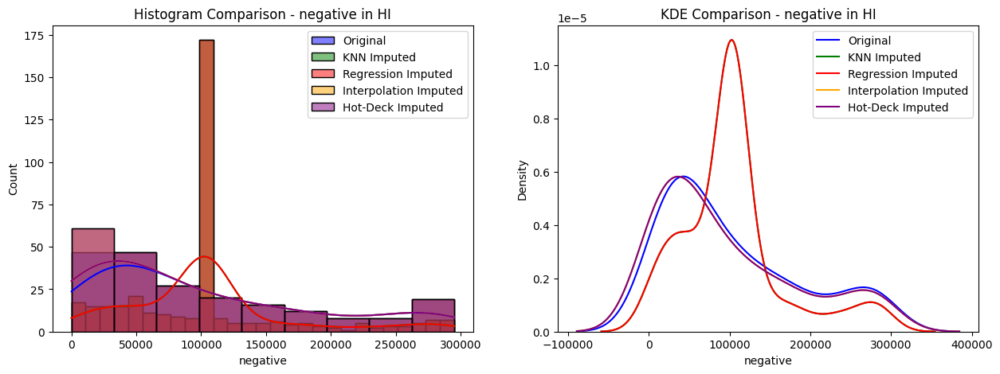


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.2696078431372549), pvalue=np.float64(6.553035503012915e-09), statistic_location=np.float64(101661.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.2696078431372549), pvalue=np.float64(6.553035503012915e-09), statistic_location=np.float64(101661.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
Hot-Deck vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))

--- Checking Imputation Viability for negative in IA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


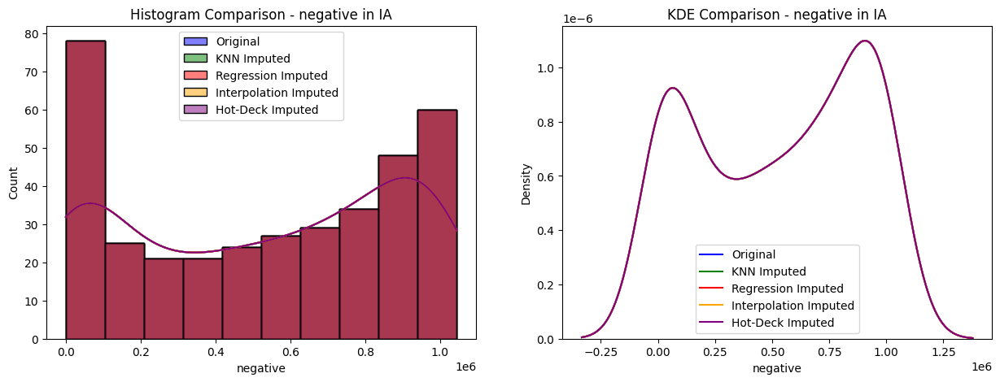


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in ID ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


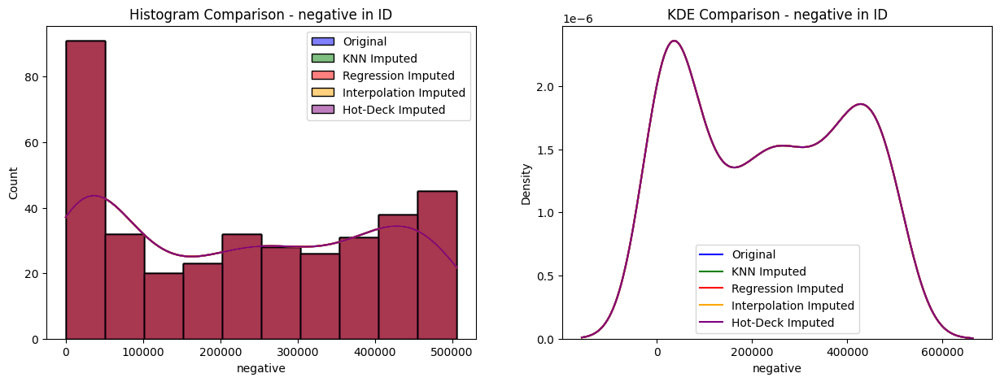


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
No non-null values for negative in IL. Skipping.

--- Checking Imputation Viability for negative in IN ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


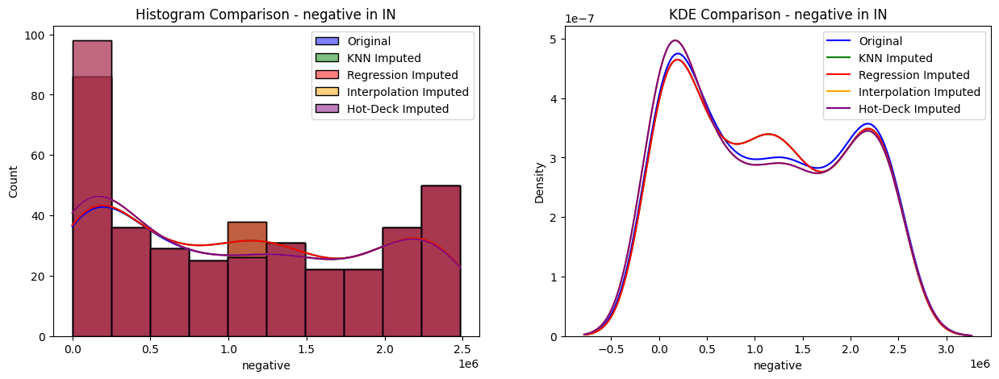


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.016484848484848484), pvalue=np.float64(0.9999999950912635), statistic_location=np.float64(1102419.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.016484848484848484), pvalue=np.float64(0.9999999950912635), statistic_location=np.float64(1102419.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.03191184573002755), pvalue=np.float64(0.9874479158875126), statistic_location=np.float64(30.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.03191184573002755), pvalue=np.float64(0.9874479158875126), statistic_location=np.float64(30.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in KS ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


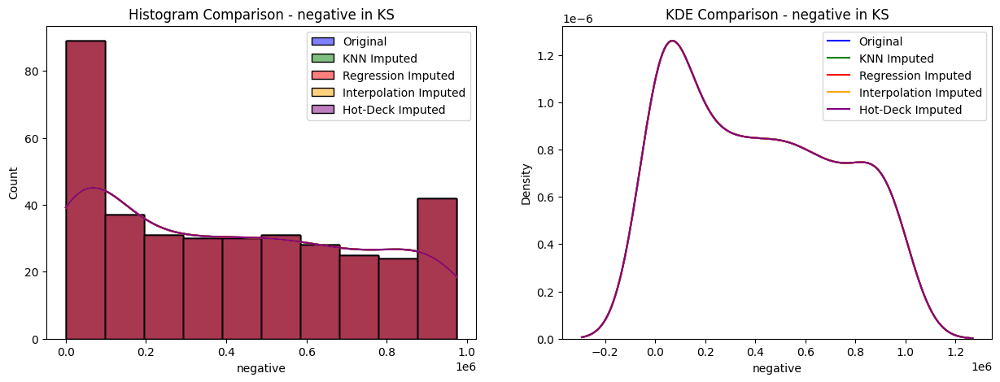


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
No non-null values for negative in KY. Skipping.

--- Checking Imputation Viability for negative in LA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


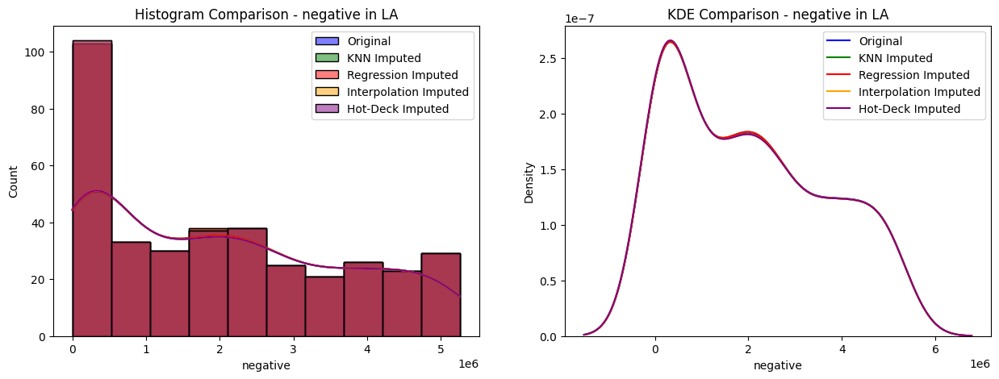


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0014671756868029045), pvalue=np.float64(1.0), statistic_location=np.float64(1985664.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0014671756868029045), pvalue=np.float64(1.0), statistic_location=np.float64(1985664.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


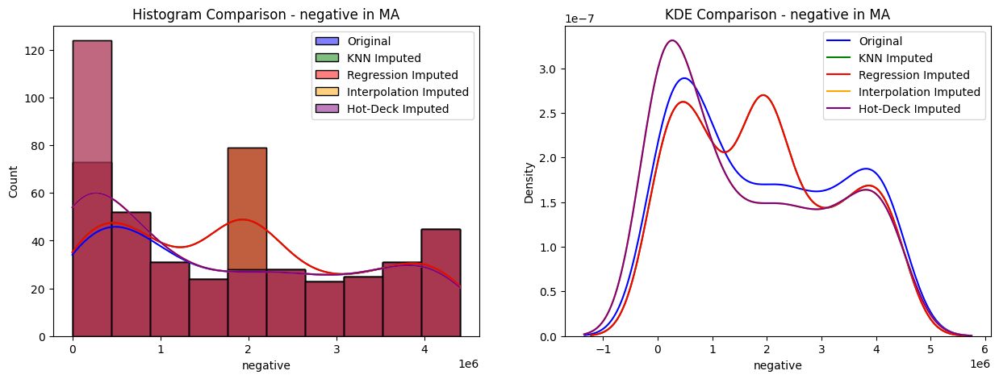


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.06549067315490673), pvalue=np.float64(0.36199876851940005), statistic_location=np.float64(1921953.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.06549067315490673), pvalue=np.float64(0.36199876851940005), statistic_location=np.float64(1921953.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.12374290348742903), pvalue=np.float64(0.004985875424134921), statistic_location=np.float64(92.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.12374290348742903), pvalue=np.float64(0.004985875424134921), statistic_location=np.float64(92.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MD ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


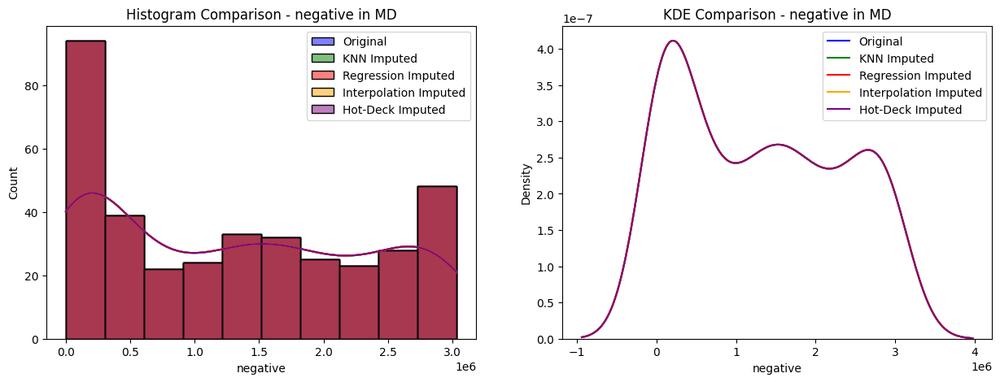


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
No non-null values for negative in ME. Skipping.
No non-null values for negative in MI. Skipping.

--- Checking Imputation Viability for negative in MN ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


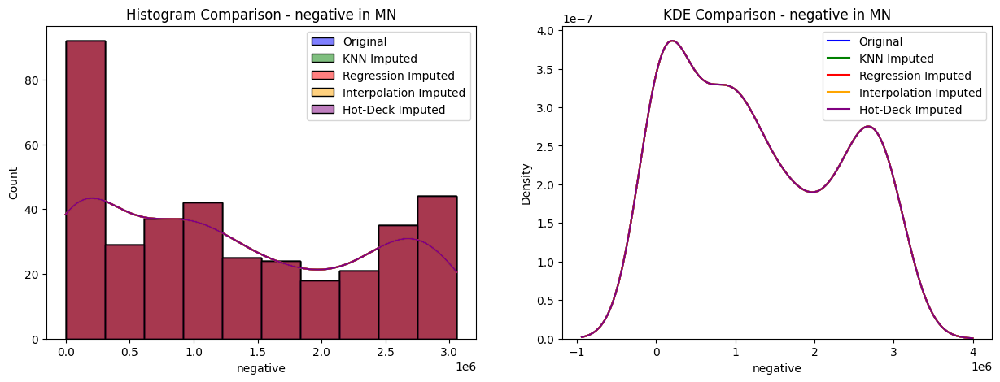


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MO ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


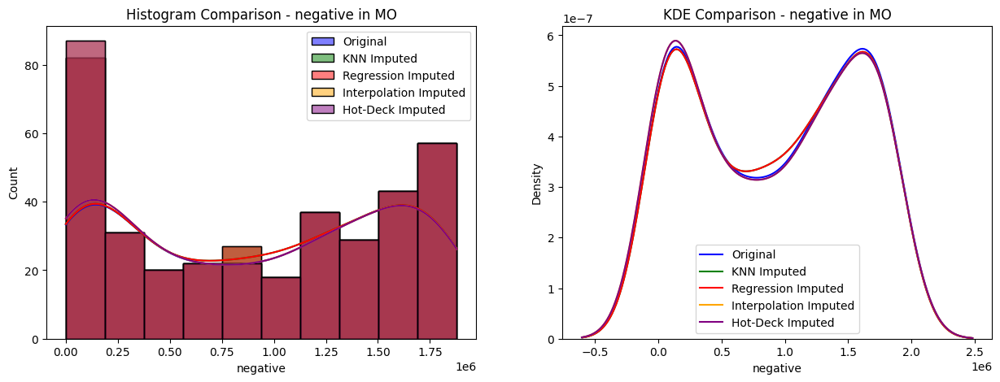


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0070008930869018965), pvalue=np.float64(1.0), statistic_location=np.float64(921025.0637119113), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.0070008930869018965), pvalue=np.float64(1.0), statistic_location=np.float64(921025.0637119113), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.013623359520457744), pvalue=np.float64(0.9999999999994351), statistic_location=np.float64(64.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.013623359520457744), pvalue=np.float64(0.9999999999994351), statistic_location=np.float64(64.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MP ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


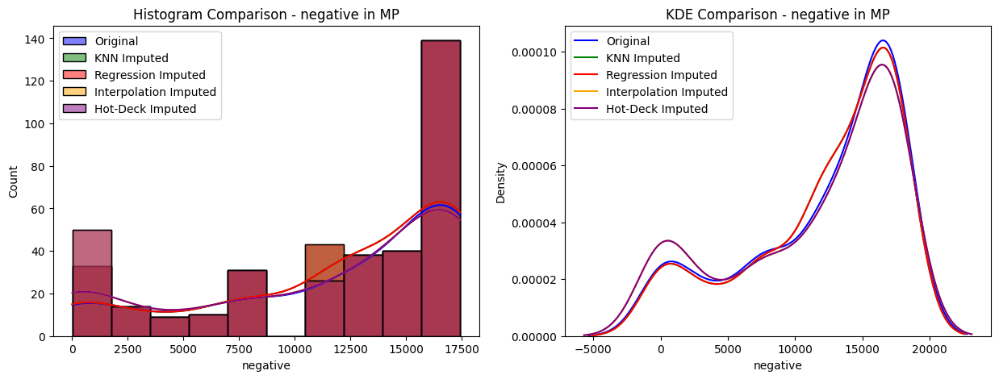


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.030392156862745098), pvalue=np.float64(0.995039108307464), statistic_location=np.float64(12159.344117647059), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.030392156862745098), pvalue=np.float64(0.995039108307464), statistic_location=np.float64(12159.344117647059), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0469187675070028), pvalue=np.float64(0.8145851839996383), statistic_location=np.float64(13.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0469187675070028), pvalue=np.float64(0.8145851839996383), statistic_location=np.float64(13.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MS ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


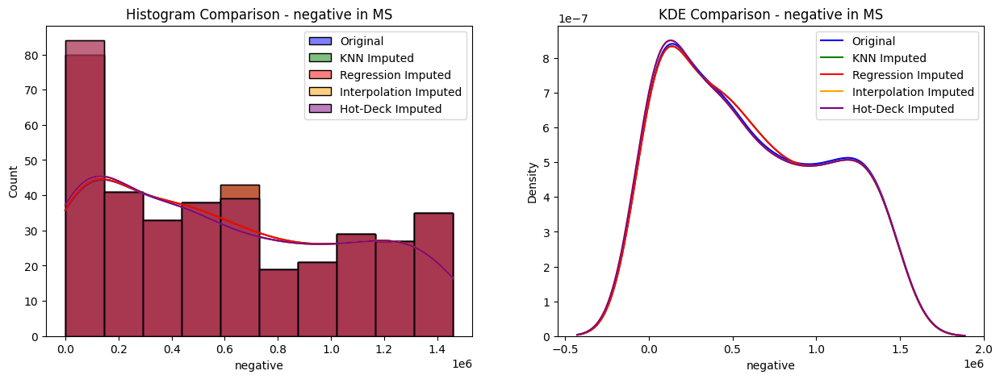


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.005796576397065483), pvalue=np.float64(1.0), statistic_location=np.float64(541497.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.005796576397065483), pvalue=np.float64(1.0), statistic_location=np.float64(541497.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.01089877124656583), pvalue=np.float64(0.9999999999999993), statistic_location=np.float64(20.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.01089877124656583), pvalue=np.float64(0.9999999999999993), statistic_location=np.float64(20.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MT ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


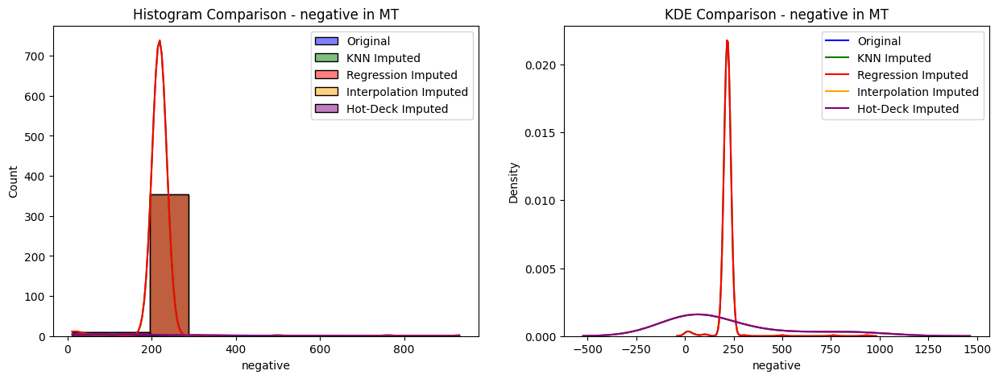


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.6869633099141296), pvalue=np.float64(8.009585060811414e-07), statistic_location=np.float64(198.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.6869633099141296), pvalue=np.float64(8.009585060811414e-07), statistic_location=np.float64(198.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
Hot-Deck vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
No non-null values for negative in NC. Skipping.

--- Checking Imputation Viability for negative in ND ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


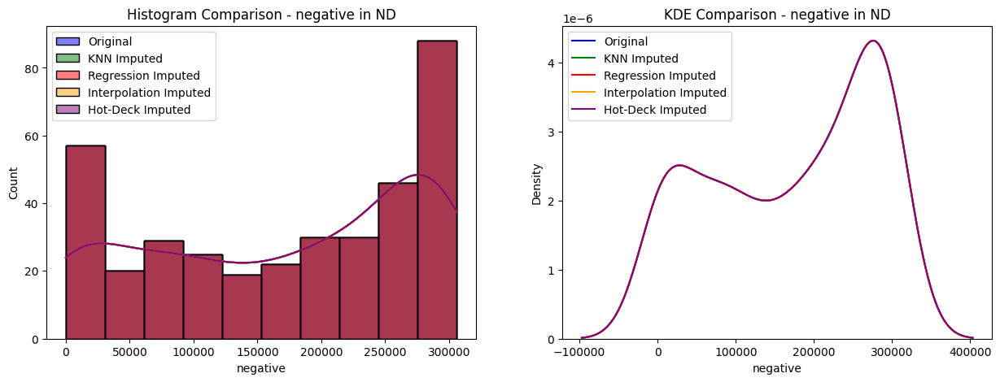


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NE ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


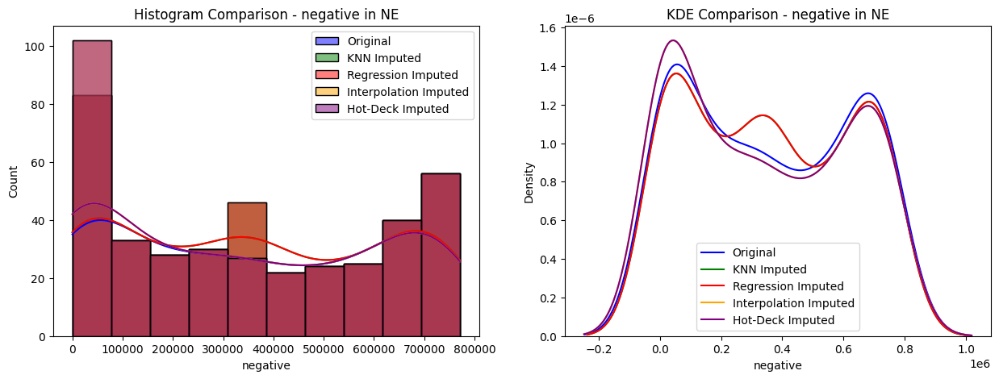


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.02548168745084822), pvalue=np.float64(0.9993175854860677), statistic_location=np.float64(356439.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.02548168745084822), pvalue=np.float64(0.9993175854860677), statistic_location=np.float64(356439.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.04856195933041231), pvalue=np.float64(0.7389300669136736), statistic_location=np.float64(17.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.04856195933041231), pvalue=np.float64(0.7389300669136736), statistic_location=np.float64(17.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in NH ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


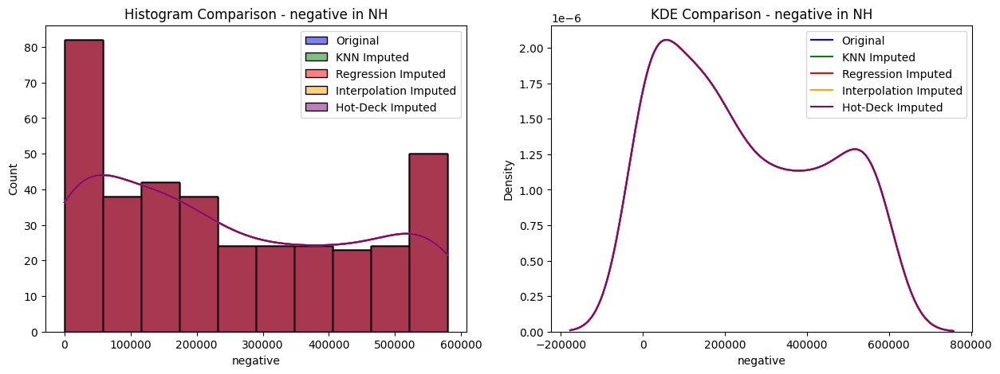


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NJ ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


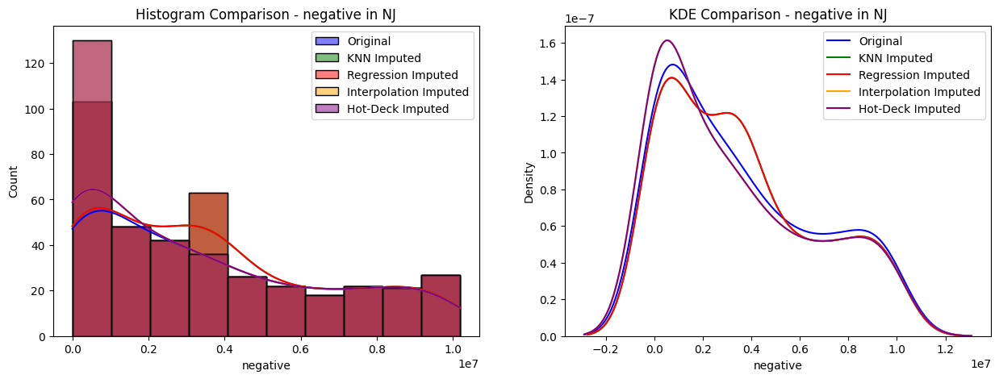


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.04038300251607492), pvalue=np.float64(0.900075006666252), statistic_location=np.float64(3571960.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.04038300251607492), pvalue=np.float64(0.900075006666252), statistic_location=np.float64(3571960.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.06868884540117416), pvalue=np.float64(0.3147450798737575), statistic_location=np.float64(31.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.06868884540117416), pvalue=np.float64(0.3147450798737575), statistic_location=np.float64(31.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in NM ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


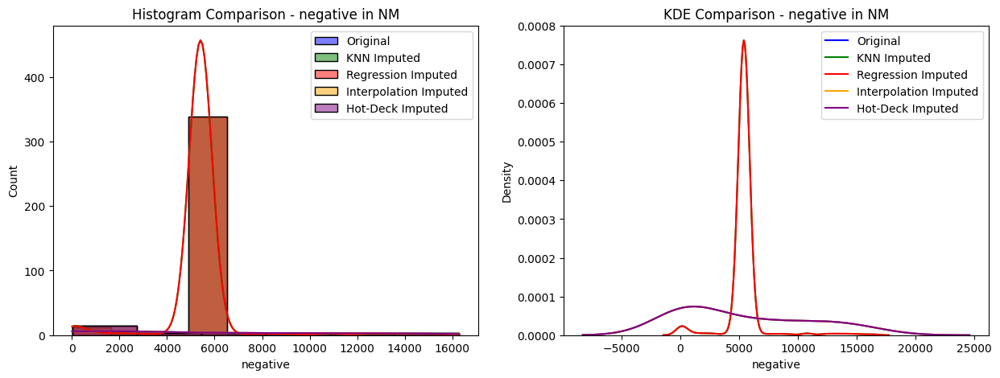


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.5317321178120618), pvalue=np.float64(4.799832559622769e-08), statistic_location=np.float64(5321.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.5317321178120618), pvalue=np.float64(4.799832559622769e-08), statistic_location=np.float64(5321.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
Hot-Deck vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))

--- Checking Imputation Viability for negative in NV ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


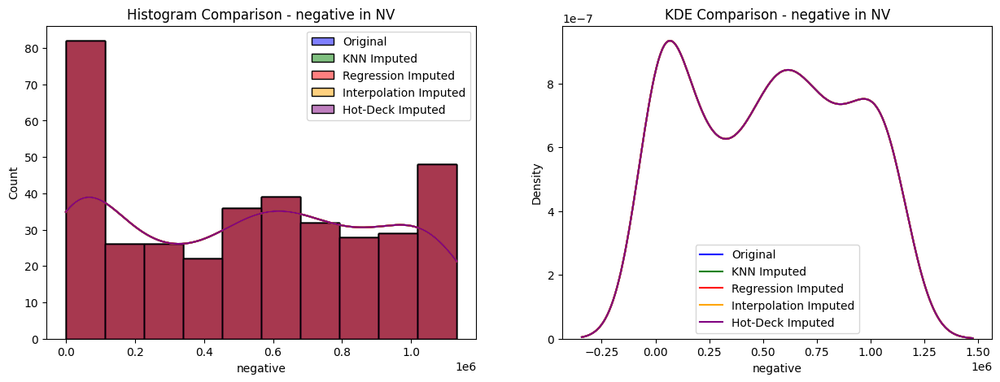


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
No non-null values for negative in NY. Skipping.
No non-null values for negative in OH. Skipping.

--- Checking Imputation Viability for negative in OK ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


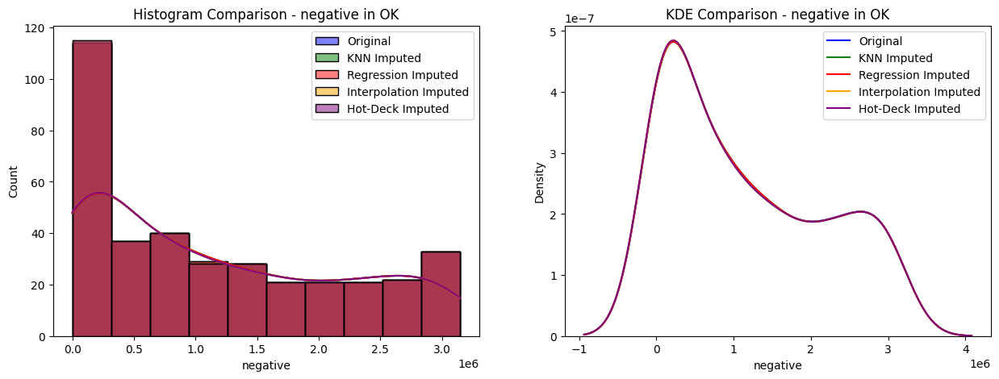


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0015644883599071787), pvalue=np.float64(1.0), statistic_location=np.float64(1140601.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0015644883599071787), pvalue=np.float64(1.0), statistic_location=np.float64(1140601.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(8.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(8.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in OR ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


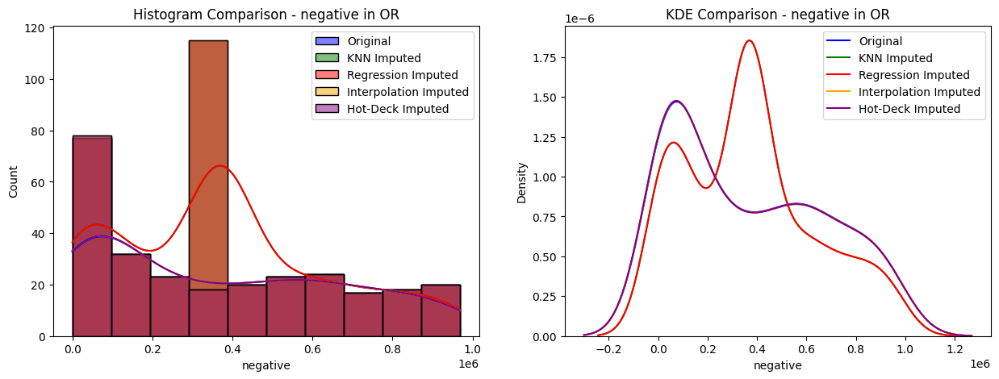


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.14110074924278654), pvalue=np.float64(0.003431490156714845), statistic_location=np.float64(365478.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.14110074924278654), pvalue=np.float64(0.003431490156714845), statistic_location=np.float64(365478.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
Hot-Deck vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))

--- Checking Imputation Viability for negative in PA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


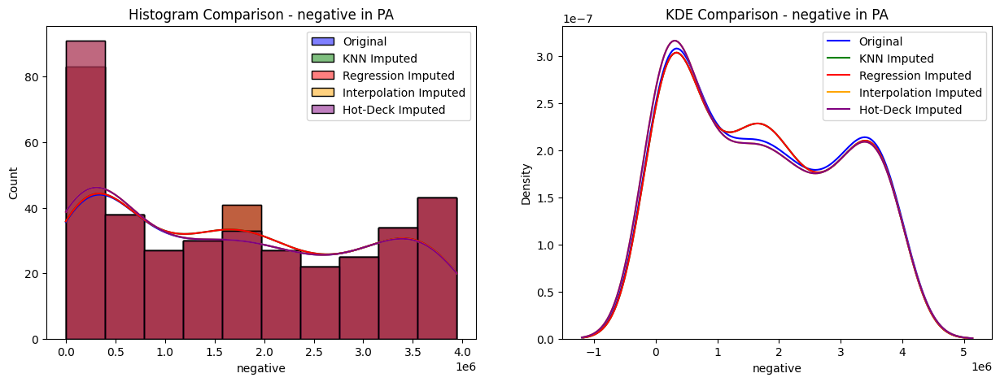


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.011408093176048977), pvalue=np.float64(0.9999999999999991), statistic_location=np.float64(1721275.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.011408093176048977), pvalue=np.float64(0.9999999999999991), statistic_location=np.float64(1721275.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.021561893385097806), pvalue=np.float64(0.9999809699698027), statistic_location=np.float64(88.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.021561893385097806), pvalue=np.float64(0.9999809699698027), statistic_location=np.float64(88.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in PR ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


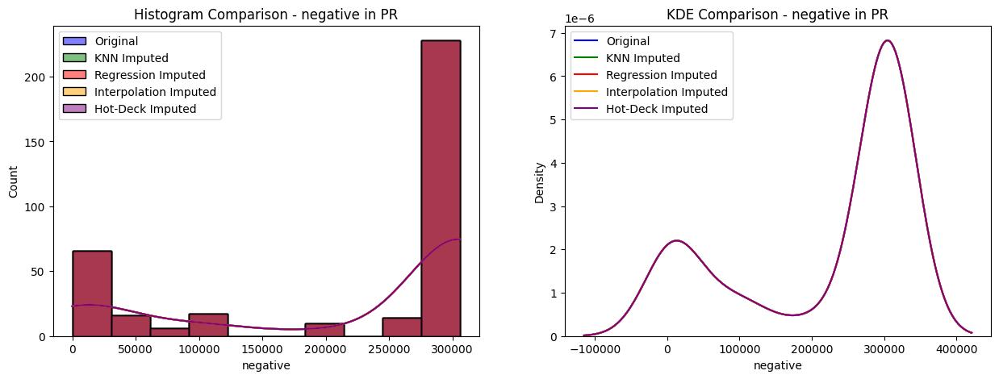


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in RI ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


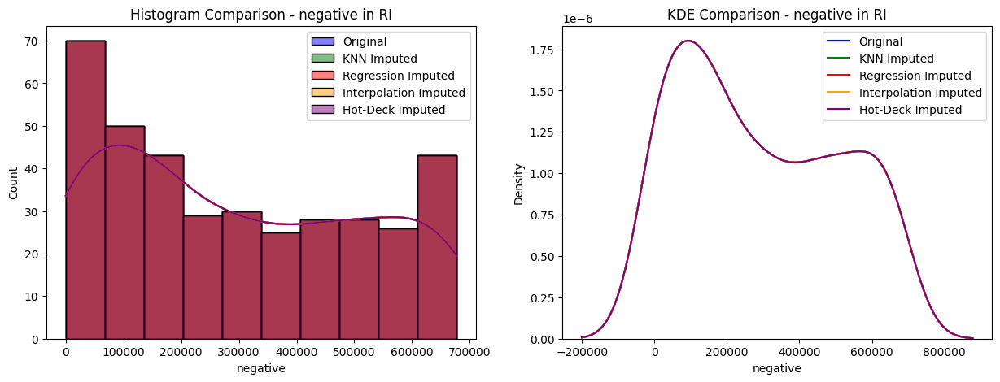


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in SC ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


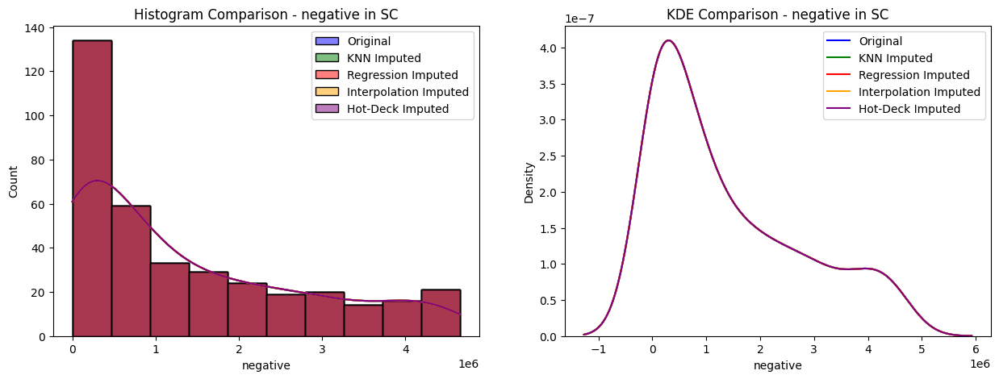


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in SD ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


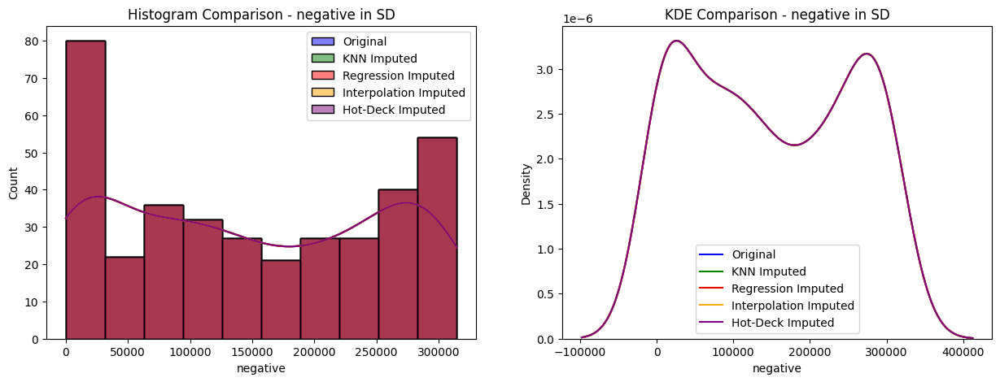


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
No non-null values for negative in TN. Skipping.
No non-null values for negative in TX. Skipping.

--- Checking Imputation Viability for negative in UT ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


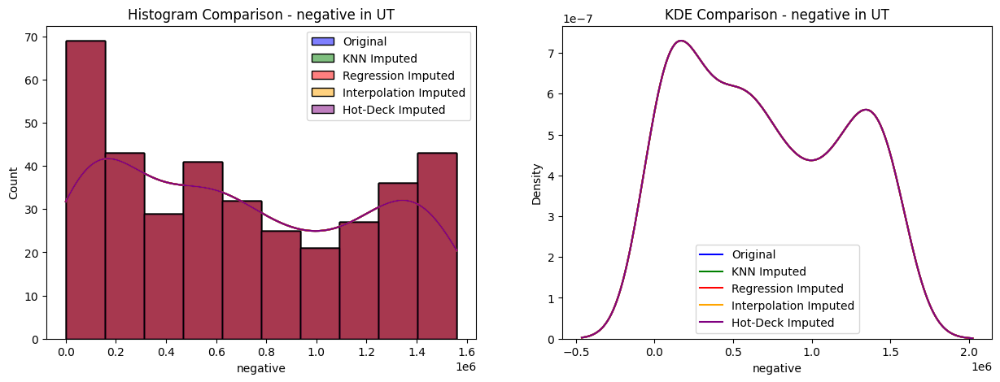


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
No non-null values for negative in VA. Skipping.

--- Checking Imputation Viability for negative in VI ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


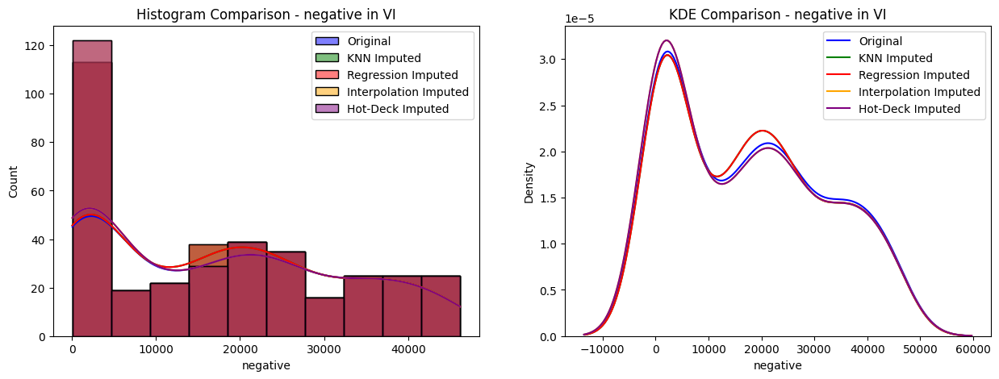


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.012822370327441322), pvalue=np.float64(0.9999999999999947), statistic_location=np.float64(17541.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.012822370327441322), pvalue=np.float64(0.9999999999999947), statistic_location=np.float64(17541.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.024992755722978845), pvalue=np.float64(0.9997159384503831), statistic_location=np.float64(55.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.024992755722978845), pvalue=np.float64(0.9997159384503831), statistic_location=np.float64(55.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in VT ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


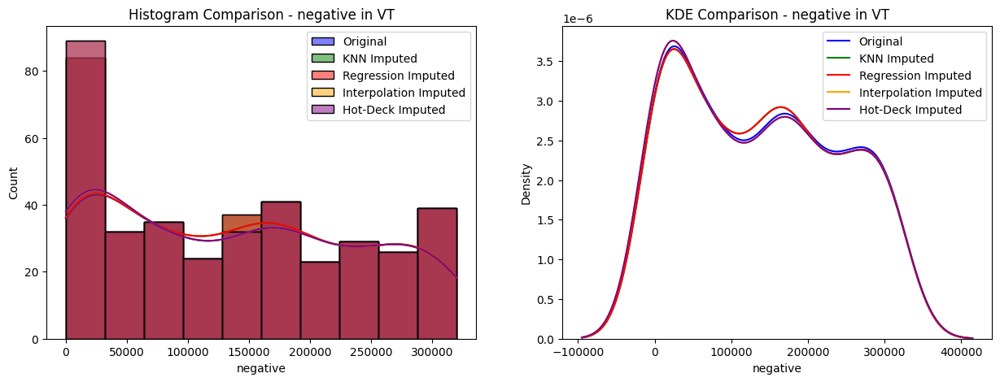


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.00684931506849315), pvalue=np.float64(1.0), statistic_location=np.float64(139009.5205479452), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.00684931506849315), pvalue=np.float64(1.0), statistic_location=np.float64(139009.5205479452), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.013476490188818956), pvalue=np.float64(0.9999999999996195), statistic_location=np.float64(23.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.013476490188818956), pvalue=np.float64(0.9999999999996195), statistic_location=np.float64(23.0), statistic_sign=np.int8(-1))
No non-null values for negative in WA. Skipping.

--- Checking Imputation Viability for negative in WI ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


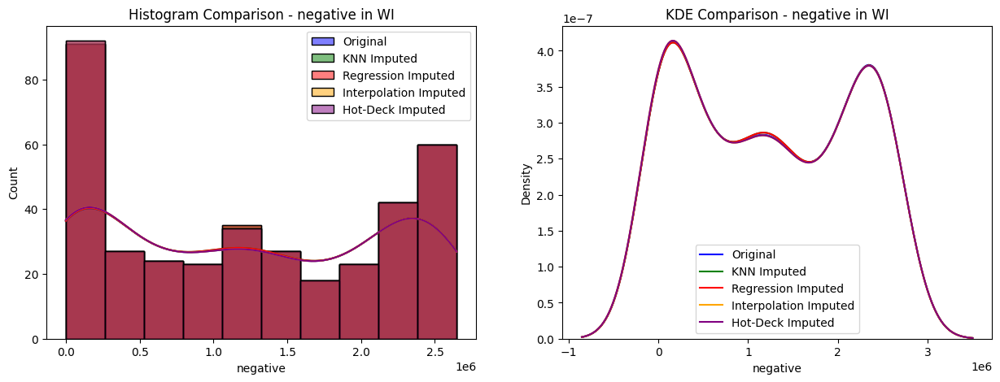


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0013916355379770015), pvalue=np.float64(1.0), statistic_location=np.float64(1238173.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0013916355379770015), pvalue=np.float64(1.0), statistic_location=np.float64(1238173.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0026880539075661027), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0026880539075661027), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(-1))
No non-null values for negative in WV. Skipping.

--- Checking Imputation Viability for negative in WY ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\2023593893.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


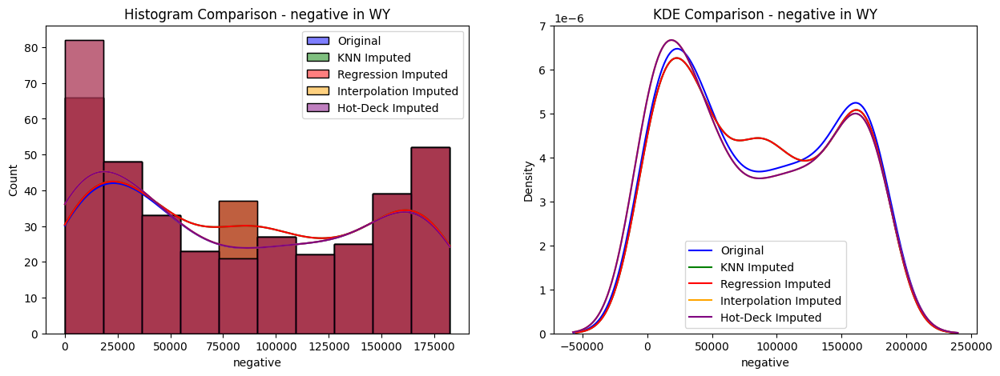


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.022109459949256977), pvalue=np.float64(0.9999700946721489), statistic_location=np.float64(85307.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.022109459949256977), pvalue=np.float64(0.9999700946721489), statistic_location=np.float64(85307.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.04288993596713785), pvalue=np.float64(0.8710397964460294), statistic_location=np.float64(95.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.04288993596713785), pvalue=np.float64(0.8710397964460294), statistic_location=np.float64(95.0), statistic_sign=np.int8(-1))


In [25]:
def check_imputation_viability_state(df, column_name, state_column):

    for state in df[state_column].unique():
        state_df = df[df[state_column] == state].copy() # creates copy of the dataframe for the specific state
        original_state_values = state_df[column_name].dropna()

        if original_state_values.empty:
            print(f"No non-null values for {column_name} in {state}. Skipping.")
            continue

        print(f"\n--- Checking Imputation Viability for {column_name} in {state} ---")

        # KNN Imputation
        imputer_knn = KNNImputer(n_neighbors=5)
        state_df[column_name + '_knn_imputed'] = imputer_knn.fit_transform(state_df[[column_name]])
        knn_imputed_values = state_df[column_name + '_knn_imputed']

        # Regression Imputation
        imputer_regression = IterativeImputer(estimator=LinearRegression(), max_iter=10, random_state=0)
        state_df[column_name + '_regression_imputed'] = imputer_regression.fit_transform(state_df[[column_name]])
        regression_imputed_values = state_df[column_name + '_regression_imputed']

        # Interpolation Imputation
        state_df[column_name + '_interpolated'] = state_df[column_name].interpolate()
        interpolation_imputed_values = state_df[column_name + '_interpolated']

        # Hot-Deck Imputation (Forward Fill)
        state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')
        hotdeck_imputed_values = state_df[column_name + '_hotdeck_imputed']

        # Visual Comparison (Histograms)
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 2, 1)
        sns.histplot(original_state_values, kde=True, color='blue', label='Original')
        sns.histplot(knn_imputed_values, kde=True, color='green', label='KNN Imputed', alpha=0.5)
        sns.histplot(regression_imputed_values, kde=True, color='red', label='Regression Imputed', alpha=0.5)
        sns.histplot(interpolation_imputed_values, kde=True, color='orange', label='Interpolation Imputed', alpha=0.5)
        sns.histplot(hotdeck_imputed_values, kde=True, color='purple', label='Hot-Deck Imputed', alpha=0.5)
        plt.title(f"Histogram Comparison - {column_name} in {state}")
        plt.legend()

        plt.subplot(1, 2, 2)
        sns.kdeplot(original_state_values, color='blue', label='Original')
        sns.kdeplot(knn_imputed_values, color='green', label='KNN Imputed')
        sns.kdeplot(regression_imputed_values, color='red', label='Regression Imputed')
        sns.kdeplot(interpolation_imputed_values, color='orange', label='Interpolation Imputed')
        sns.kdeplot(hotdeck_imputed_values, color='purple', label='Hot-Deck Imputed')
        plt.title(f"KDE Comparison - {column_name} in {state}")
        plt.legend()

        plt.show()

        # Statistical Comparison (KS Test)
        print("\nKS Test Results:")
        print(f"KNN vs Original: {ks_2samp(original_state_values, knn_imputed_values)}")
        print(f"Regression vs Original: {ks_2samp(original_state_values, regression_imputed_values)}")
        print(f"Interpolation vs Original: {ks_2samp(original_state_values, interpolation_imputed_values)}")
        print(f"Hot-Deck vs Original: {ks_2samp(original_state_values, hotdeck_imputed_values)}")

# Example usage:
check_imputation_viability_state(df_states_daily, 'negative', 'state')


--- Checking Imputation Viability for negative in AL ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


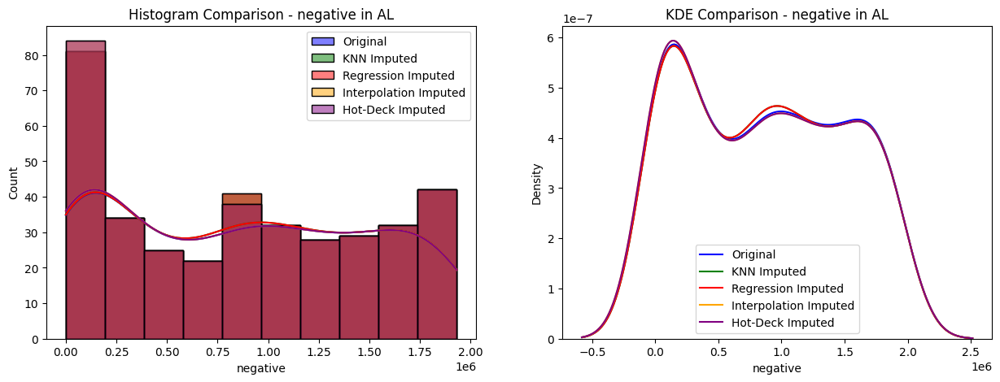


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.004154811904439326), pvalue=np.float64(1.0), statistic_location=np.float64(863982.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.004154811904439326), pvalue=np.float64(1.0), statistic_location=np.float64(863982.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.008174140811994761), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.008174140811994761), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in AR ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


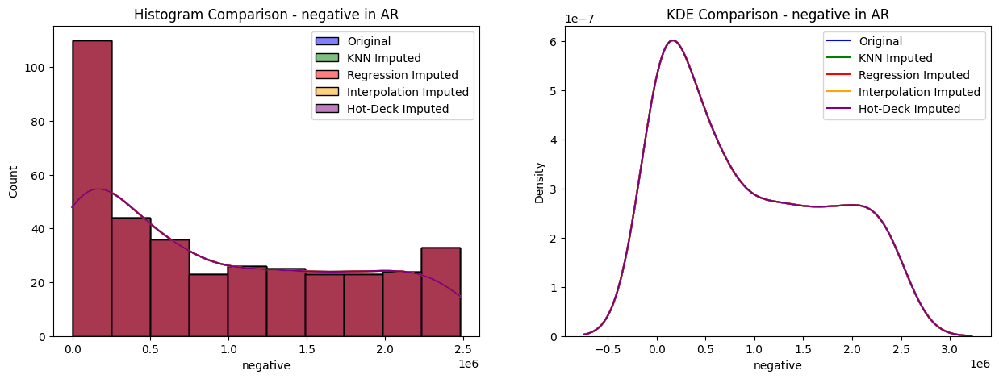


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(6.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in AS ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


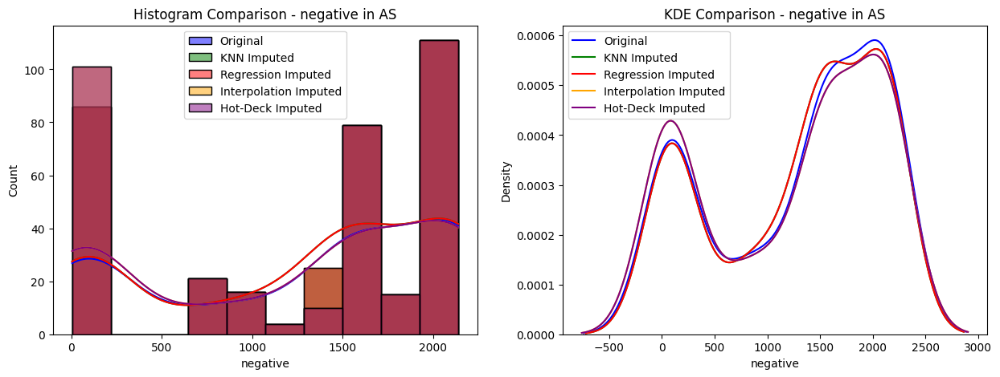


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0264140744016905), pvalue=np.float64(0.9993312477102947), statistic_location=np.float64(1299.798245614035), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.0264140744016905), pvalue=np.float64(0.9993312477102947), statistic_location=np.float64(1299.798245614035), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.03820826576244533), pvalue=np.float64(0.9483366741020861), statistic_location=np.float64(3.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.03820826576244533), pvalue=np.float64(0.9483366741020861), statistic_location=np.float64(3.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in AZ ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


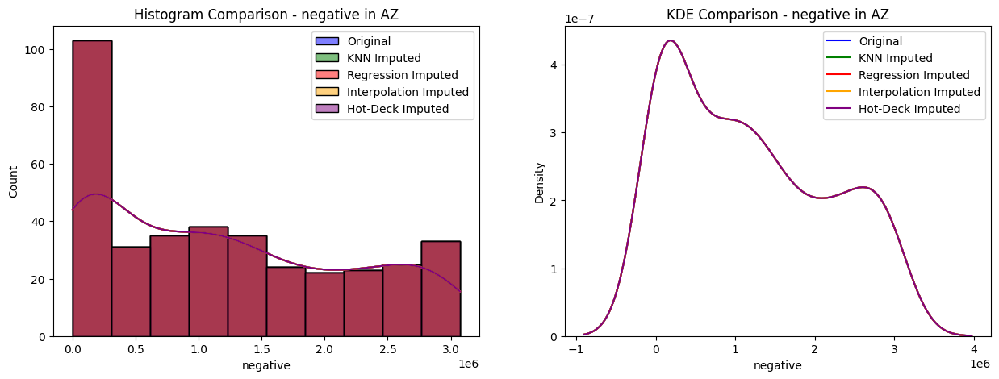


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in CA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


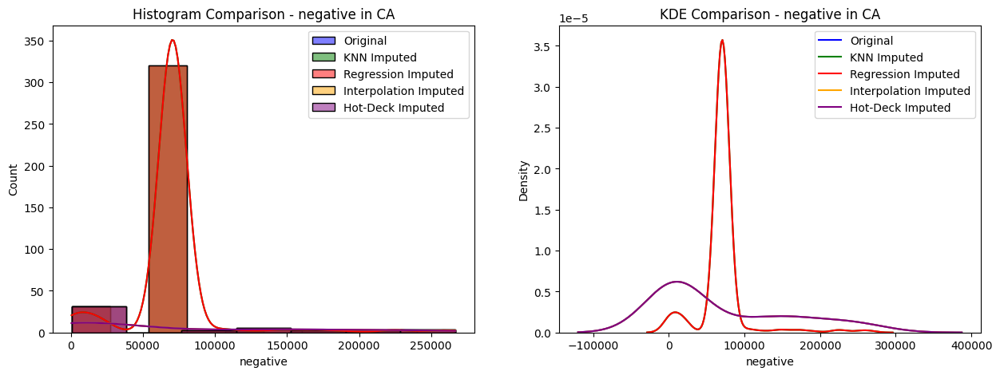


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.5486422211160887), pvalue=np.float64(1.1607521672749022e-12), statistic_location=np.float64(24599.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.5486422211160887), pvalue=np.float64(1.1607521672749022e-12), statistic_location=np.float64(24599.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
Hot-Deck vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))

--- Checking Imputation Viability for negative in CO ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


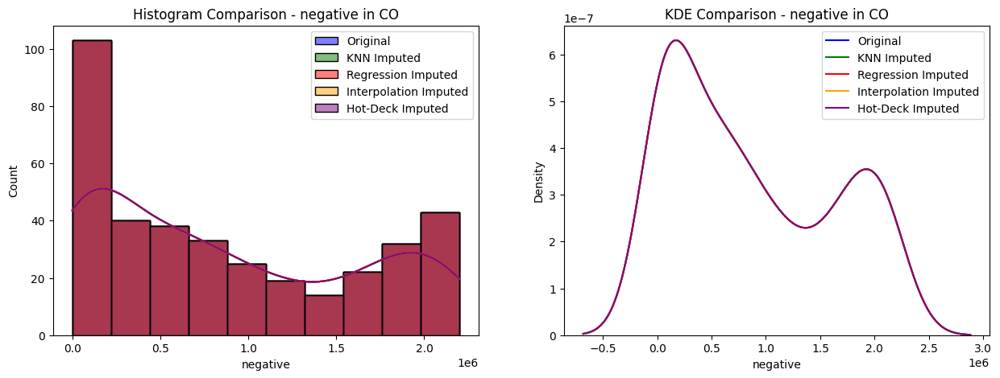


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in DE ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


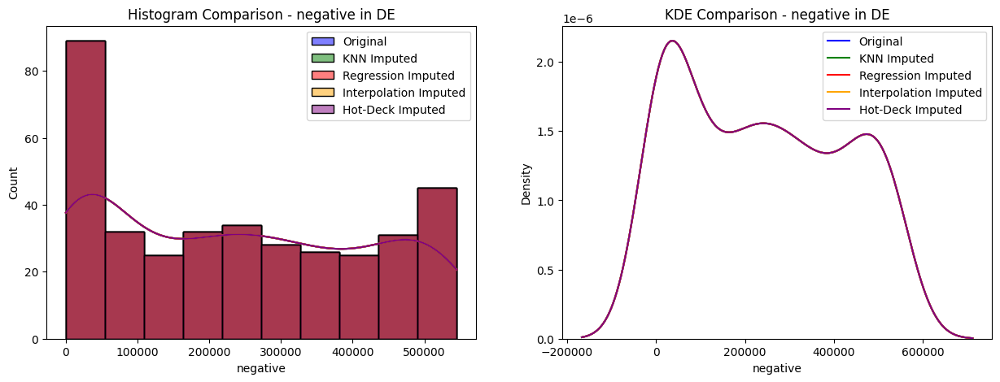


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in FL ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


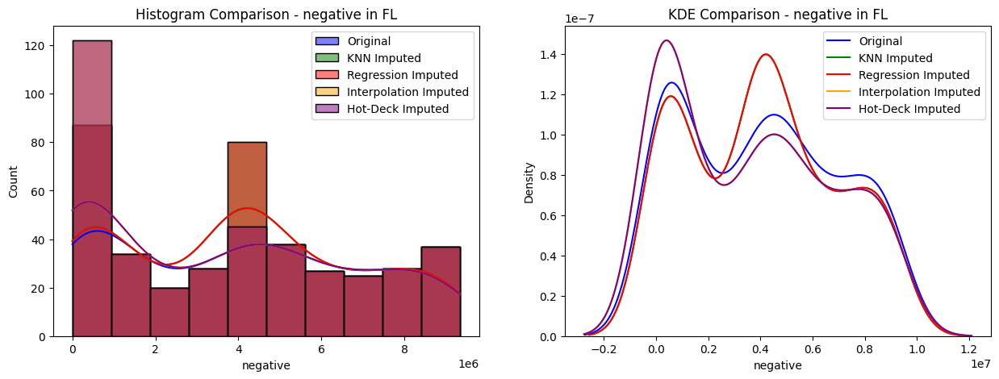


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.04413856019748316), pvalue=np.float64(0.8242458634437031), statistic_location=np.float64(4024002.701897019), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.04413856019748316), pvalue=np.float64(0.8242458634437031), statistic_location=np.float64(4024002.701897019), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0863988837908181), pvalue=np.float64(0.10388760433393412), statistic_location=np.float64(24.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0863988837908181), pvalue=np.float64(0.10388760433393412), statistic_location=np.float64(24.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in GU ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


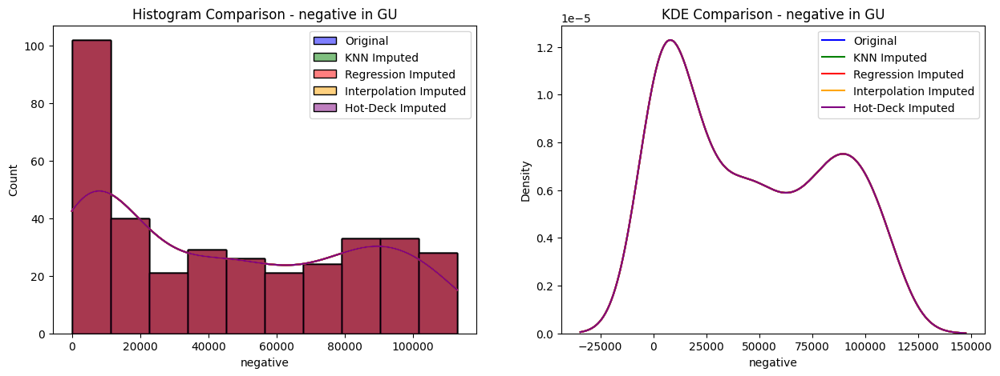


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(23.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in IA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


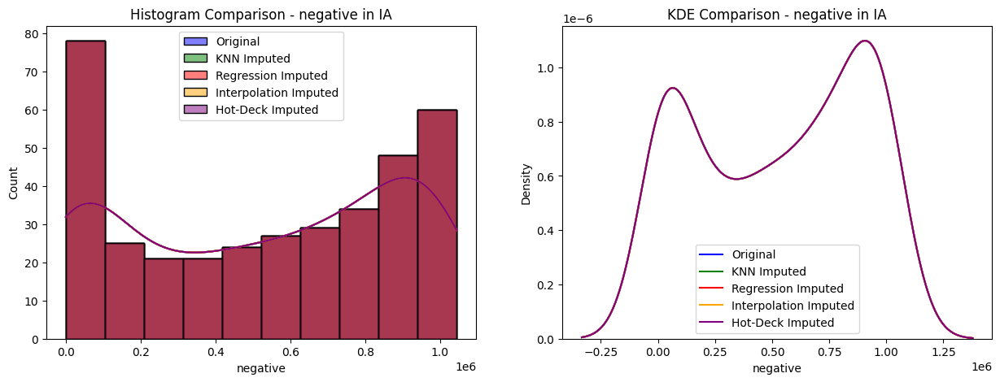


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in ID ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


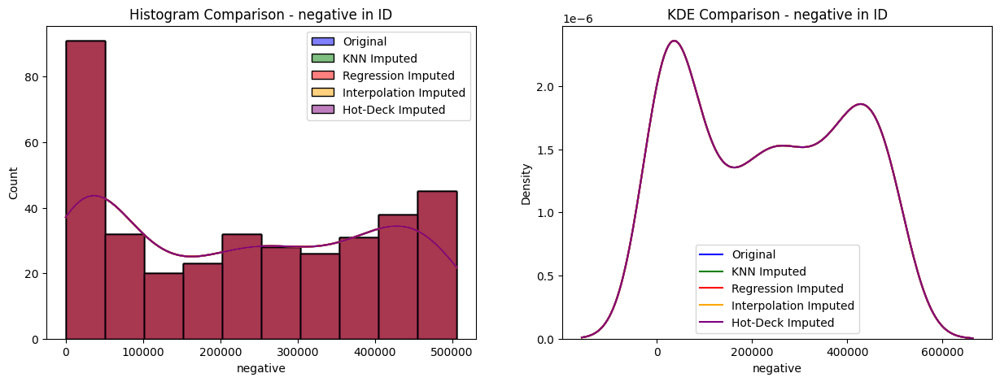


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(27.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in IN ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


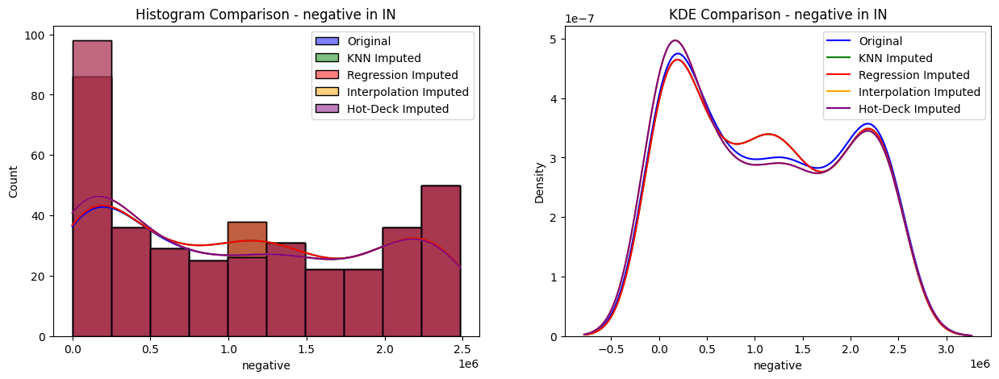


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.016484848484848484), pvalue=np.float64(0.9999999950912635), statistic_location=np.float64(1102419.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.016484848484848484), pvalue=np.float64(0.9999999950912635), statistic_location=np.float64(1102419.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.03191184573002755), pvalue=np.float64(0.9874479158875126), statistic_location=np.float64(30.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.03191184573002755), pvalue=np.float64(0.9874479158875126), statistic_location=np.float64(30.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in KS ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


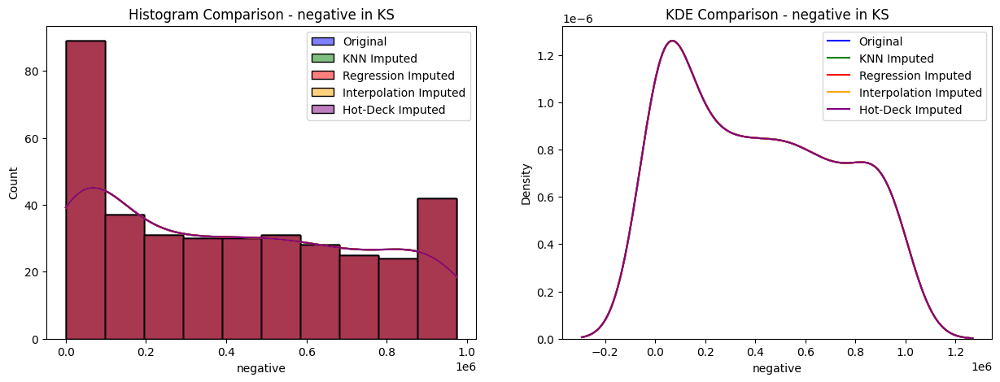


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(4.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in LA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


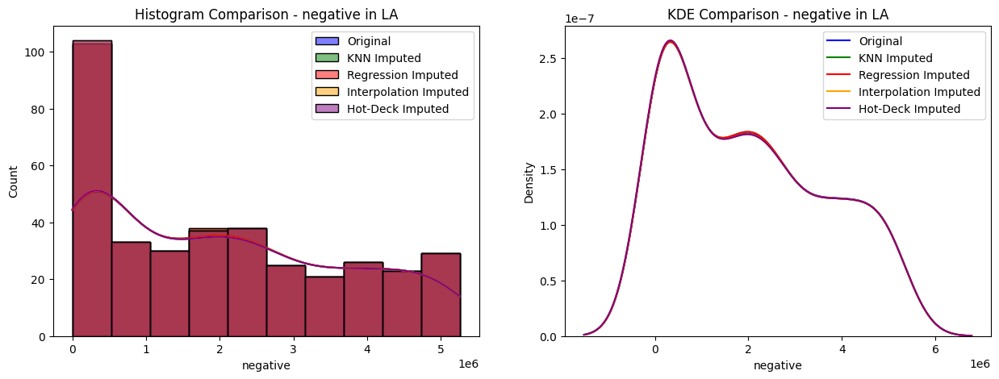


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0014671756868029045), pvalue=np.float64(1.0), statistic_location=np.float64(1985664.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0014671756868029045), pvalue=np.float64(1.0), statistic_location=np.float64(1985664.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


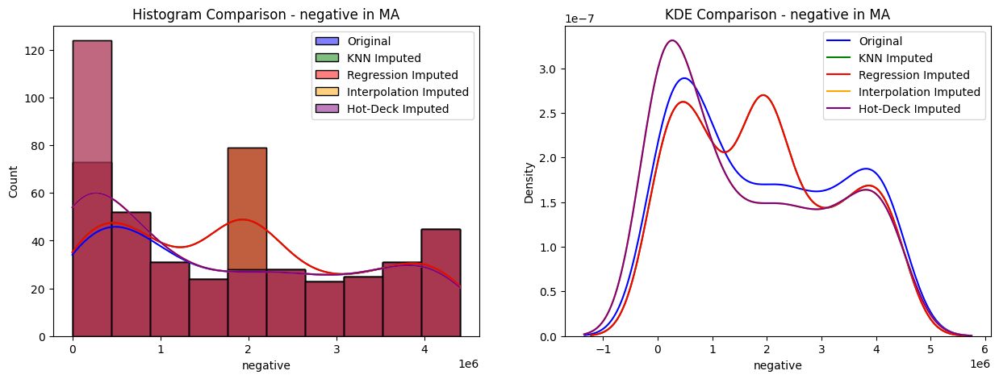


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.06549067315490673), pvalue=np.float64(0.36199876851940005), statistic_location=np.float64(1921953.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.06549067315490673), pvalue=np.float64(0.36199876851940005), statistic_location=np.float64(1921953.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.12374290348742903), pvalue=np.float64(0.004985875424134921), statistic_location=np.float64(92.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.12374290348742903), pvalue=np.float64(0.004985875424134921), statistic_location=np.float64(92.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MD ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


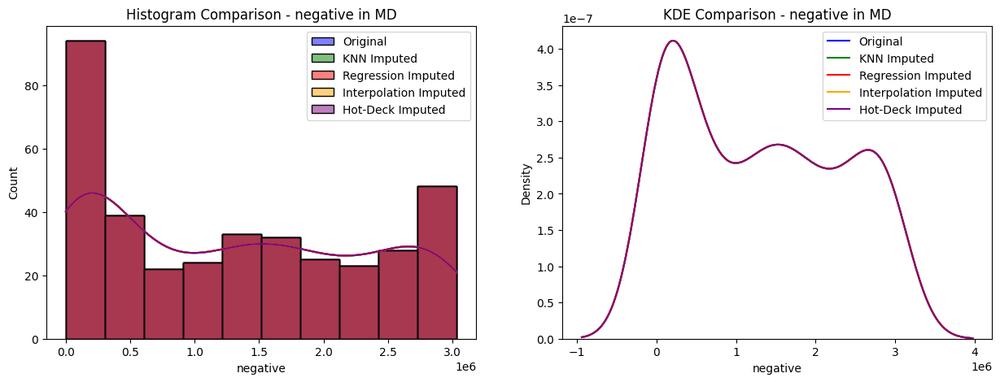


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(17.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MN ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


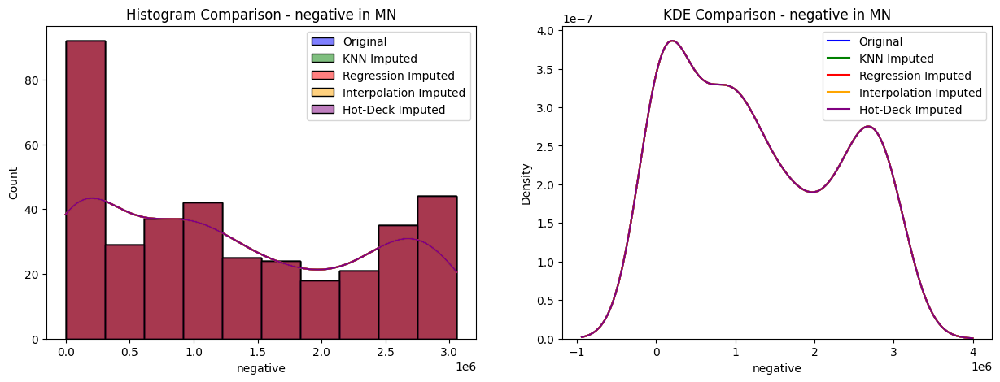


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(36.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in MO ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


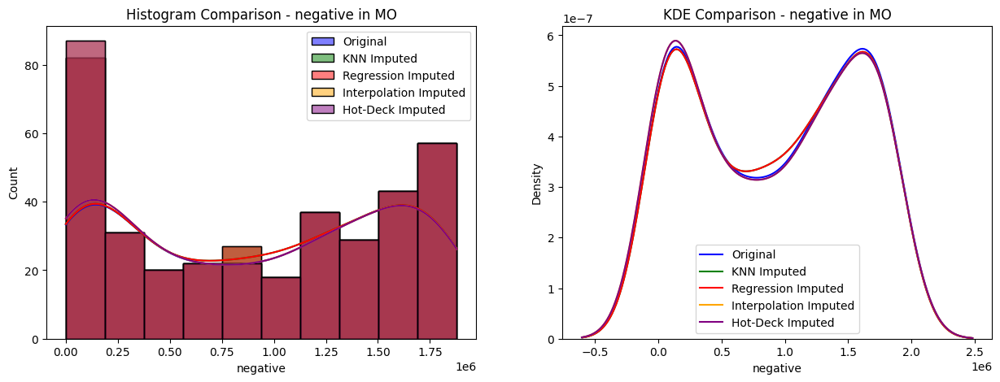


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0070008930869018965), pvalue=np.float64(1.0), statistic_location=np.float64(921025.0637119113), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.0070008930869018965), pvalue=np.float64(1.0), statistic_location=np.float64(921025.0637119113), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.013623359520457744), pvalue=np.float64(0.9999999999994351), statistic_location=np.float64(64.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.013623359520457744), pvalue=np.float64(0.9999999999994351), statistic_location=np.float64(64.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MP ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


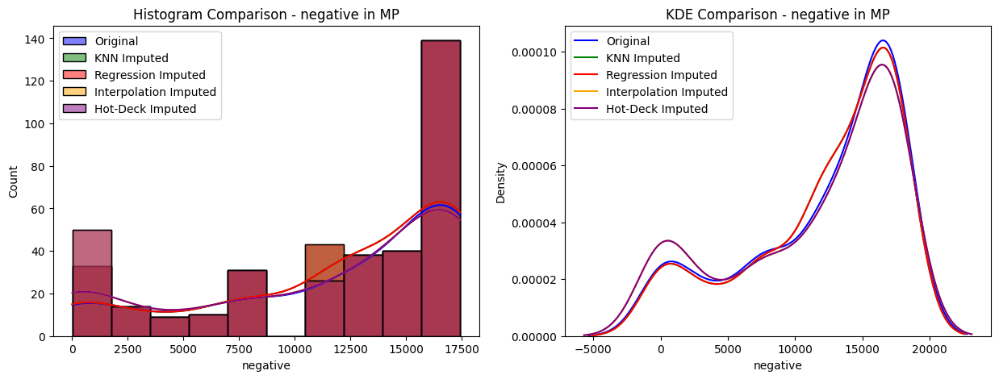


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.030392156862745098), pvalue=np.float64(0.995039108307464), statistic_location=np.float64(12159.344117647059), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.030392156862745098), pvalue=np.float64(0.995039108307464), statistic_location=np.float64(12159.344117647059), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0469187675070028), pvalue=np.float64(0.8145851839996383), statistic_location=np.float64(13.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0469187675070028), pvalue=np.float64(0.8145851839996383), statistic_location=np.float64(13.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in MS ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


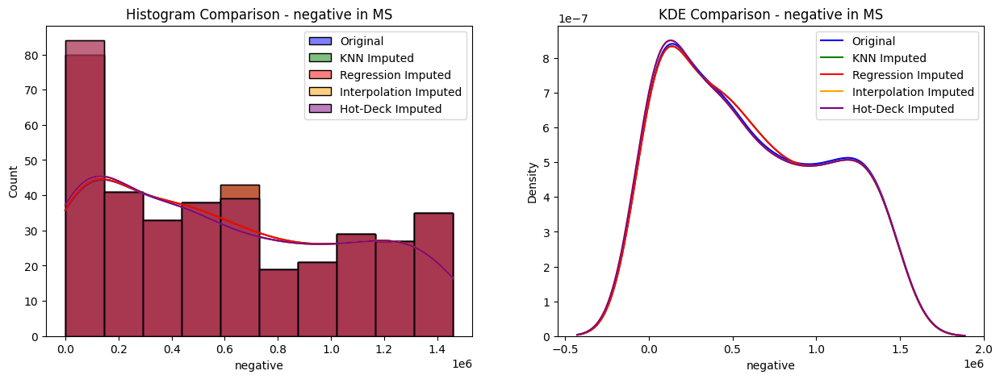


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.005796576397065483), pvalue=np.float64(1.0), statistic_location=np.float64(541497.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.005796576397065483), pvalue=np.float64(1.0), statistic_location=np.float64(541497.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.01089877124656583), pvalue=np.float64(0.9999999999999993), statistic_location=np.float64(20.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.01089877124656583), pvalue=np.float64(0.9999999999999993), statistic_location=np.float64(20.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in ND ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


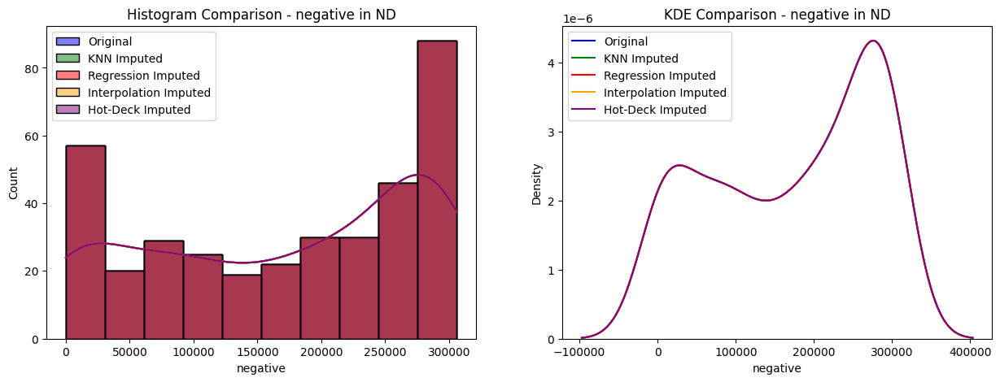


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(0.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NE ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


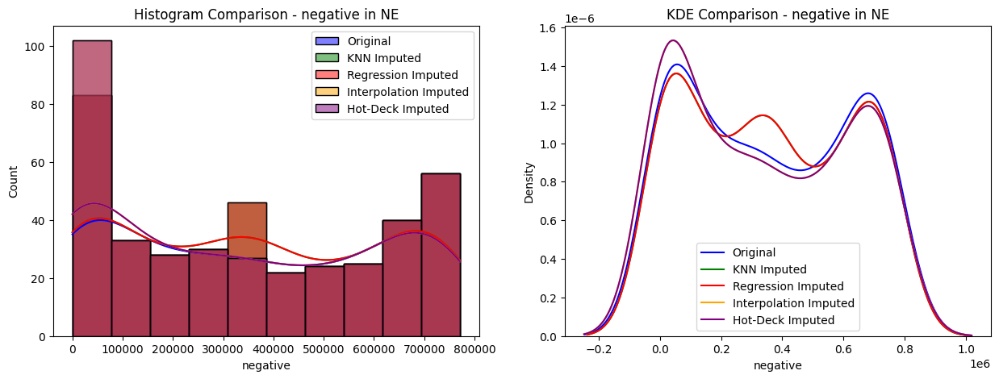


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.02548168745084822), pvalue=np.float64(0.9993175854860677), statistic_location=np.float64(356439.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.02548168745084822), pvalue=np.float64(0.9993175854860677), statistic_location=np.float64(356439.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.04856195933041231), pvalue=np.float64(0.7389300669136736), statistic_location=np.float64(17.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.04856195933041231), pvalue=np.float64(0.7389300669136736), statistic_location=np.float64(17.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in NH ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


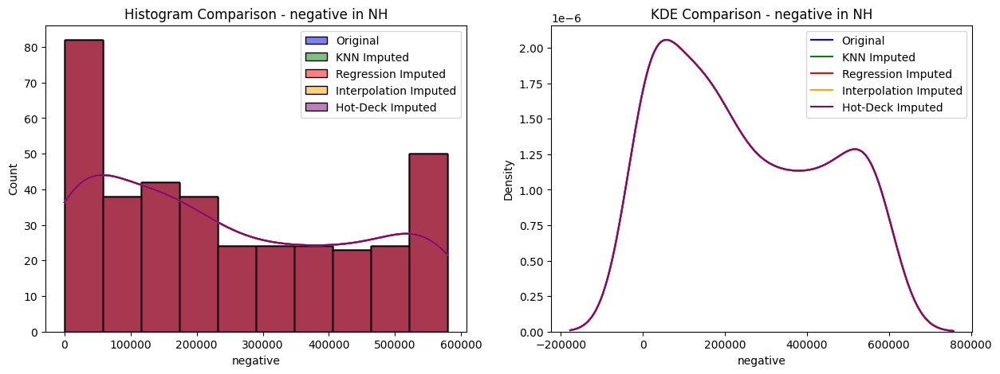


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(10.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in NJ ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


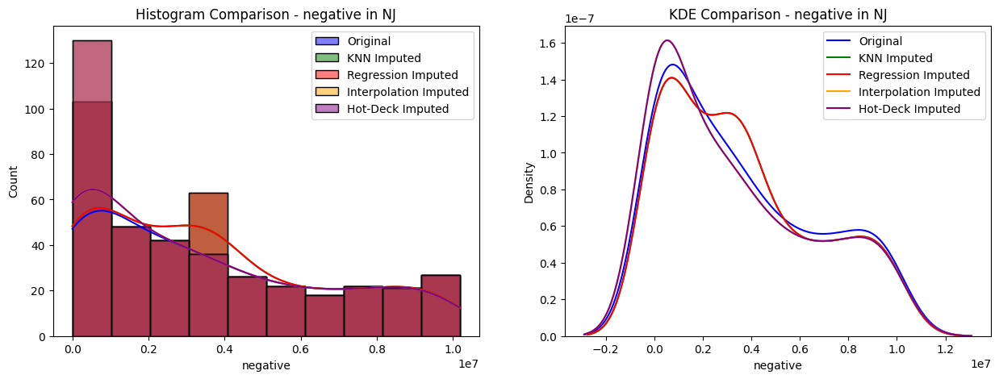


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.04038300251607492), pvalue=np.float64(0.900075006666252), statistic_location=np.float64(3571960.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.04038300251607492), pvalue=np.float64(0.900075006666252), statistic_location=np.float64(3571960.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.06868884540117416), pvalue=np.float64(0.3147450798737575), statistic_location=np.float64(31.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.06868884540117416), pvalue=np.float64(0.3147450798737575), statistic_location=np.float64(31.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in NV ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


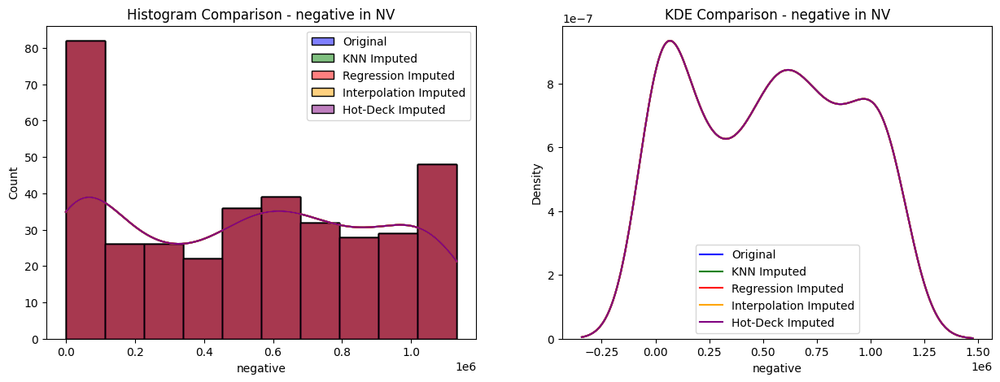


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(14.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in OK ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


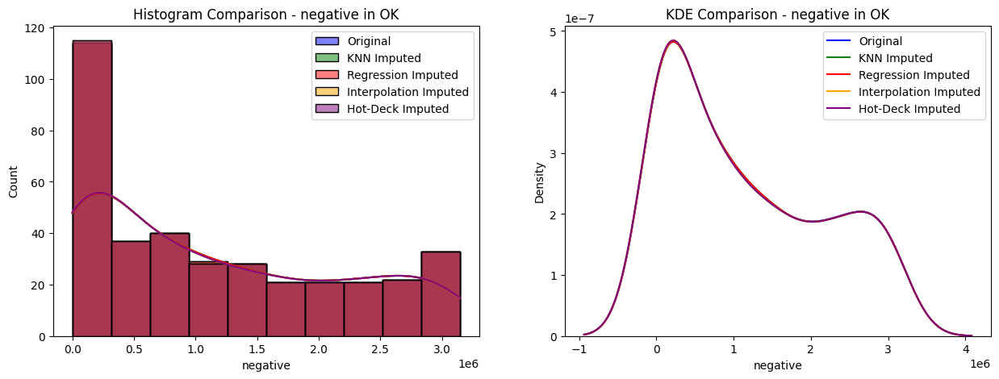


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0015644883599071787), pvalue=np.float64(1.0), statistic_location=np.float64(1140601.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0015644883599071787), pvalue=np.float64(1.0), statistic_location=np.float64(1140601.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(8.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0027172692566808892), pvalue=np.float64(1.0), statistic_location=np.float64(8.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in OR ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


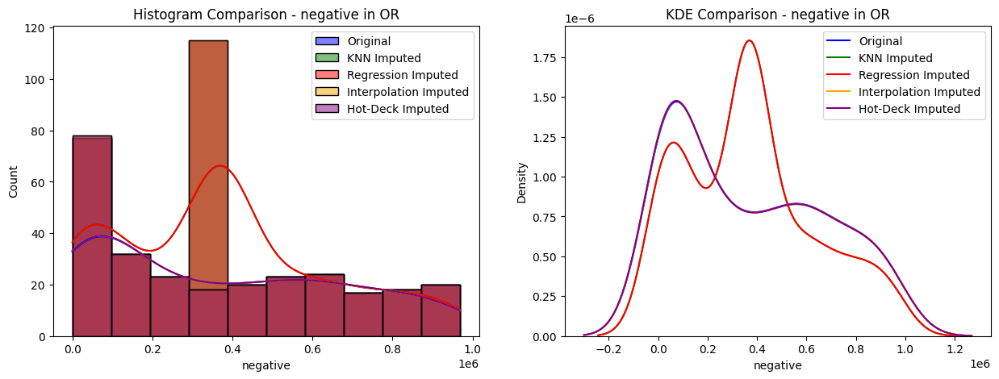


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.14110074924278654), pvalue=np.float64(0.003431490156714845), statistic_location=np.float64(365478.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.14110074924278654), pvalue=np.float64(0.003431490156714845), statistic_location=np.float64(365478.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))
Hot-Deck vs Original: KstestResult(statistic=np.float64(nan), pvalue=np.float64(nan), statistic_location=np.float64(nan), statistic_sign=np.float64(nan))

--- Checking Imputation Viability for negative in PA ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


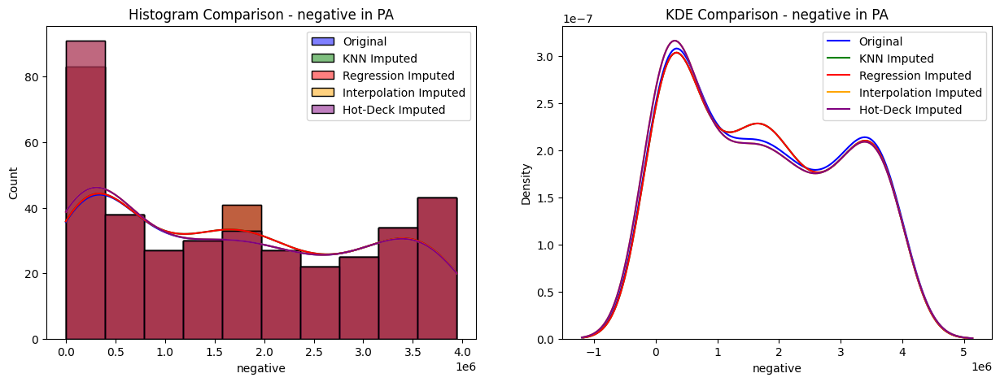


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.011408093176048977), pvalue=np.float64(0.9999999999999991), statistic_location=np.float64(1721275.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.011408093176048977), pvalue=np.float64(0.9999999999999991), statistic_location=np.float64(1721275.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.021561893385097806), pvalue=np.float64(0.9999809699698027), statistic_location=np.float64(88.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.021561893385097806), pvalue=np.float64(0.9999809699698027), statistic_location=np.float64(88.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in PR ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


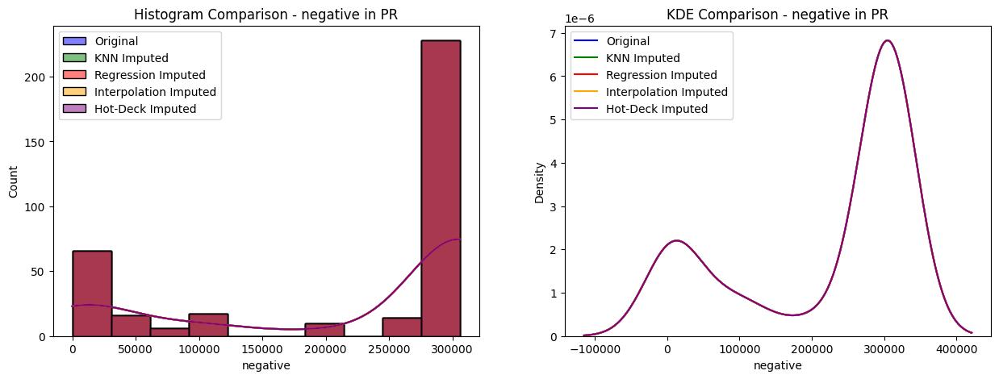


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(9.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in RI ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


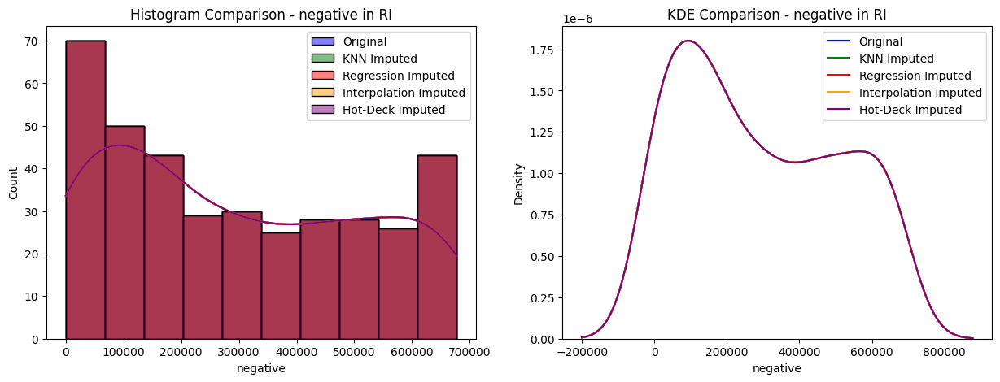


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(2.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in SC ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


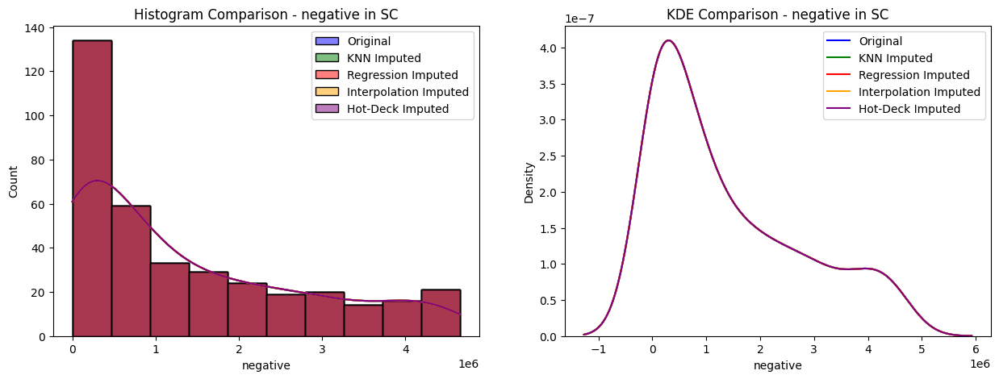


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in SD ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


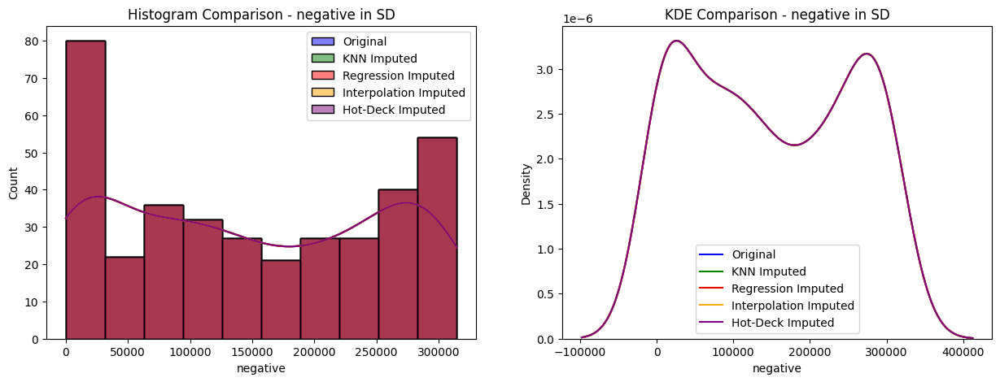


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(5.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in UT ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


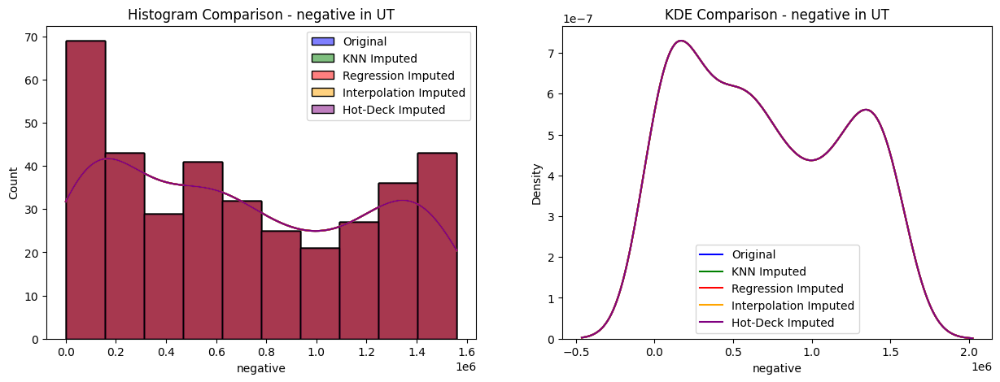


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0), pvalue=np.float64(1.0), statistic_location=np.float64(15.0), statistic_sign=np.int8(1))

--- Checking Imputation Viability for negative in VI ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


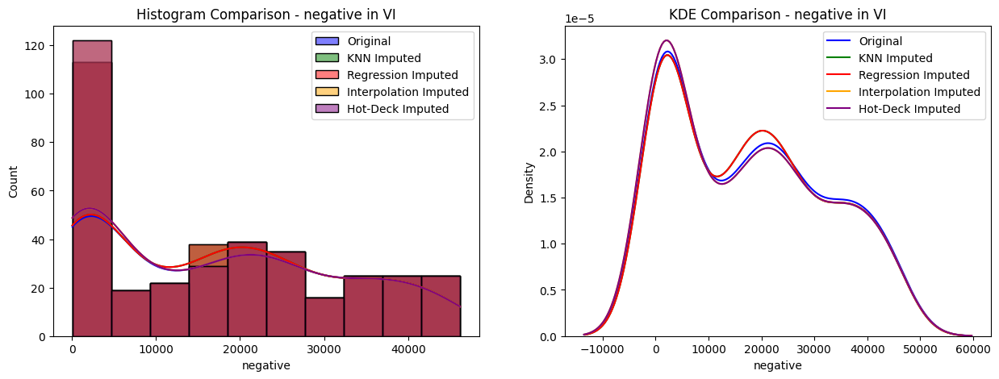


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.012822370327441322), pvalue=np.float64(0.9999999999999947), statistic_location=np.float64(17541.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.012822370327441322), pvalue=np.float64(0.9999999999999947), statistic_location=np.float64(17541.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.024992755722978845), pvalue=np.float64(0.9997159384503831), statistic_location=np.float64(55.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.024992755722978845), pvalue=np.float64(0.9997159384503831), statistic_location=np.float64(55.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in VT ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


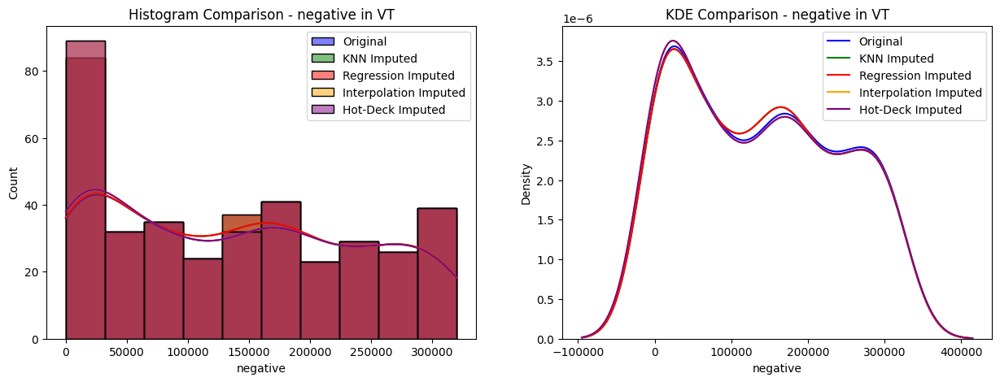


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.00684931506849315), pvalue=np.float64(1.0), statistic_location=np.float64(139009.5205479452), statistic_sign=np.int8(-1))
Regression vs Original: KstestResult(statistic=np.float64(0.00684931506849315), pvalue=np.float64(1.0), statistic_location=np.float64(139009.5205479452), statistic_sign=np.int8(-1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.013476490188818956), pvalue=np.float64(0.9999999999996195), statistic_location=np.float64(23.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.013476490188818956), pvalue=np.float64(0.9999999999996195), statistic_location=np.float64(23.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in WI ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


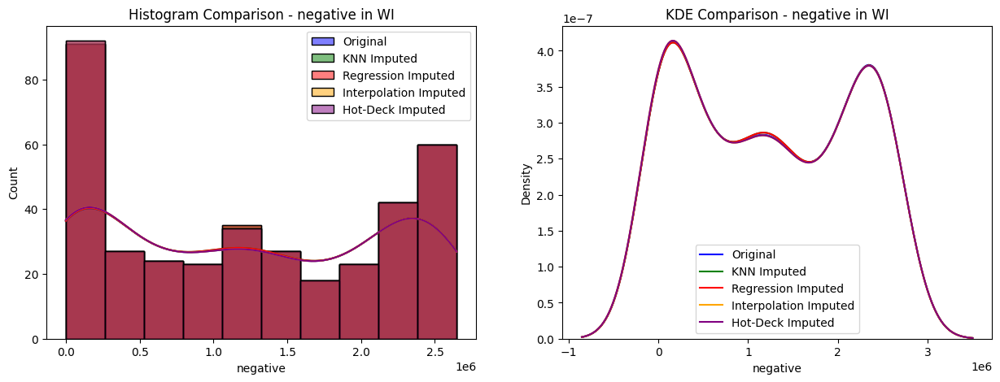


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.0013916355379770015), pvalue=np.float64(1.0), statistic_location=np.float64(1238173.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.0013916355379770015), pvalue=np.float64(1.0), statistic_location=np.float64(1238173.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.0026880539075661027), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.0026880539075661027), pvalue=np.float64(1.0), statistic_location=np.float64(19.0), statistic_sign=np.int8(-1))

--- Checking Imputation Viability for negative in WY ---


C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\4068139791.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')


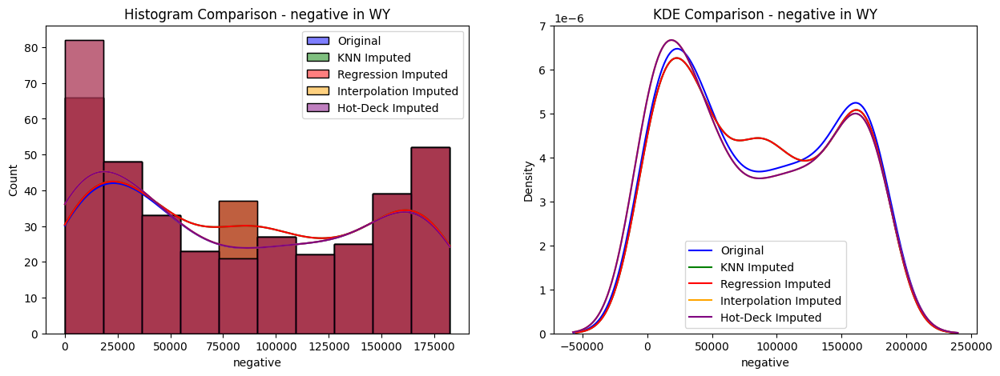


KS Test Results:
KNN vs Original: KstestResult(statistic=np.float64(0.022109459949256977), pvalue=np.float64(0.9999700946721489), statistic_location=np.float64(85307.0), statistic_sign=np.int8(1))
Regression vs Original: KstestResult(statistic=np.float64(0.022109459949256977), pvalue=np.float64(0.9999700946721489), statistic_location=np.float64(85307.0), statistic_sign=np.int8(1))
Interpolation vs Original: KstestResult(statistic=np.float64(0.04288993596713785), pvalue=np.float64(0.8710397964460294), statistic_location=np.float64(95.0), statistic_sign=np.int8(-1))
Hot-Deck vs Original: KstestResult(statistic=np.float64(0.04288993596713785), pvalue=np.float64(0.8710397964460294), statistic_location=np.float64(95.0), statistic_sign=np.int8(-1))


In [26]:
def check_imputation_viability_states(df, column_name, state_column, target_states):
  
    for state in target_states:
        state_df = df[df[state_column] == state].copy() # creates copy of the dataframe for the specific state
        original_state_values = state_df[column_name].dropna()

        if original_state_values.empty:
            print(f"No non-null values for {column_name} in {state}. Skipping.")
            continue

        print(f"\n--- Checking Imputation Viability for {column_name} in {state} ---")

        # KNN Imputation
        imputer_knn = KNNImputer(n_neighbors=5)
        state_df[column_name + '_knn_imputed'] = imputer_knn.fit_transform(state_df[[column_name]])
        knn_imputed_values = state_df[column_name + '_knn_imputed']

        # Regression Imputation
        imputer_regression = IterativeImputer(estimator=LinearRegression(), max_iter=10, random_state=0)
        state_df[column_name + '_regression_imputed'] = imputer_regression.fit_transform(state_df[[column_name]])
        regression_imputed_values = state_df[column_name + '_regression_imputed']

        # Interpolation Imputation
        state_df[column_name + '_interpolated'] = state_df[column_name].interpolate()
        interpolation_imputed_values = state_df[column_name + '_interpolated']

        # Hot-Deck Imputation (Forward Fill)
        state_df[column_name + '_hotdeck_imputed'] = state_df[column_name].fillna(method='ffill')
        hotdeck_imputed_values = state_df[column_name + '_hotdeck_imputed']

        # Visual Comparison (Histograms)
        plt.figure(figsize=(15, 5))

        plt.subplot(1, 2, 1)
        sns.histplot(original_state_values, kde=True, color='blue', label='Original')
        sns.histplot(knn_imputed_values, kde=True, color='green', label='KNN Imputed', alpha=0.5)
        sns.histplot(regression_imputed_values, kde=True, color='red', label='Regression Imputed', alpha=0.5)
        sns.histplot(interpolation_imputed_values, kde=True, color='orange', label='Interpolation Imputed', alpha=0.5)
        sns.histplot(hotdeck_imputed_values, kde=True, color='purple', label='Hot-Deck Imputed', alpha=0.5)
        plt.title(f"Histogram Comparison - {column_name} in {state}")
        plt.legend()

        plt.subplot(1, 2, 2)
        sns.kdeplot(original_state_values, color='blue', label='Original')
        sns.kdeplot(knn_imputed_values, color='green', label='KNN Imputed')
        sns.kdeplot(regression_imputed_values, color='red', label='Regression Imputed')
        sns.kdeplot(interpolation_imputed_values, color='orange', label='Interpolation Imputed')
        sns.kdeplot(hotdeck_imputed_values, color='purple', label='Hot-Deck Imputed')
        plt.title(f"KDE Comparison - {column_name} in {state}")
        plt.legend()

        plt.show()

        # Statistical Comparison (KS Test)
        print("\nKS Test Results:")
        print(f"KNN vs Original: {ks_2samp(original_state_values, knn_imputed_values)}")
        print(f"Regression vs Original: {ks_2samp(original_state_values, regression_imputed_values)}")
        print(f"Interpolation vs Original: {ks_2samp(original_state_values, interpolation_imputed_values)}")
        print(f"Hot-Deck vs Original: {ks_2samp(original_state_values, hotdeck_imputed_values)}")

# Calling function


target_states = ['AL', 'AR', 'AS', 'AZ', 'CA', 'CO', 'DE', 'FL', 'GU', 'IA', 'ID', 'IN', 'KS', 'LA', 'MA', 'MD', 'MN', 'MO', 'MP', 'MS', 'ND', 'NE', 'NH', 'NJ', 'NV', 'OK', 'OR', 'PA', 'PR', 'RI', 'SC', 'SD', 'UT', 'VI', 'VT', 'WI', 'WY']
check_imputation_viability_states(df_states_daily, 'negative', 'state', target_states)

In [27]:
def check_and_report_constant_values(df, column_name, state_column):

    for state_value in df[state_column].unique():
        state_df = df[df[state_column] == state_value]
        unique_count = state_df[column_name].nunique()

        if unique_count == 1:
            print(f"Column '{column_name}' has constant values for {state_value}.")
        else:
            print(f"Column '{column_name}' has {unique_count} unique values for {state_value}.")

# Example usage:
# Assuming your DataFrame is named df_states_daily and state column is 'state'
column_to_check = 'total_test_results'

check_and_report_constant_values(df_states_daily, column_to_check, 'state')

Column 'total_test_results' has 338 unique values for AK.
Column 'total_test_results' has 352 unique values for AL.
Column 'total_test_results' has 331 unique values for AR.
Column 'total_test_results' has 18 unique values for AS.
Column 'total_test_results' has 369 unique values for AZ.
Column 'total_test_results' has 367 unique values for CA.
Column 'total_test_results' has 361 unique values for CO.
Column 'total_test_results' has 363 unique values for CT.
Column 'total_test_results' has 361 unique values for DC.
Column 'total_test_results' has 362 unique values for DE.
Column 'total_test_results' has 377 unique values for FL.
Column 'total_test_results' has 365 unique values for GA.
Column 'total_test_results' has 330 unique values for GU.
Column 'total_test_results' has 367 unique values for HI.
Column 'total_test_results' has 365 unique values for IA.
Column 'total_test_results' has 344 unique values for ID.
Column 'total_test_results' has 363 unique values for IL.
Column 'total_t

In [28]:
df_states_daily.columns

Index(['date', 'state', 'positive', 'probable_cases', 'negative',
       'total_test_results', 'hospitalized_currently',
       'hospitalized_cumulative', 'in_icu_currently', 'in_icu_cumulative',
       'recovered', 'last_update_et', 'death', 'total_tests_viral',
       'positive_tests_viral', 'negative_tests_viral', 'positive_cases_viral',
       'death_confirmed', 'death_probable', 'total_tests_people_viral',
       'positive_increase', 'total_test_results_increase', 'death_increase',
       'hospitalized_increase'],
      dtype='object')

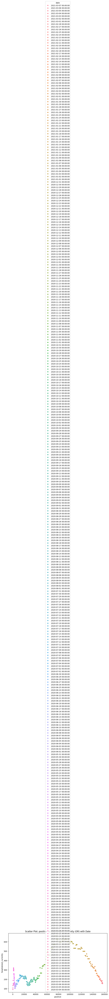

In [29]:
def plot_scatter_correlation(df, column_x, column_y, state_column=None, state_value=None, date_column=None):

    if state_column and state_value:
        if state_value in df[state_column].unique():
            df_filtered = df[df[state_column] == state_value]
            plt.figure(figsize=(10, 6))

            if date_column and date_column in df.columns:
                sns.scatterplot(x=df_filtered[column_x], y=df_filtered[column_y], hue=df_filtered[date_column]) # using date as hue
                plt.title(f"Scatter Plot: {column_x} vs {column_y} ({state_value}) with Date")
            else:
                sns.scatterplot(x=df_filtered[column_x], y=df_filtered[column_y])
                plt.title(f"Scatter Plot: {column_x} vs {column_y} ({state_value})")

            plt.xlabel(column_x)
            plt.ylabel(column_y)
            plt.show()
        else:
            print(f"State '{state_value}' not found in '{state_column}'.")

    else:
        plt.figure(figsize=(40, 4))
        if date_column and date_column in df.columns:
            sns.scatterplot(x=df[column_x], y=df[column_y], hue=df[date_column])
            plt.title(f"Scatter Plot: {column_x} vs {column_y} with Date")
        else:
            sns.scatterplot(x=df[column_x], y=df[column_y])
            plt.title(f"Scatter Plot: {column_x} vs {column_y}")
        plt.xlabel(column_x)
        plt.ylabel(column_y)
        plt.show()

# Calling function
plot_scatter_correlation(df_states_daily, 'positive', 'hospitalized_currently', 'state', 'OR', date_column='date') # I am changing the columns to check the scatter plot

____
####  ✍ <span style="color:#f6f794"> Lecture of outliers </span>

- Can be partially imputed:

    - ✅❌ `total_test_results`  nulls: 0.80%  outliers: 10.79%  Not all states were imputed (not: MI, NC, TN, MD, OR, VA )  
    - ✅❌ `positive` nulls: 0.90% outliers: 10.44% histplot: The majority of states can be imputed by the mean, some by KNN and 2 [MA, VA] cannot be at all imputed since the distribuition of the data changes significantly.
    - ✅ `death` has 4% of nulls, 9% of outliers and in the boxplot seems not to be outside the box, therefore, the method **median will be used to impute**.
    - ✅❌ `hospitalized_currently` nulls: 16.56% outliers: 8.54% States with 100% nulls: (AS, MP)  States with more than 30% of nulls (VI, FL, KS, HI) Only a few states can be imputed.
    - ✅❌ `death_confirmed` nulls: 54.66%  outliers:2.71%  To check further, this was grouped by state, after checking, <u> only states DE, MD, HI, MI can be imputed. </u>
    - ✅❌ `death_probable` nulls: 63.46%  outliers:4.33% To check further, this was grouped by state, after checking, <u> only states DE and MD can be imputed. </u>
    - ✅❌ `recovered` nulls: 42.24% outliers: 6.62% To check further, this was grouped by state, after checking, <u> only states: AR, DC, GU, IA, ME, MN, ND, NM, OK, SD, TN, VI, WY, can be imputed. </u>
    - ✅❌ `hospitalized_cumulative` nulls: 40.41% outliers:4.36% Only few rows grouped by states can be imputed.
    - ✅❌`probable_cases` nulls: 55.38% outliers:6.26% Only states: ID, ME, ND, VT, WI can be imputed with the mean.


- Cannot be imputed:
    - ❌ `in_icu_currently` nulls: 44.00% outliers: 5.58% boxplot: in the whiskers histplot: with few very high values and many lower values. If imputed, the data varies a lot. cannot be impute.
    - ❌ `in_icu_cumulative` nulls: 81.77% outliers:1.54% boxplot: in the whiskers histplot: high disparity. If imputed, the data varies a lot. cannot be impute.
    - ❌`negative`  nulls: 36.04%  outliers:5.45% Cannot impute data by any of the states
    
- Will be eliminated:

    By checking, it doesn't give relevant information to make an analysis therefore, all the viral's columns will be eliminated.

    - ✂️ `total_tests_viral` nulls: 30.14%  outliers:7.43%
    - ✂️ `positive_tests_viral` nulls: 56.89% outliers:4.48%, 
    - ✂️ `negative_tests_viral` nulls: 75.82%  outliers:1.87%
    - ✂️ `positive_cases_viral` nulls: 31.44%  outliers:6.34%
    - ✂️ `total_tests_people_viral` nulls: 55.74%   outliers:3.74%

#### Eliminating more unuseful columns

In [30]:
df_states_daily = df_states_daily.drop(columns=['total_tests_viral','positive_tests_viral', 'negative_tests_viral', 'positive_cases_viral', 'total_tests_people_viral'])

####   <span style="color:#f6f794">  Imputing after considerations </span>

In [31]:
def impute_total_test_results_states(df, column_name, state_column):
   
    states_mean = [state for state in df[state_column].unique() if state not in ['CO', 'DE', 'IL', 'ME', 'ND', 'SD', 'WA', 'WV', 'MI', 'NC', 'TN', 'MD', 'OR', 'VA']]
    states_knn = ['CO', 'DE', 'IL', 'ME', 'ND', 'SD', 'WA', 'WV']

    for state in states_mean:
        df.loc[df[state_column] == state, column_name] = df.loc[df[state_column] == state, column_name].fillna(
            df.loc[df[state_column] == state, column_name].mean()
        )

    for state in states_knn:
        state_df = df[df[state_column] == state].copy()
        imputer_knn = KNNImputer(n_neighbors=5)
        df.loc[df[state_column] == state, column_name] = imputer_knn.fit_transform(state_df[[column_name]])

    # MI, NC, TN, MD, OR, and VA are not imputed

    return df

# Calling function
df_states_daily = impute_total_test_results_states(df_states_daily, 'total_test_results', 'state')

In [32]:
def impute_positive(df, column_name, state_column):
   
    states_mean = [state for state in df[state_column].unique() if state not in ['PA', 'NE', 'NJ', 'MA', 'VA']]
    states_knn = ['PA', 'NE', 'NJ']

    for state in states_mean:
        df.loc[df[state_column] == state, column_name] = df.loc[df[state_column] == state, column_name].fillna(
            df.loc[df[state_column] == state, column_name].mean() )

    for state in states_knn:
        state_df = df[df[state_column] == state].copy()
        imputer_knn = KNNImputer(n_neighbors=5)
        df.loc[df[state_column] == state, column_name] = imputer_knn.fit_transform(state_df[[column_name]])

    # MA and VA are not imputed

    return df

# Calling function
df_states_daily = impute_positive(df_states_daily, 'positive', 'state')

In [33]:
# Imputing missing values of 'death' column with median
df_states_daily['death'] = df_states_daily['death'].fillna(df_states_daily['death'].median())

In [34]:
def impute_death_confirmed_states(df, state_column):
    df_imputed = df.copy()

    for state in ['DE', 'HI', 'MD', 'ME', 'MI', 'MN']:
        state_df = df_imputed[df_imputed[state_column] == state].copy()

        if state_df['death_confirmed'].isnull().all():
            print(f"All values are null for death_confirmed in {state}. Skipping imputation.")
            continue

        if state in ['DE', 'HI', 'MD', 'MI']:
            # Use KNN Imputation (or Regression - they are very similar)
            imputer = KNNImputer(n_neighbors=5)
            state_df['death_confirmed_imputed'] = imputer.fit_transform(state_df[['death_confirmed']])
            df_imputed.loc[df_imputed[state_column] == state, 'death_confirmed'] = state_df['death_confirmed_imputed']

        elif state == 'ME' or state == 'MN':
            # Use KNN Imputation (or Regression - they are very similar)
            imputer = KNNImputer(n_neighbors=5)
            state_df['death_confirmed_imputed'] = imputer.fit_transform(state_df[['death_confirmed']])
            df_imputed.loc[df_imputed[state_column] == state, 'death_confirmed'] = state_df['death_confirmed_imputed']

    return df_imputed

# Callinf function
df_states_daily = impute_death_confirmed_states(df_states_daily, 'state')

In [35]:
def impute_death_probable_de_md(df, state_column):
    df_imputed = df.copy()

    for state in ['DE', 'MD']:
        state_df = df_imputed[df_imputed[state_column] == state].copy()

        if state_df['death_probable'].isnull().all():
            print(f"All values are null for death_probable in {state}. Skipping imputation.")
            continue

        if state == 'MD':
            # Hot-Deck Imputation for MD
            df_imputed.loc[df_imputed[state_column] == state, 'death_probable'] = state_df['death_probable'].fillna(method='ffill')  # Forward fill
        else:
            # Median Imputation for DE
            median_value = state_df['death_probable'].median()
            df_imputed.loc[df_imputed[state_column] == state, 'death_probable'] = state_df['death_probable'].fillna(median_value)

    return df_imputed

# Caling function
df_states_daily = impute_death_probable_de_md(df_states_daily, 'state')

C:\Users\yaelp\AppData\Local\Temp\ipykernel_25656\256145261.py:13: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df_imputed.loc[df_imputed[state_column] == state, 'death_probable'] = state_df['death_probable'].fillna(method='ffill')  # Forward fill


In [36]:
def impute_recovered_states(df, state_column):

    df_imputed = df.copy()

    for state in ['AR', 'DC', 'GU', 'IA', 'ME', 'MN', 'ND', 'NM', 'OK', 'SD', 'TN', 'VI', 'WY']:
        state_df = df_imputed[df_imputed[state_column] == state].copy()

        if state_df['recovered'].isnull().all():
            print(f"All values are null for recovered in {state}. Skipping imputation.")
            continue

        # Use KNN Imputation (or Regression - they are very similar)
        imputer = KNNImputer(n_neighbors=5)
        state_df['recovered_imputed'] = imputer.fit_transform(state_df[['recovered']])
        df_imputed.loc[df_imputed[state_column] == state, 'recovered'] = state_df['recovered_imputed']

    return df_imputed

# Calling function:
df_states_daily = impute_recovered_states(df_states_daily, 'state')

In [37]:
def impute_hospitalized_currently_states(df, column_name, state_column):
   
    states_mean = ['IA', 'MN', 'NC']
    states_median = ['NY']
    states_knn = ['AL', 'AR', 'CO', 'CT', 'DE', 'LA']
    states_no_impute = ['AS', 'MP', 'VI', 'FL', 'KS', 'HI', 'DC', 'GU', 'IN', 'CA', 'KY', 'MO', 'NC', 'ND', 'NM', 'OK', 'OR', 'WI']

    for state in states_mean:
        df.loc[df[state_column] == state, column_name] = df.loc[df[state_column] == state, column_name].fillna(
            df.loc[df[state_column] == state, column_name].mean())

    for state in states_median:
        df.loc[df[state_column] == state, column_name] = df.loc[df[state_column] == state, column_name].fillna(
            df.loc[df[state_column] == state, column_name].median())

    for state in states_knn:
        state_df = df[df[state_column] == state].copy()
        imputer_knn = KNNImputer(n_neighbors=5)
        df.loc[df[state_column] == state, column_name] = imputer_knn.fit_transform(state_df[[column_name]])

    # No imputation for states in states_no_impute

    return df

# Calling function
df_states_daily = impute_hospitalized_currently_states(df_states_daily, 'hospitalized_currently', 'state')

In [38]:
def impute_hospitalized_cumulative_states(df, column_name, state_column):

    states_mean = ['AK', 'AZ', 'ME', 'MN', 'OH', 'SC']
    states_knn = ['CO', 'HI', 'ID', 'KS', 'ND', 'OH', 'OK', 'TN']
    states_no_impute = ['AS', 'CA', 'DC', 'DE', 'GU', 'IL', 'LA', 'MI', 'MO', 'NC', 'NV', 'NY', 'PR', 'TX', 'VI', 'WV', 'PA', 'VT', 'IA', 'CT', 'MP', 'WA', 'AL', 'AR', 'FL', 'GA', 'IN', 'KY', 'MA', 'MD', 'MS', 'MT', 'NE', 'NH', 'RI', 'VA', 'MP', 'NJ', 'NM', 'OH', 'SD', 'UT', 'WI', 'WY']

    for state in states_mean:
        df.loc[df[state_column] == state, column_name] = df.loc[df[state_column] == state, column_name].fillna(
            df.loc[df[state_column] == state, column_name].mean()
        )

    for state in states_knn:
        state_df = df[df[state_column] == state].copy()
        imputer_knn = KNNImputer(n_neighbors=5)
        df.loc[df[state_column] == state, column_name] = imputer_knn.fit_transform(state_df[[column_name]])

    # No imputation for states in states_no_impute

    return df

# Calling function
df_states_daily = impute_hospitalized_cumulative_states(df_states_daily, 'hospitalized_cumulative', 'state')

In [39]:
def impute_probable_cases_mean_states(df, column_name, state_column):
  
    states_mean = ['ID', 'ME', 'ND', 'VT', 'WI']

    for state in states_mean:
        df.loc[df[state_column] == state, column_name] = df.loc[df[state_column] == state, column_name].fillna(
            df.loc[df[state_column] == state, column_name].mean())
        
    # All other states remain untouched (no imputation)

    return df

# Calling funtion
df_states_daily = impute_probable_cases_mean_states(df_states_daily, 'probable_cases', 'state')

In [47]:
# Checking if everything went well before saving the csv

state_abbr_to_name = {
    'AK': 'Alaska', 'AL': 'Alabama', 'AR': 'Arkansas', 'AZ': 'Arizona',
    'CA': 'California', 'CO': 'Colorado', 'CT': 'Connecticut', 'DC': 'District of Columbia',
    'DE': 'Delaware', 'FL': 'Florida', 'GA': 'Georgia', 'HI': 'Hawaii',
    'IA': 'Iowa', 'ID': 'Idaho', 'IL': 'Illinois', 'IN': 'Indiana',
    'KS': 'Kansas', 'KY': 'Kentucky', 'LA': 'Louisiana', 'MA': 'Massachusetts',
    'MD': 'Maryland', 'ME': 'Maine', 'MI': 'Michigan', 'MN': 'Minnesota',
    'MO': 'Missouri', 'MP': 'Northern Mariana Islands', 'MS': 'Mississippi',
    'MT': 'Montana', 'NC': 'North Carolina', 'ND': 'North Dakota',
    'NE': 'Nebraska', 'NH': 'New Hampshire', 'NJ': 'New Jersey', 'NM': 'New Mexico',
    'NV': 'Nevada', 'NY': 'New York', 'OH': 'Ohio', 'OK': 'Oklahoma',
    'OR': 'Oregon', 'PA': 'Pennsylvania', 'PR': 'Puerto Rico', 'RI': 'Rhode Island',
    'SC': 'South Carolina', 'SD': 'South Dakota', 'TN': 'Tennessee', 'TX': 'Texas',
    'UT': 'Utah', 'VA': 'Virginia', 'VI': 'Virgin Islands', 'VT': 'Vermont',
    'WA': 'Washington', 'WI': 'Wisconsin', 'WV': 'West Virginia', 'WY': 'Wyoming'
}

df_states_daily['state_name'] = df_states_daily['state'].map(state_abbr_to_name)

___
###  <span style="color:#f6f794"> Checking the modifications accuracy </span>

In [50]:
# Checking nulls again
nulls = df_states_daily.isnull().sum()
nulls = nulls[nulls > 0]

if not nulls.empty:
    print(f"Nulls in 'df_states_daily'      ({len(df_states_daily)} rows)")
    print(pd.DataFrame({'Null Count': nulls, 'Null %': (nulls / len(df_states_daily) * 100).round(2)}))

Nulls in 'df_states_daily'      (20780 rows)
                         Null Count  Null %
positive                         80    0.38
probable_cases                11434   55.02
negative                       7490   36.04
total_test_results              117    0.56
hospitalized_currently         3257   15.67
hospitalized_cumulative        8196   39.44
in_icu_currently               9144   44.00
in_icu_cumulative             16991   81.77
recovered                      8506   40.93
last_update_et                  616    2.96
death_confirmed               11200   53.90
death_probable                13161   63.33
state_name                      714    3.44


In [49]:
df_states_daily.sample(5)

,date,state,positive,probable_cases,negative,total_test_results,hospitalized_currently,hospitalized_cumulative,in_icu_currently,in_icu_cumulative,recovered,last_update_et,death,death_confirmed,death_probable,positive_increase,total_test_results_increase,death_increase,hospitalized_increase,state_name
19152,2020-03-30,AK,118.0,NaN,NaN,3654.0,NaN,10.0,NaN,NaN,NaN,2020-03-29 19:00:00,3.0,NaN,NaN,8,320,1,0,Alaska
11565,2020-08-13,MT,5407.0,NaN,NaN,197820.0,101.0,315.0,NaN,NaN,3937.0,2020-08-12 00:00:00,81.0,NaN,NaN,139,1784,1,14,Montana
9750,2020-09-14,CO,61699.0,4246.0,729058.0,1134666.0,239.0,7240.0,NaN,NaN,NaN,2020-09-14 01:59:00,1990.0,1639.0,351.0,375,10485,2,13,Colorado
15120,2020-06-10,AK,598.0,NaN,NaN,67720.0,22.0,53.0,NaN,NaN,392.0,2020-06-10 00:00:00,11.0,11.0,NaN,20,830,0,0,Alaska
13941,2020-07-02,WI,32809.0,3071.0,563946.0,727814.0,236.0,3519.0,74.0,763.0,23527.0,2020-07-02 16:00:00,800.0,793.0,7.0,584,16073,7,37,Wisconsin


___
###   <span style="color:#f6f794"> 💾 Saving clean data to make a deep analysis. </span>

####   <span style="color:#f6f794"> Dictionary updated: </span>

| Field Name                     | Description |
|--------------------------------|-------------|
| `date`                         | Date of data collection (YYYYMMDD format) |
| `state`                        | 2-letter state/territory abbreviation |
| `state_name`                   | complete name of the state |
| `positive`                     | Confirmed + probable COVID-19 cases |
| `probable_cases`               | Probable cases (not lab-confirmed) |
| `negative`                     | Negative PCR test results (people) |
| `total_test_results`           | Total test results (PCR, estimated) |
| `hospitalized_currently`       | Current COVID-19 hospitalizations |
| `hospitalized_cumulative`      | Total ever hospitalized with COVID-19 |
| `in_icu_currently`             | Current ICU patients with COVID-19 |
| `in_icu_cumulative`            | Total ever in ICU with COVID-19 |
| `recovered`                    | Total recovered COVID-19 cases |
| `last_update_et`               | Last update time (Eastern Time) |
| `death`                        | Total COVID-19 deaths (confirmed + probable) |
| `death_confirmed`              | Confirmed COVID-19 deaths (lab-tested) |
| `death_probable`               | Probable COVID-19 deaths (not lab-tested) |
| `positive_increase`            | Daily increase in positive cases |
| `total_test_results_increase`  | Daily increase in total test results |
| `death_increase`               | Daily increase in deaths |
| `hospitalized_increase`        | Daily increase in hospitalizations |

In [54]:
# Sorting the columns
current_columns = df_states_daily.columns.tolist()
new_order = [
    'date','state','state_name',  'positive','probable_cases','negative','total_test_results','hospitalized_currently','hospitalized_cumulative','in_icu_currently',
    'in_icu_cumulative','recovered','last_update_et','death','death_confirmed','death_probable','positive_increase','total_test_results_increase','death_increase',
    'hospitalized_increase']

# Reorder the columns
df_states_daily = df_states_daily[new_order]

df_states_daily.columns

Index(['date', 'state', 'state_name', 'positive', 'probable_cases', 'negative',
       'total_test_results', 'hospitalized_currently',
       'hospitalized_cumulative', 'in_icu_currently', 'in_icu_cumulative',
       'recovered', 'last_update_et', 'death', 'death_confirmed',
       'death_probable', 'positive_increase', 'total_test_results_increase',
       'death_increase', 'hospitalized_increase'],
      dtype='object')

In [55]:
df_states_daily.to_csv('clean_data_states_daily.csv', index=False)

if os.path.exists('clean_data_states_daily.csv'):
    print("File succesfully saved.")
    print(f" File size: {os.path.getsize('clean_data_states_daily.csv') / 1024:.2f} KB")
else:
    print("⚠️ Error while saving file.")

File succesfully saved.
 File size: 2397.65 KB
